<a href="https://colab.research.google.com/github/chakma21/OSA/blob/main/Features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Files Uploading



In [ ]:
from scipy.io import wavfile

from google.colab import files
uploaded = files.upload()
filename = next(iter(uploaded))


try:
    # filename=input("Enter the audio file: ").strip('"')
    file=open(filename,"rb")
    print("Sucessfully uploaded")

except FileNotFoundError:
    print("Error opening the file")
    exit()

# for mfcc
try:
    sr, signal = wavfile.read(filename)
    print("file ready for mfcc")
except:
    print("Error opening the file for mfcc")
    exit()

Saving snore_signal2.wav to snore_signal2 (1).wav
Sucessfully uploaded
file ready for mfcc


Calculating Sample no.s and Frame no.s



In [ ]:
FRAME_SIZE=400
HOP_SIZE=400
import numpy as np

def processforclip(clip):
  if isinstance(clip[0], (int, np.integer)):
        samples = clip
  else:
        # Convert byte data to sample values if necessary
    samples = list(clip)
    samples = [int.from_bytes(samples[i:i+2], byteorder='little', signed=True) for i in range(0, len(samples), 2)]

  samplesno=len(samples)//2 #sizeof(short) in bytes
  framesno=(samplesno-FRAME_SIZE)// HOP_SIZE+1
  # print(f"Number of samples: {samplesno}")
  # print(f"Number of frames: {framesno}")
  return samples,framesno


# this if we are doing it for in general

# samples=list(file.read())
# samples = [int.from_bytes(samples[i:i+2], byteorder='little', signed=True) for i in range(0, len(samples), 2)]
# samplesno=len(samples)//2 #sizeof(short) in bytes
# framesno=(samplesno-FRAME_SIZE)// HOP_SIZE+1
# print(f"Number of samples: {samplesno}")
# print(f"Number of frames: {framesno}")


Viewing the Signal

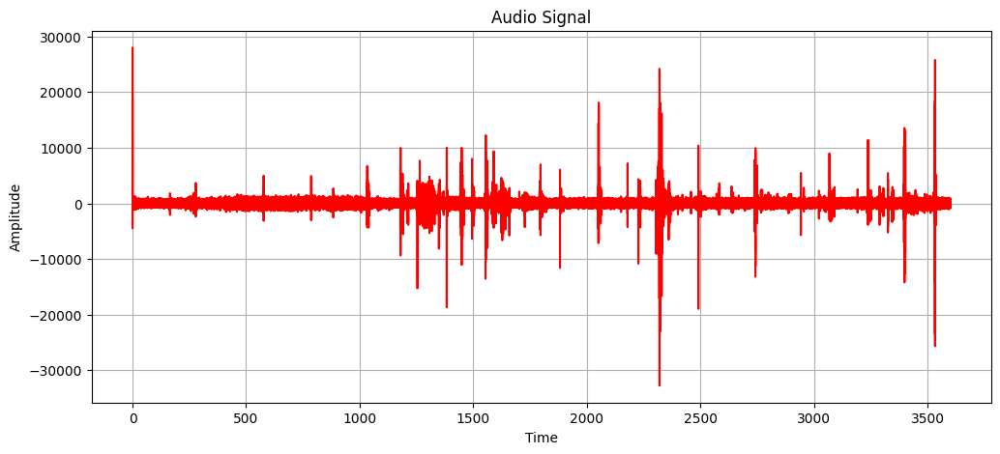

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

samples=list(file.read())
samples = [int.from_bytes(samples[i:i+2], byteorder='little', signed=True) for i in range(0, len(samples), 2)]
df_samples = pd.DataFrame({'Time': np.arange(len(samples))/sr, 'Amplitude': samples})
plt.figure(figsize=(12,5))
sns.lineplot(x='Time', y='Amplitude', data=df_samples, color='red' )
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Audio Signal")
# plt.xlim(5,10)
# plt.ylim(-700,700)
# (15,-10) 8
plt.grid(True)
plt.show()


Function to save audio file

In [ ]:
import scipy.io.wavfile as wav

def save_wav(filename, signal, sample_rate):
    wav.write(filename, sample_rate, signal.astype(np.int16))

Function to create clips(here 60secs)

In [ ]:
def make_clips(signal, fs, clip_length=60):
    num_samples_per_clip = clip_length * fs
    num_clips = len(signal) // num_samples_per_clip
    clips = []
    for i in range(num_clips):
        start = i * num_samples_per_clip
        end = start + num_samples_per_clip
        clips.append(signal[start:end])
    return clips

Viewing required segment from desired clip (this function was used when from rml files clips were extracted containing the apneic segemnt)

Clip 47:


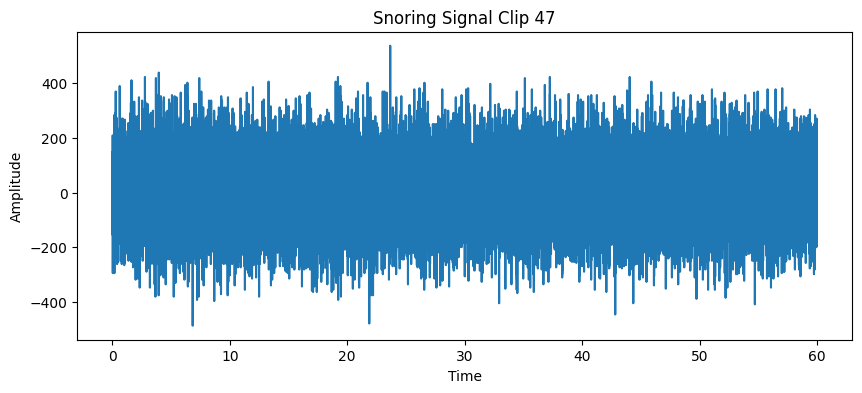

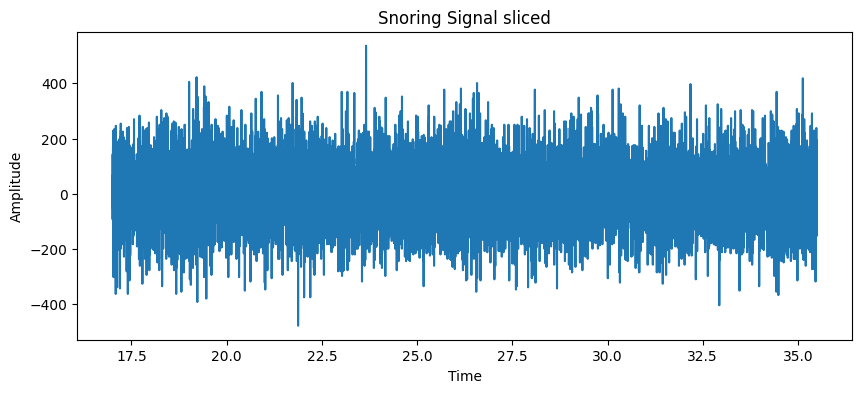

In [ ]:
# making clips
clips=make_clips(signal,sr)

import numpy as np
import matplotlib.pyplot as plt

# set limit
start_time=2777
dur=18.5

# Identify the clip index that contains the start time
clip_index = int(start_time // 60)
clip = clips[clip_index]

# plotting
for i,clip in enumerate(clips):
  if i==clip_index:
    print(f"Clip {i+1}:")
  # print(clip)
    plt.figure(figsize=(10, 4))
    # for timestamps to be shown
    plt.plot(np.arange(len(clip)) / sr, clip)
    plt.title(f'Snoring Signal Clip {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.show()


    start_sample=int((start_time%60)*sr)
    end_sample=int(start_sample+dur*sr)
    end_sample=min(end_sample,len(clip))
    trimmed_clip=clip[start_sample:end_sample]
  # for the time axis to align wrt original signal clip
    x_axis_original = np.arange(start_sample, end_sample)/sr
    plt.figure(figsize=(10, 4))
    plt.plot(x_axis_original, trimmed_clip)
    plt.title(f'Snoring Signal sliced')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
  # plt.xlim(8000,len(clip)-20000)
  # plt.ylim(-3000,3000)
    plt.show()

  # Saving
    # save_wav(f'clip_{i+1}.wav', clip, sr)
    # save_wav(f'trimmed_clip_{i+1}.wav', trimmed_clip, sr)

    # files.download(f'clip_{i+1}.wav')
    # files.download(f'trimmed_clip_{i+1}.wav')

    break;

ZCR FEATURES

Calculating ZCR Function


In [ ]:
def calzcr(frame):
    zcr=0
    for i in range(len(frame)-1):
        if (frame[i]*frame[i+1]<0):
            zcr+=i
    return zcr

Finding out ZCR


In [ ]:
clips=make_clips(signal,sr)
zcr_mean_list=[]

# here we find zcr of each clip(60secs) and then write the average value
for i,clip in enumerate(clips):
  samples,framesno=processforclip(clip)

    # Normalize the samples
  samples = samples / np.max(np.abs(samples))
  print(f"Clip {i+1}:")

  zcrvalues=[]
  for i in range(framesno):
    start=i*HOP_SIZE
    frame=samples[start:start+FRAME_SIZE]
    zcr=calzcr(frame)
    zcrvalues.append(zcr)
    # print(f"Frame {i}: ZCR= {zcr}")

# here we are doing the average for each clip if in general we would have done for whole signal then comment out the rest
  zcr_mean=np.mean(zcrvalues)
  print(f"ZCR= {zcr_mean}")
  zcr_mean_list.append(zcr_mean)





Clip 1:
ZCR= 31991.216216216217
Clip 2:
ZCR= 31475.162162162163
Clip 3:
ZCR= 33076.45945945946
Clip 4:
ZCR= 33031.0
Clip 5:
ZCR= 33335.02702702703
Clip 6:
ZCR= 33033.35135135135
Clip 7:
ZCR= 33192.62162162162
Clip 8:
ZCR= 32628.945945945947
Clip 9:
ZCR= 31331.45945945946
Clip 10:
ZCR= 31579.81081081081
Clip 11:
ZCR= 31609.54054054054
Clip 12:
ZCR= 31728.864864864863
Clip 13:
ZCR= 32217.027027027027
Clip 14:
ZCR= 33115.91891891892
Clip 15:
ZCR= 32979.45945945946
Clip 16:
ZCR= 33627.7027027027
Clip 17:
ZCR= 34312.89189189189
Clip 18:
ZCR= 33769.48648648649
Clip 19:
ZCR= 31911.297297297297
Clip 20:
ZCR= 31999.945945945947
Clip 21:
ZCR= 32783.45945945946
Clip 22:
ZCR= 34484.40540540541
Clip 23:
ZCR= 36763.51351351351
Clip 24:
ZCR= 32591.243243243243
Clip 25:
ZCR= 34960.13513513513
Clip 26:
ZCR= 33043.2972972973
Clip 27:
ZCR= 33744.75675675676
Clip 28:
ZCR= 34821.2972972973
Clip 29:
ZCR= 33070.40540540541
Clip 30:
ZCR= 32278.64864864865
Clip 31:
ZCR= 34231.94594594595
Clip 32:
ZCR= 32873.02

Plotting ZCR

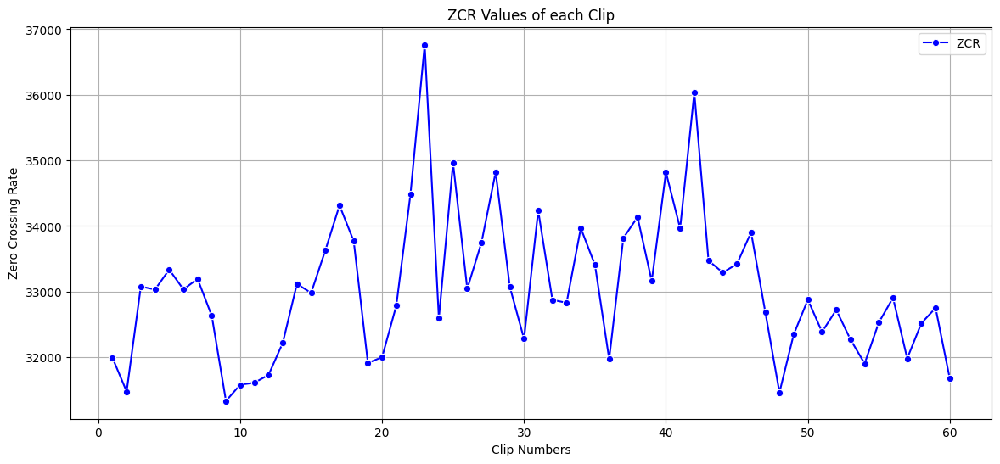

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


# plotting using only matplotlib

# plotting audio signal
# plt.figure(figsize=(14,6))

# plt.subplot(1, 2, 1)
# plt.plot(np.arange(len(samples)),samples, color='green')
# plt.xlabel("Sample Number")
# plt.ylabel("Amplitude")
# plt.title("Audio Signal")
# plt.xlim(15000, len(samples)-10000)
# plt.ylim(-800,800)
# plt.grid(True)

# # Plotting ZCR values
# plt.subplot(1, 2, 2)
# plt.plot(range(framesno), zcrvalues, marker='o', linestyle='-', color='blue', label='ZCR')
# plt.xlabel("Frame Numbers")
# plt.ylabel("Zero Crossing Rate")
# plt.title("ZCR Values of each Frame")
# plt.legend()
# plt.grid(True)

# plt.show()


# without clips then---Frame number range(framesno) zcr:zcrvalues
# plotting using seaborn


# Create a DataFrame for the ZCR values
# here we dealing with avg zcr values of frames of each clip
df_zcr = pd.DataFrame({'Clip Number': range(1, len(clips) + 1), 'ZCR': zcr_mean_list})


plt.figure(figsize=(14,6))

sns.lineplot(x='Clip Number',y='ZCR', data=df_zcr, marker='o', color='blue', label='ZCR')
plt.xlabel("Clip Numbers")
plt.ylabel("Zero Crossing Rate")
plt.title("ZCR Values of each Clip")
# plt.xlim(500,800)
# plt.ylim(20000, 50000)
plt.legend()
plt.grid(True)

plt.show()


MEAN VARIANCE FEATURES

Mean function

In [ ]:
def meanfunc(frame):
  sum=0
  for i in frame:
    sum+=i
  return sum/len(frame)

Variance Function

In [ ]:

def varfunc(frame,mean):
  sum=0
  for i in frame:
    sum+=(i-mean)**2
  return sum/len(frame)


Calculating mean and variance

In [ ]:
mean_list=[]
var_list=[]
meanm=[]
varm=[]

for i,clip in enumerate(clips):
  samples,framesno=processforclip(clip)
  print(f"Clip {i+1}:")
  for i in range(framesno):
    start=i*HOP_SIZE
    frame=samples[start:start+FRAME_SIZE]
    mean=meanfunc(frame)
    mean_list.append(mean)
    var=varfunc(frame,mean)
    var_list.append(var)
    # print(f"Frame {i}: mean={mean:.3f}, var={var:.3f}")

# similarly here we did the average fro each clip
  meanm=np.mean(mean_list)
  varm=np.mean(var_list)
  print(f"Mean={meanm:.3f}, Var={varm:.3f}")






Clip 1:
Mean=6.048, Var=68057.234
Clip 2:
Mean=6.076, Var=62512.705
Clip 3:
Mean=6.047, Var=59130.808
Clip 4:
Mean=6.070, Var=55881.007
Clip 5:
Mean=6.070, Var=56395.675
Clip 6:
Mean=6.072, Var=54923.802
Clip 7:
Mean=6.089, Var=55693.242
Clip 8:
Mean=6.087, Var=57603.594
Clip 9:
Mean=6.096, Var=61117.533
Clip 10:
Mean=6.096, Var=63776.221
Clip 11:
Mean=6.112, Var=65488.328
Clip 12:
Mean=6.132, Var=67476.374
Clip 13:
Mean=6.138, Var=68477.376
Clip 14:
Mean=6.148, Var=69321.062
Clip 15:
Mean=6.154, Var=68820.571
Clip 16:
Mean=6.164, Var=68787.153
Clip 17:
Mean=6.169, Var=68675.831
Clip 18:
Mean=6.169, Var=71526.914
Clip 19:
Mean=6.166, Var=71378.089
Clip 20:
Mean=6.163, Var=70279.347
Clip 21:
Mean=6.168, Var=70034.389
Clip 22:
Mean=6.166, Var=73450.081
Clip 23:
Mean=6.172, Var=78287.240
Clip 24:
Mean=6.173, Var=80409.532
Clip 25:
Mean=6.180, Var=94009.795
Clip 26:
Mean=6.183, Var=93122.868
Clip 27:
Mean=6.185, Var=95171.863
Clip 28:
Mean=6.189, Var=98475.364
Clip 29:
Mean=6.192, Var=9688

Plotting graph for mean and variance

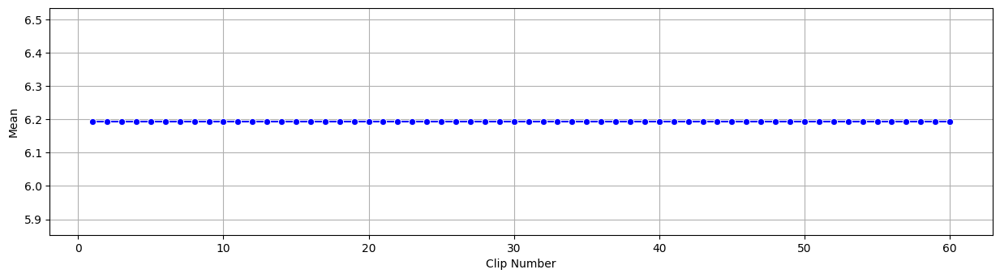

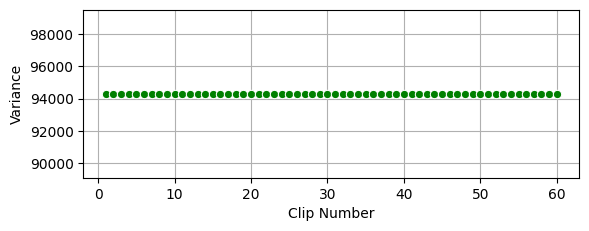

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# without clips then---Frame number range(framesno) mean:meanlist
# plotting graph for whole signal

df_mean=pd.DataFrame({'Clip Number': range(1, len(clips) + 1), 'Mean':meanm})
df_var=pd.DataFrame({'Clip Number':  range(1, len(clips) + 1), 'Variance':varm})

plt.figure(figsize=(15,8))

plt.subplot(2,1,1)
sns.lineplot(x='Clip Number', y='Mean', marker='o', data=df_mean, color='blue')
plt.xlabel("Clip Number")
plt.ylabel("Mean")
# plt.xlim(50,100)
# plt.ylim(-30,30)
plt.grid(True)
plt.show()

plt.subplot(2,1,2)
sns.lineplot(x='Clip Number', y='Variance', marker='o', data=df_var, color='green')
plt.xlabel("Clip Number")
plt.ylabel("Variance")
# plt.xlim(50,100)
# plt.ylim(38820,38830)
plt.grid(True)
plt.show()



MFCC and DELTA mfcc


Pre-emphasis function


In [ ]:
import numpy as np

def pre_emphasis(signal, pre_emphasis_coeff):
    return np.append(signal[0], signal[1:] - pre_emphasis_coeff * signal[:-1])




Window function

In [ ]:
def windowing(frames):
    hamming_window = np.hamming(frames.shape[1])
    return frames * hamming_window


Fast Fourier Transform function

In [ ]:
def fft(frames, NFFT=512):
    return np.fft.rfft(frames, NFFT)


Mel filter function

In [ ]:
def mel_filter_bank(sr, NFFT=512, n_mel=40):
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sr / 2) / 700))
    mel_points = np.linspace(low_freq_mel, high_freq_mel, n_mel + 2)
    hz_points = (700 * (10**(mel_points / 2595) - 1))
    bin = np.floor((NFFT + 1) * hz_points / sr)
    fbank = np.zeros((n_mel, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, n_mel + 1):
        f_m_minus = int(bin[m - 1])
        f_m = int(bin[m])
        f_m_plus = int(bin[m + 1])
        for k in range(f_m_minus, f_m):
            fbank[m - 1, k] = (k - bin[m - 1]) / (bin[m] - bin[m - 1])
        for k in range(f_m, f_m_plus):
            fbank[m - 1, k] = (bin[m + 1] - k) / (bin[m + 1] - bin[m])
    return fbank, hz_points


Discrete Cosine Transform function


In [ ]:
def dct(mel_log_spectrogram, num_ceps=13):
    n_frames, n_mel = mel_log_spectrogram.shape
    dct_filters = np.zeros((num_ceps, n_mel))
    for i in range(num_ceps):
        for j in range(n_mel):
            dct_filters[i, j] = np.cos(np.pi * i * (2 * j + 1) / (2 * n_mel))
    return np.dot(mel_log_spectrogram, dct_filters.T)


Delta Mfcc function

In [ ]:
def delta(mfcc, N=2):
    num_frames = len(mfcc)
    denominator = 2 * sum([i**2 for i in range(1, N+1)])
    delta_feat = np.empty_like(mfcc)
    padded = np.pad(mfcc, ((N, N), (0, 0)), mode='edge')
    for t in range(num_frames):
        delta_feat[t] = np.sum([n * (padded[t + n] - padded[t - n]) for n in range(1, N + 1)], axis=0) / denominator
    return delta_feat


Calling all the functions for mfcc

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd



FRAME_SIZE = 400
HOP_SIZE = 200
NFFT = 512
NUM_MEL = 40
NUM_CEPS = 13
PRE_EMPHASIS_COEFF = 0.97



def compute_mfccs(signal, fs):
  pre_emphasized_signal = pre_emphasis(signal, PRE_EMPHASIS_COEFF)

# framing
  samples = list(pre_emphasized_signal)
  samples = [int(samples[i]) for i in range(0, len(samples))]  # Ensure samples are integers
  samplesno = len(samples)
  framesno = (samplesno - FRAME_SIZE) // HOP_SIZE + 1


  print(f"Number of samples: {samplesno}")
  print(f"Number of frames: {framesno}")

  framesar=[]
  for i in range(framesno):
      start = i * HOP_SIZE
      frame = samples[start:start + FRAME_SIZE]
      framesar.append(frame)

  framesar=np.array(framesar)

  # plotting frames
  # plt.figure(figsize=(14, 5))
  # plt.plot(frames[0])
  # plt.title('First Frame of the Signal')
  # plt.xlabel('Samples')
  # plt.ylabel('Amplitude')
  # plt.show()


  windowed_frames = windowing(framesar)

  fft_frames = fft(windowed_frames, NFFT)
  power_spectrum = ((1.0 / NFFT) * ((np.abs(fft_frames)) ** 2))


  fbank ,hz_points = mel_filter_bank(sr, NFFT, NUM_MEL)
  mel_spectrogram = np.dot(power_spectrum, fbank.T)

  #Log function
  log_mel_spectrogram = np.log(mel_spectrogram + 1e-9)
  mfccs = dct(log_mel_spectrogram, NUM_CEPS)
  delta_mfccs = delta(mfccs)

  # Convert to decibel scale
  mel_spectrogram_db = 10 * np.log10(mel_spectrogram + 1e-9)

  return framesar, fft_frames,hz_points, mel_spectrogram, mfccs, delta_mfccs


To calculate mfcc and delta mfcc for each clip


Number of samples: 30000
Number of frames: 149
MFCCs for clip 0: 25.368
Delta MFCCs for clip 0:-0.007


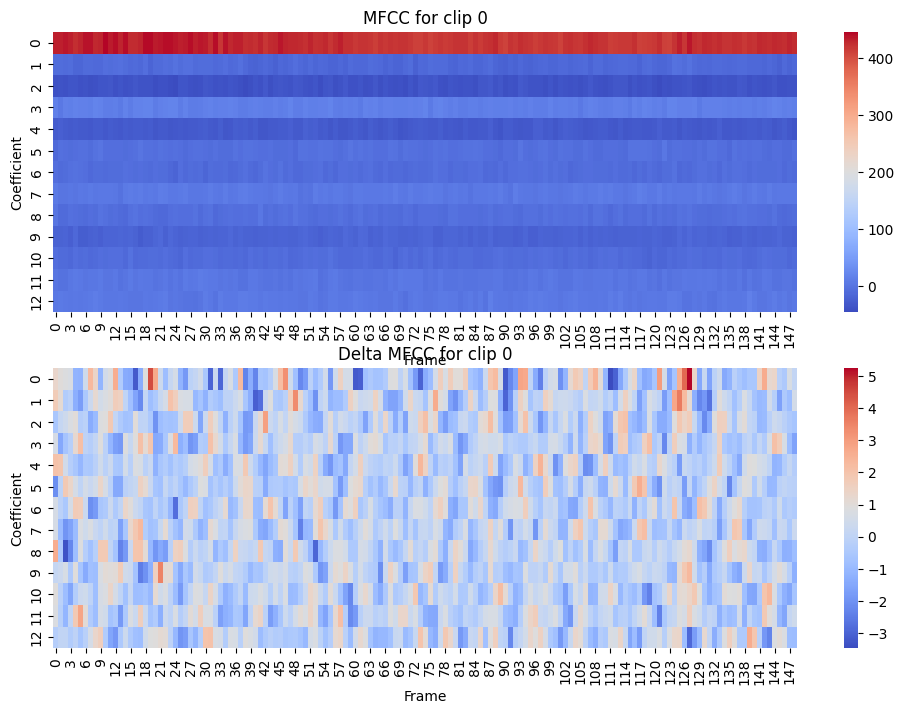

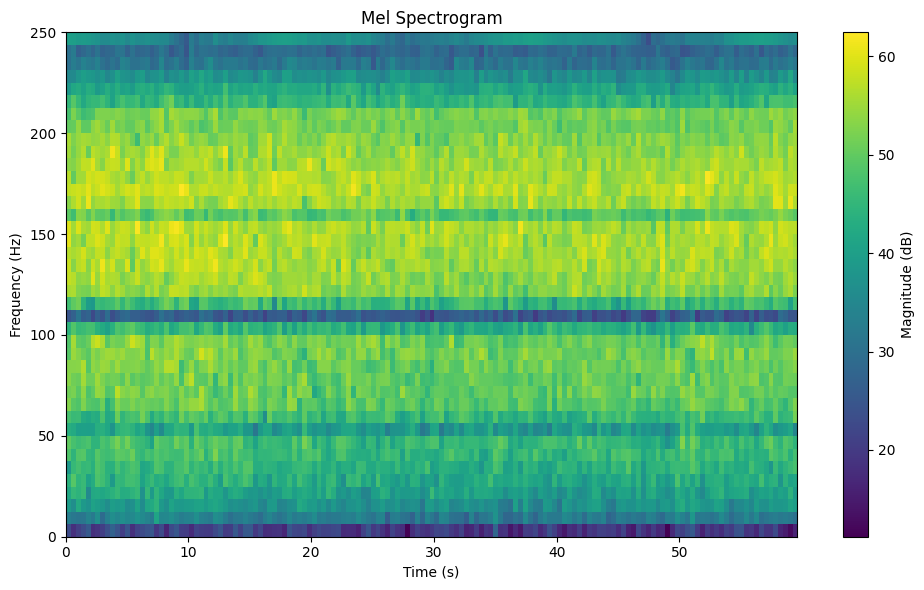

Number of samples: 30000
Number of frames: 149
MFCCs for clip 1: 25.052
Delta MFCCs for clip 1:0.003


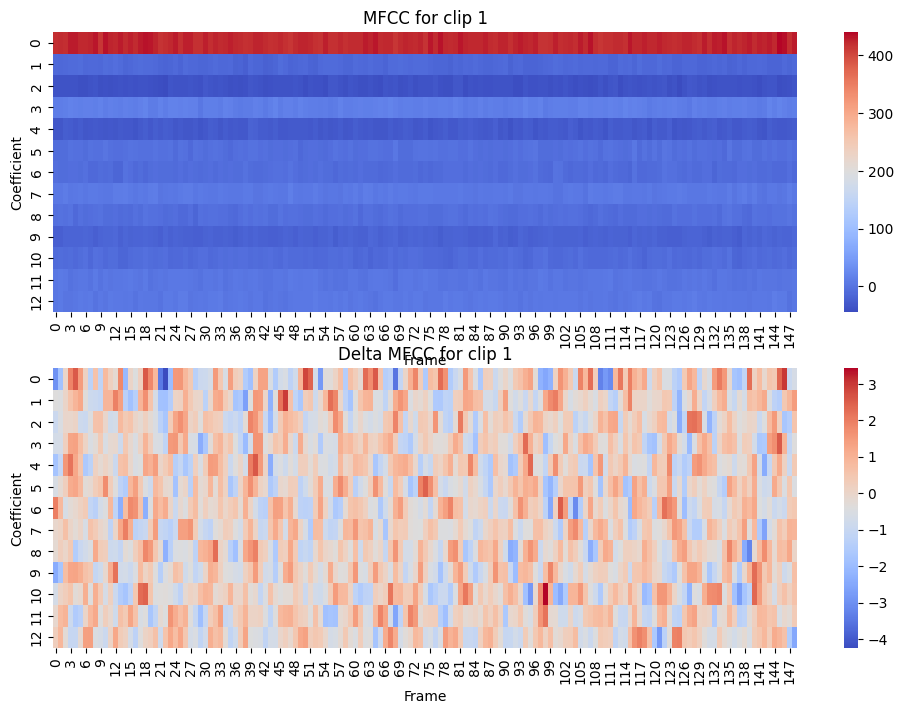

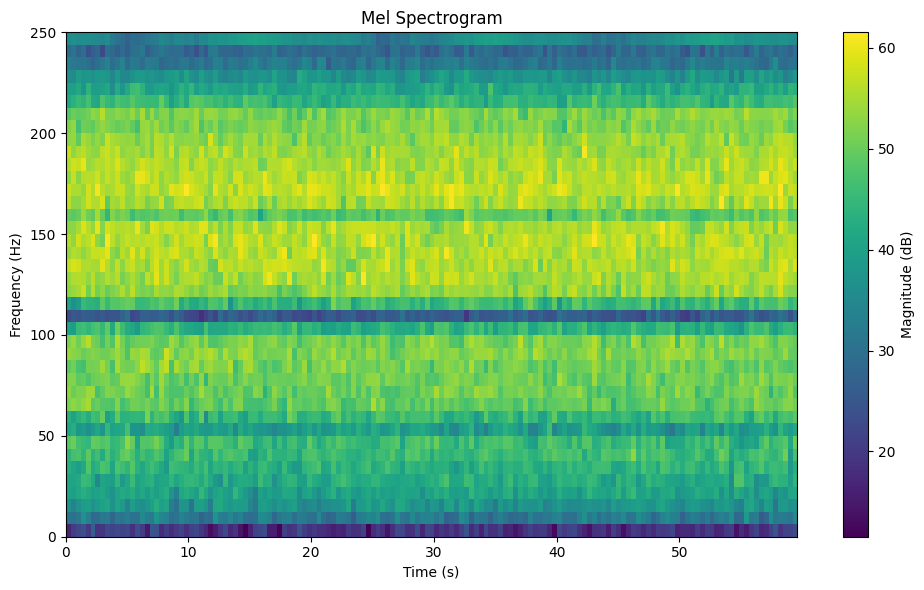

Number of samples: 30000
Number of frames: 149
MFCCs for clip 2: 24.772
Delta MFCCs for clip 2:-0.004


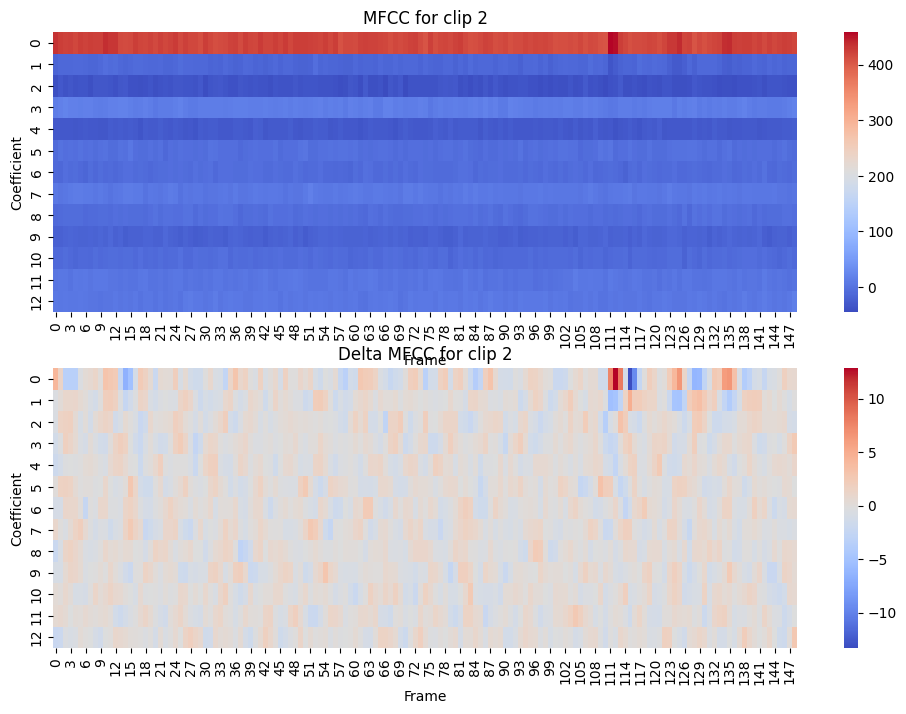

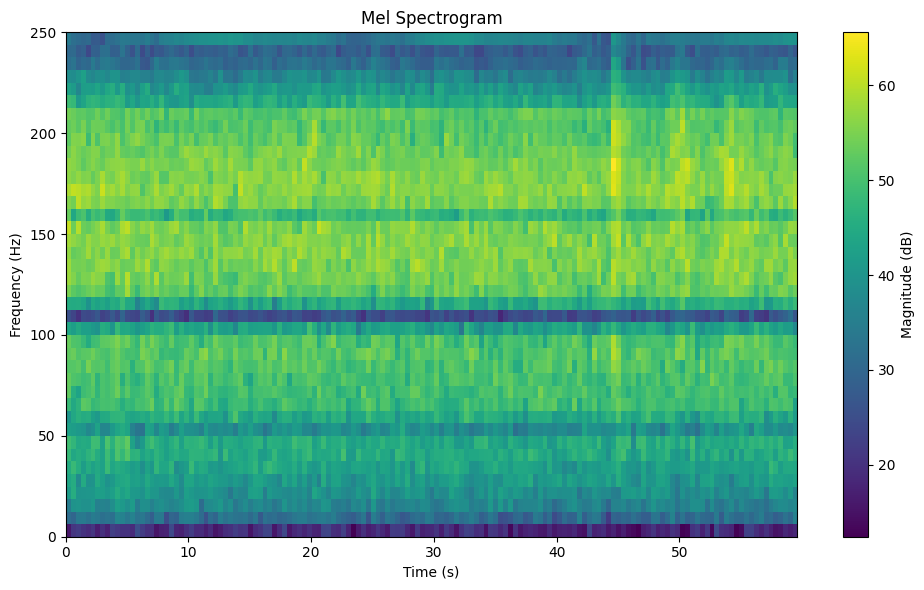

Number of samples: 30000
Number of frames: 149
MFCCs for clip 3: 24.479
Delta MFCCs for clip 3:0.002


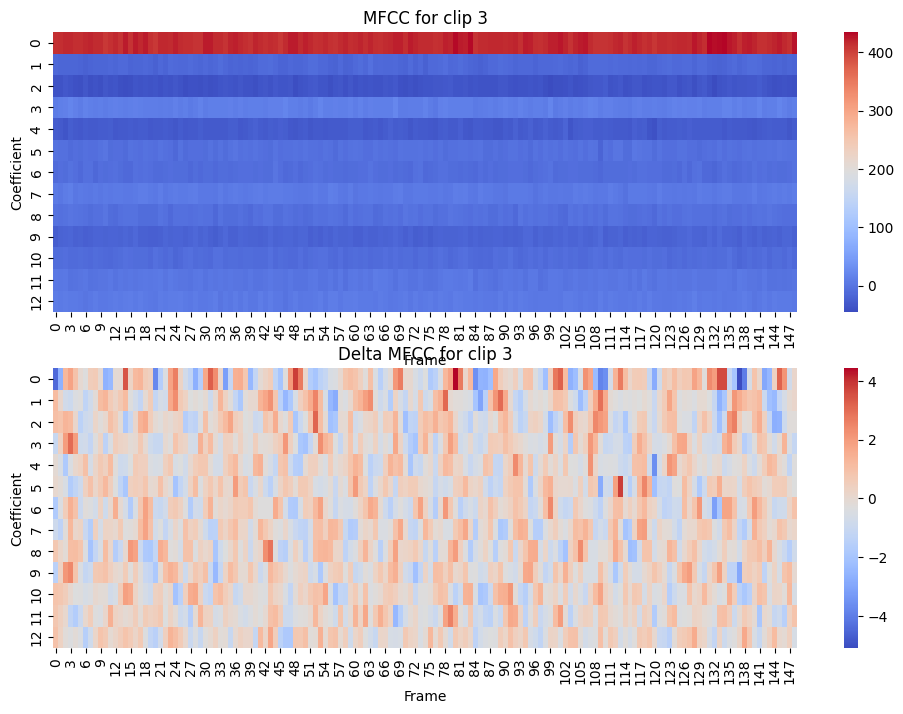

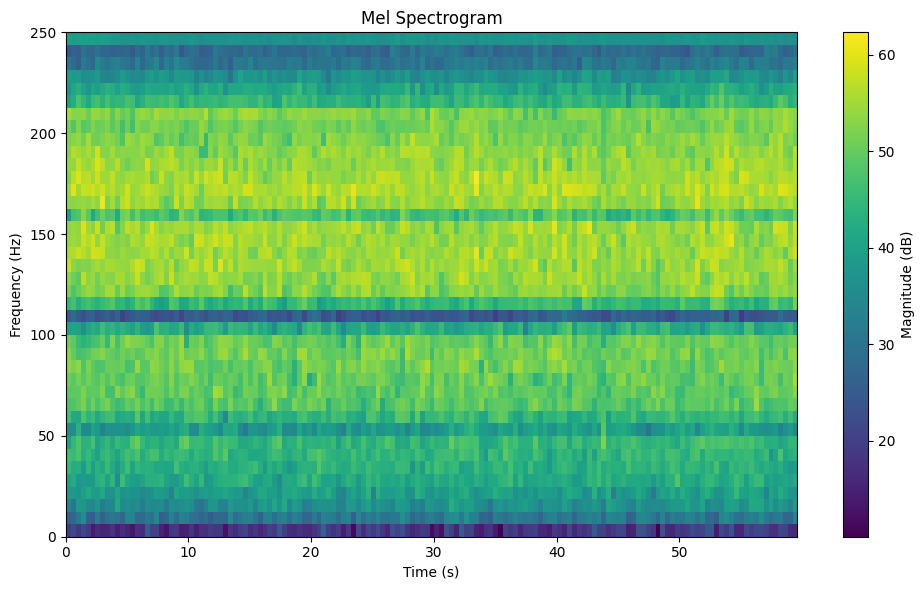

Number of samples: 30000
Number of frames: 149
MFCCs for clip 4: 24.766
Delta MFCCs for clip 4:-0.000


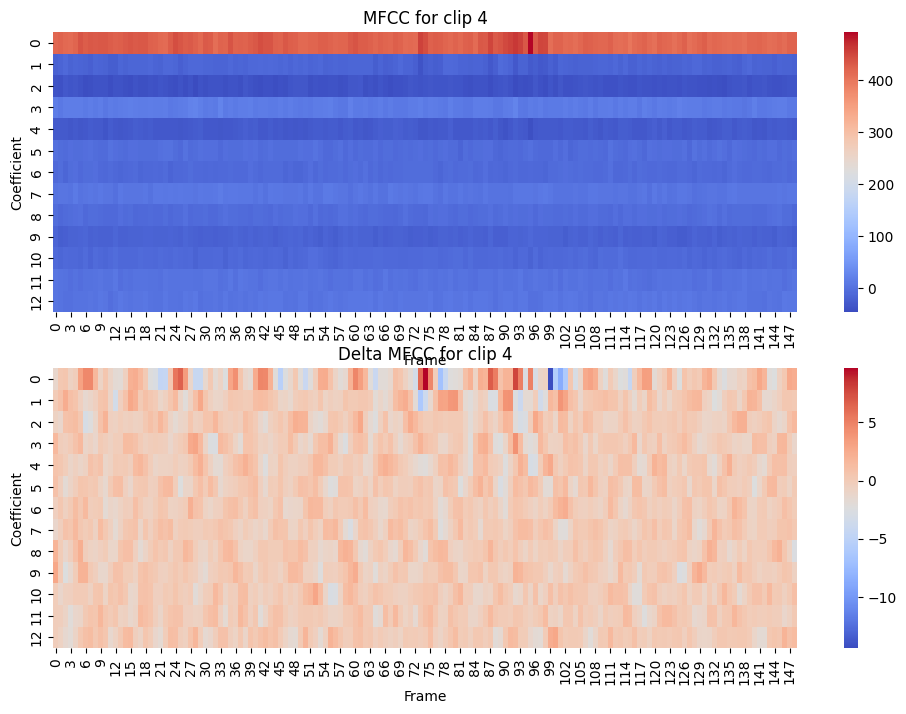

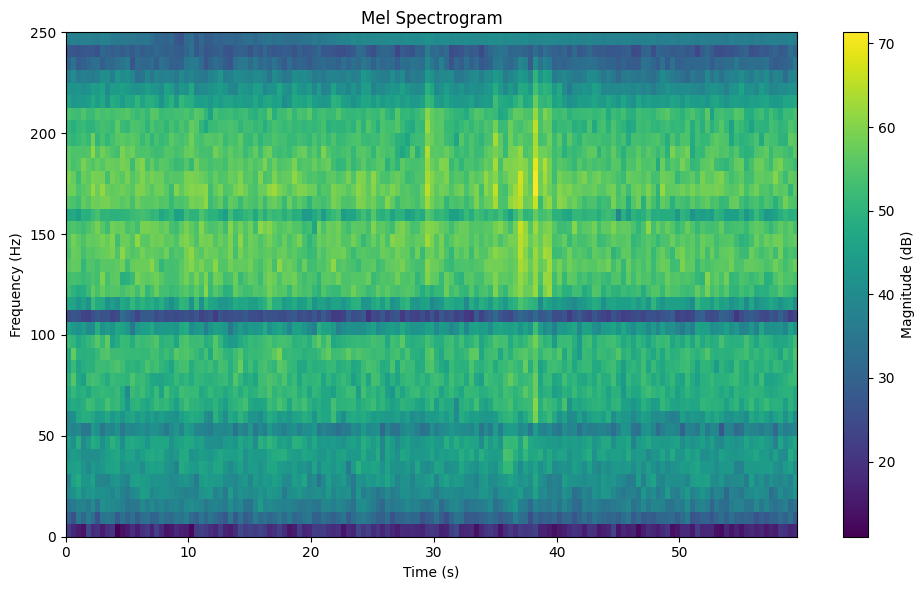

Number of samples: 30000
Number of frames: 149
MFCCs for clip 5: 24.589
Delta MFCCs for clip 5:0.002


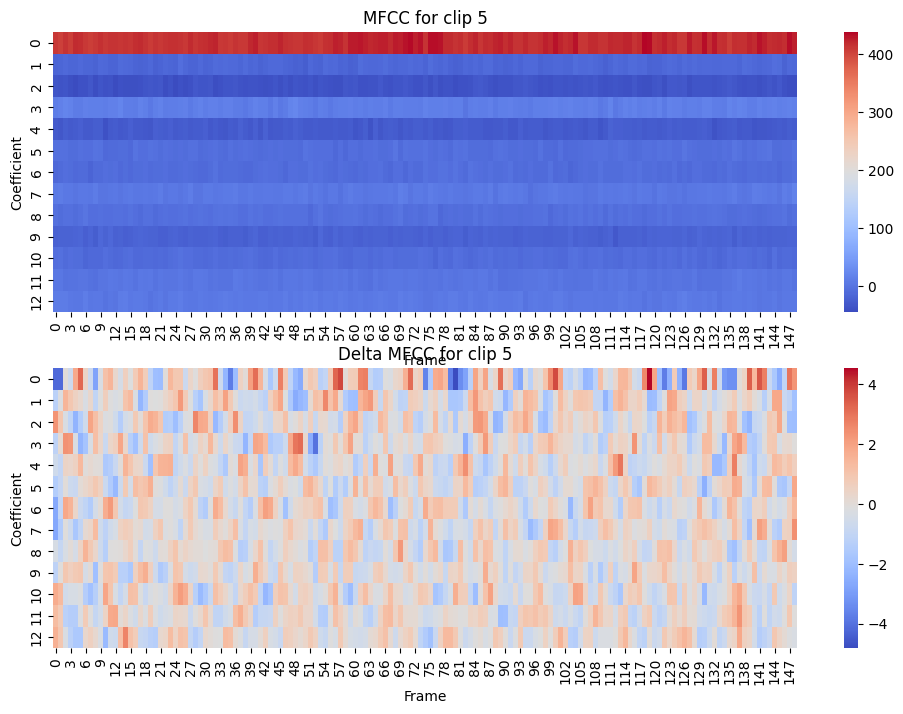

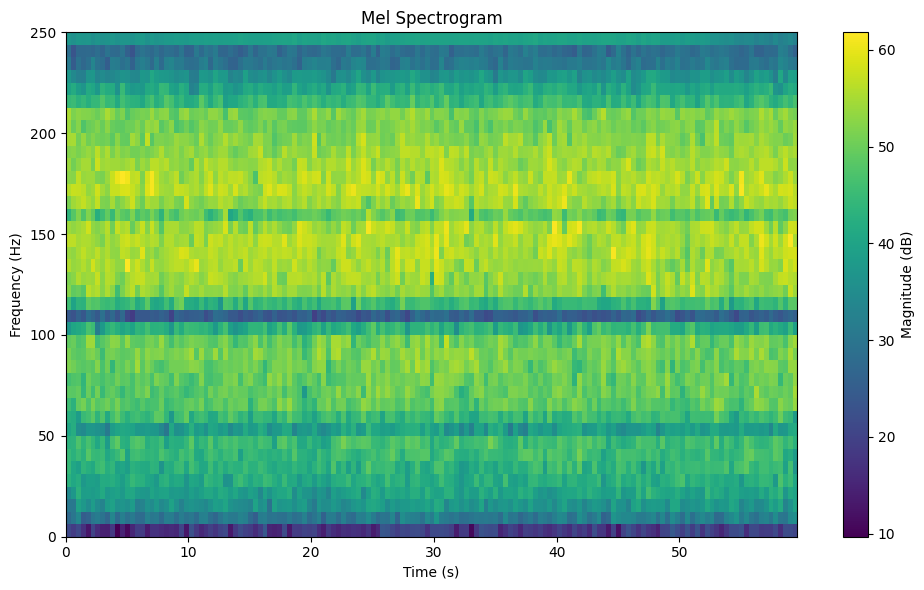

Number of samples: 30000
Number of frames: 149
MFCCs for clip 6: 25.176
Delta MFCCs for clip 6:0.008


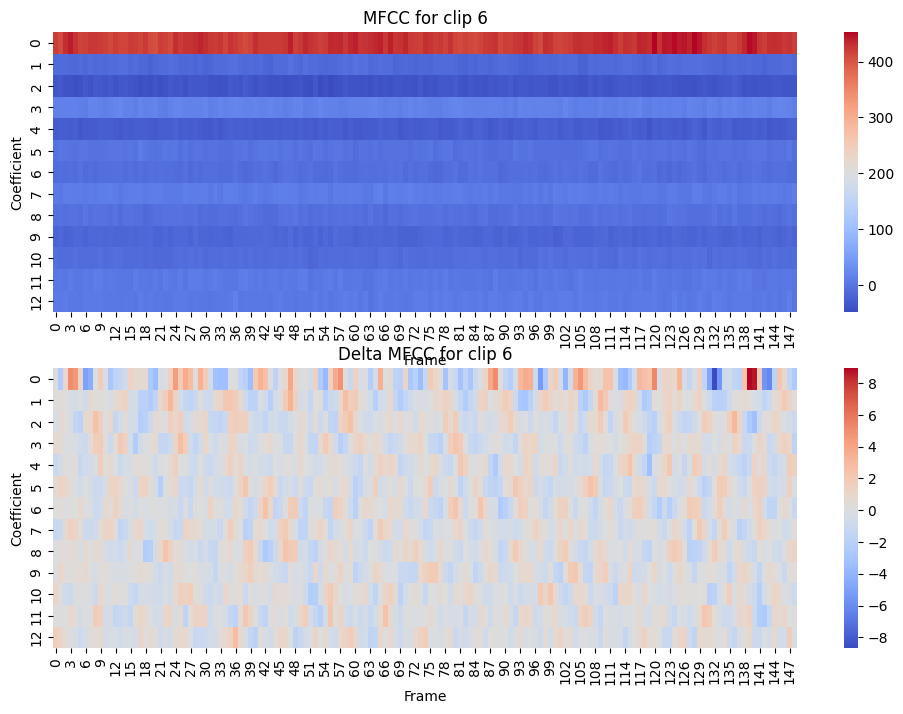

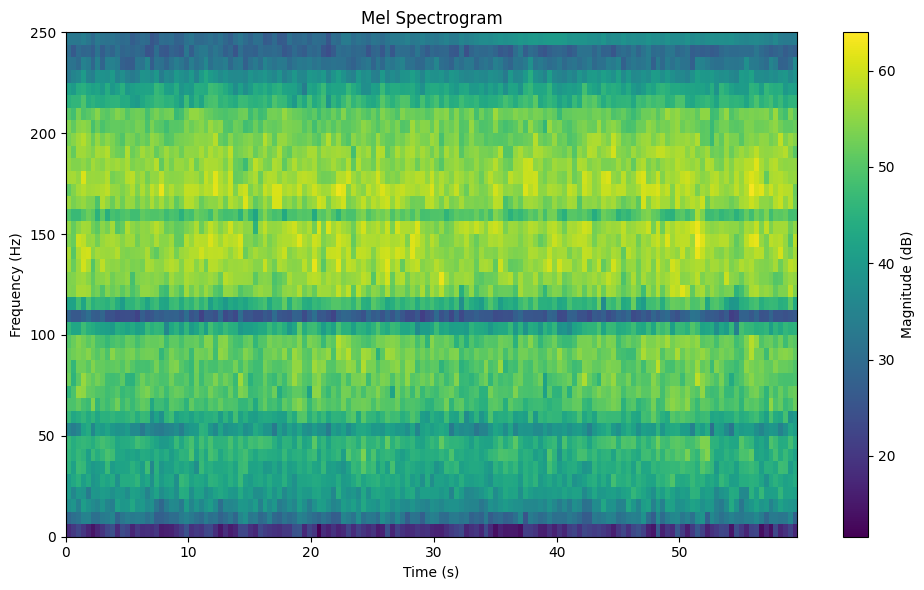

Number of samples: 30000
Number of frames: 149
MFCCs for clip 7: 25.959
Delta MFCCs for clip 7:0.005


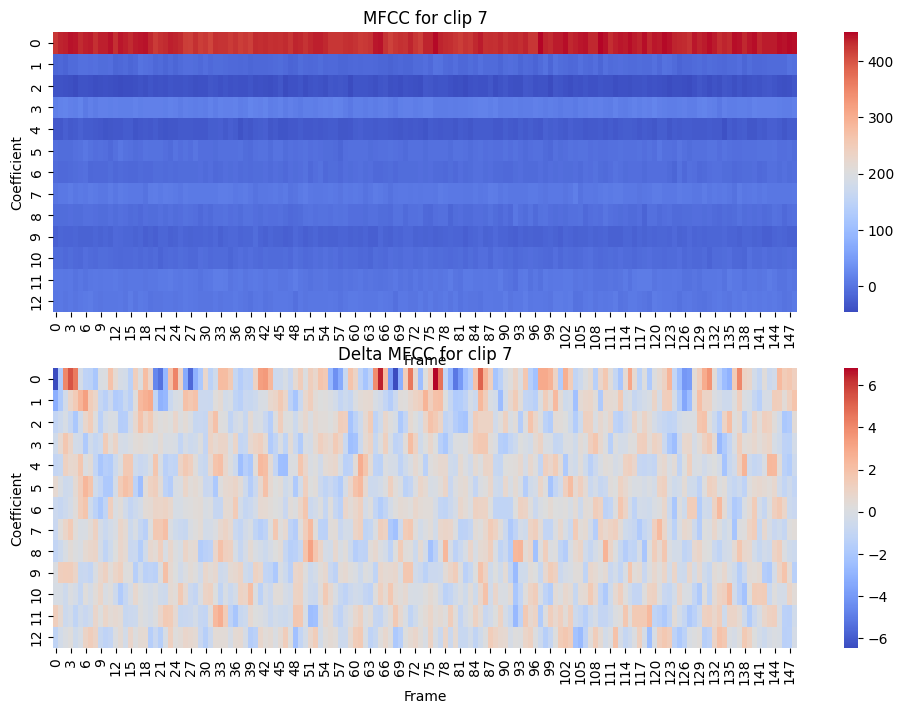

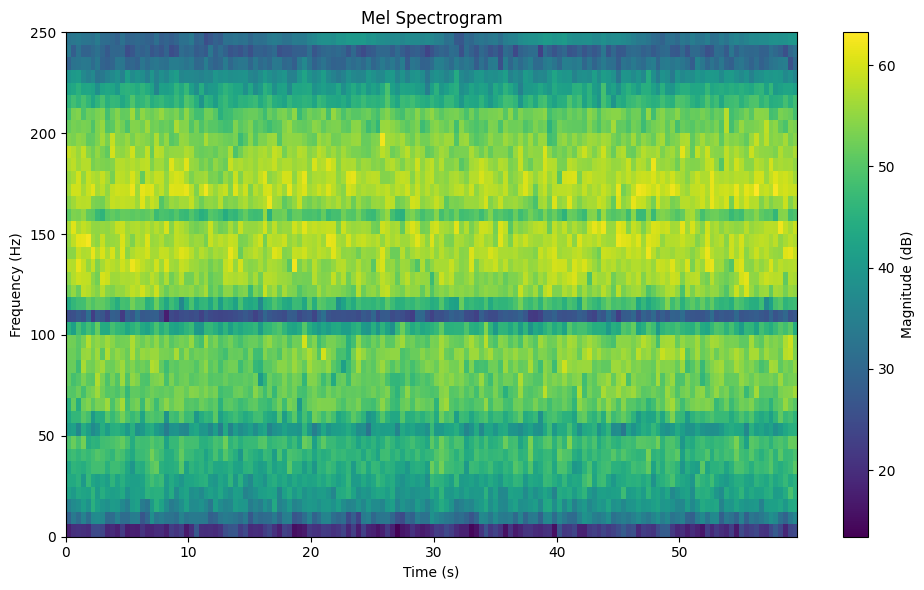

Number of samples: 30000
Number of frames: 149
MFCCs for clip 8: 26.494
Delta MFCCs for clip 8:0.002


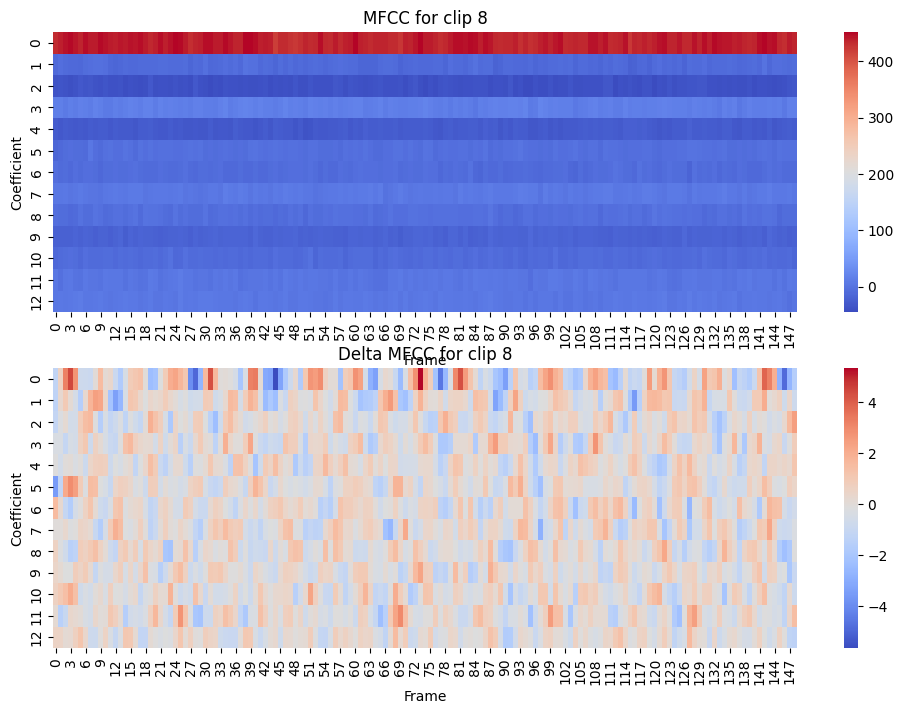

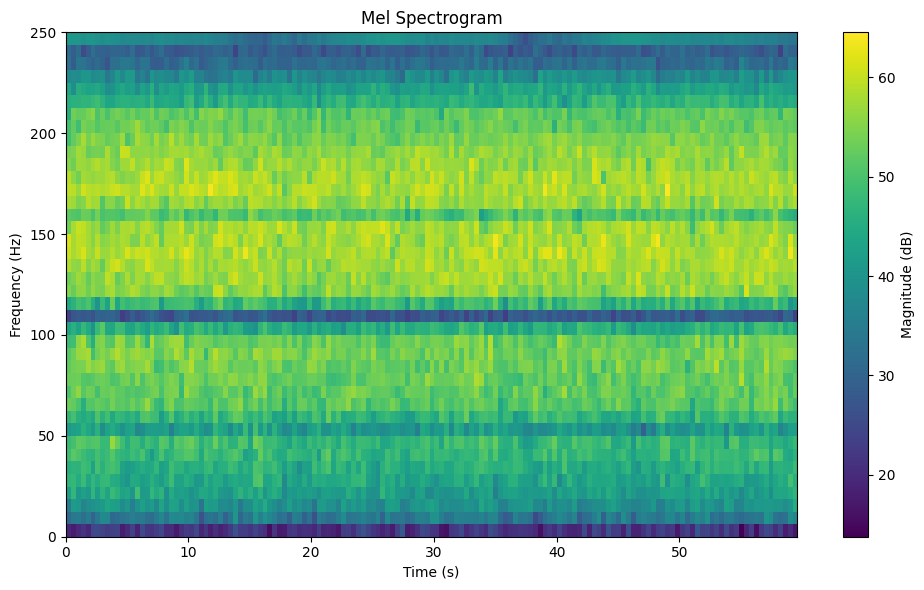

Number of samples: 30000
Number of frames: 149
MFCCs for clip 9: 26.548
Delta MFCCs for clip 9:-0.004


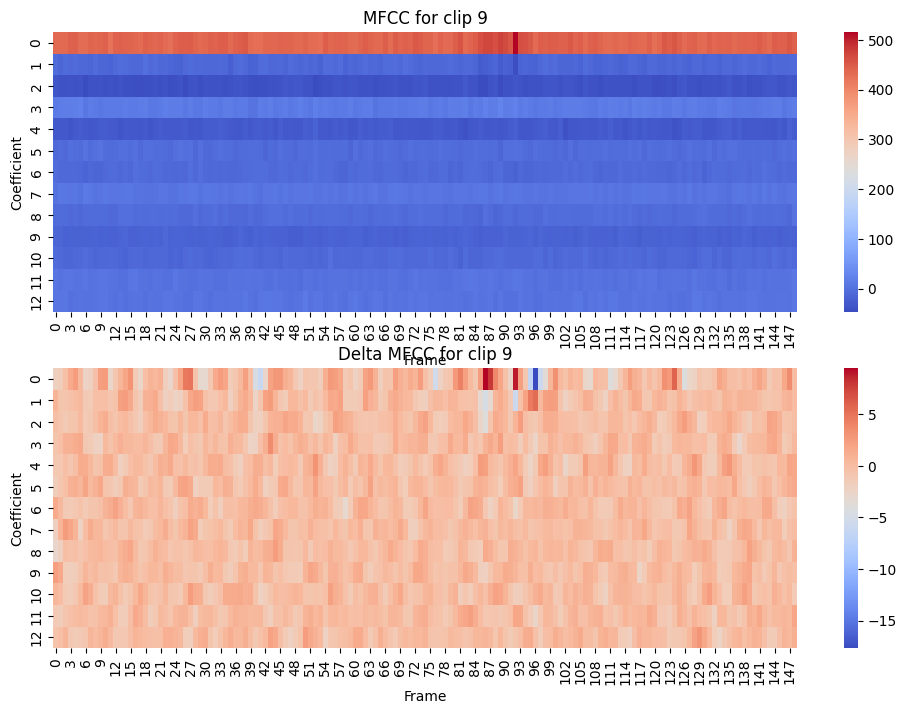

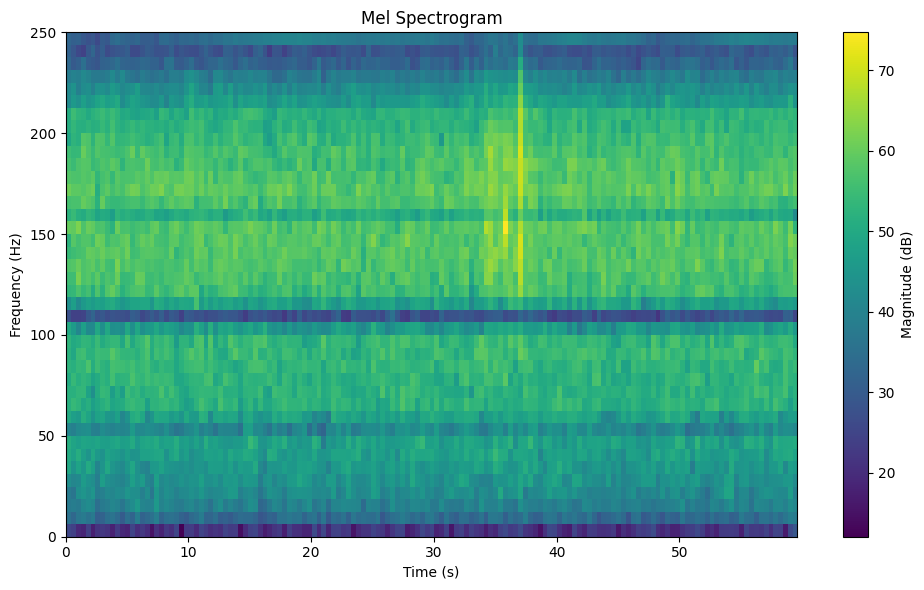

Number of samples: 30000
Number of frames: 149
MFCCs for clip 10: 26.377
Delta MFCCs for clip 10:0.008


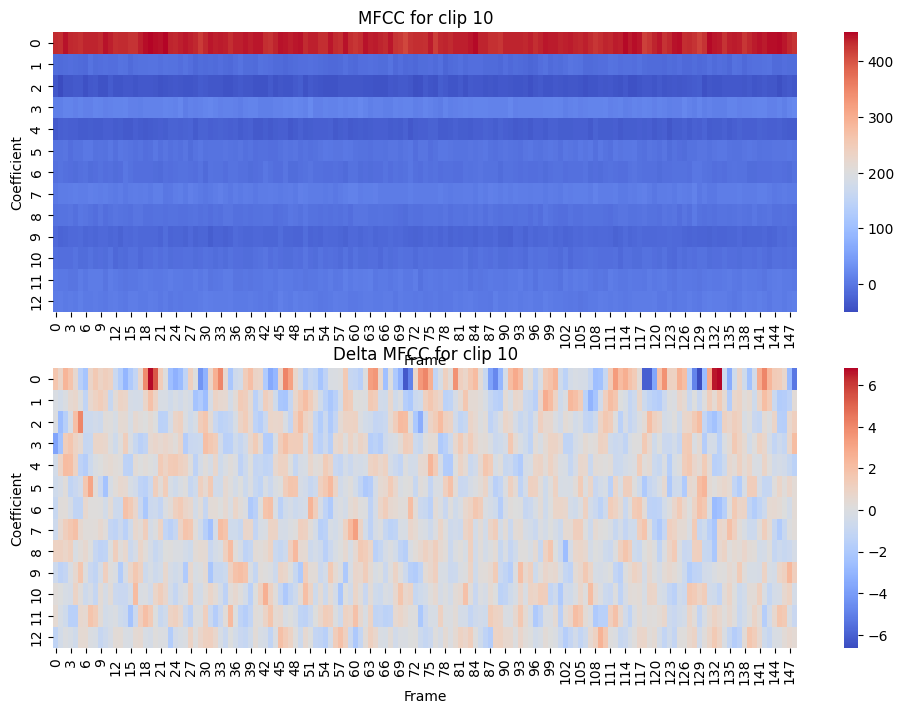

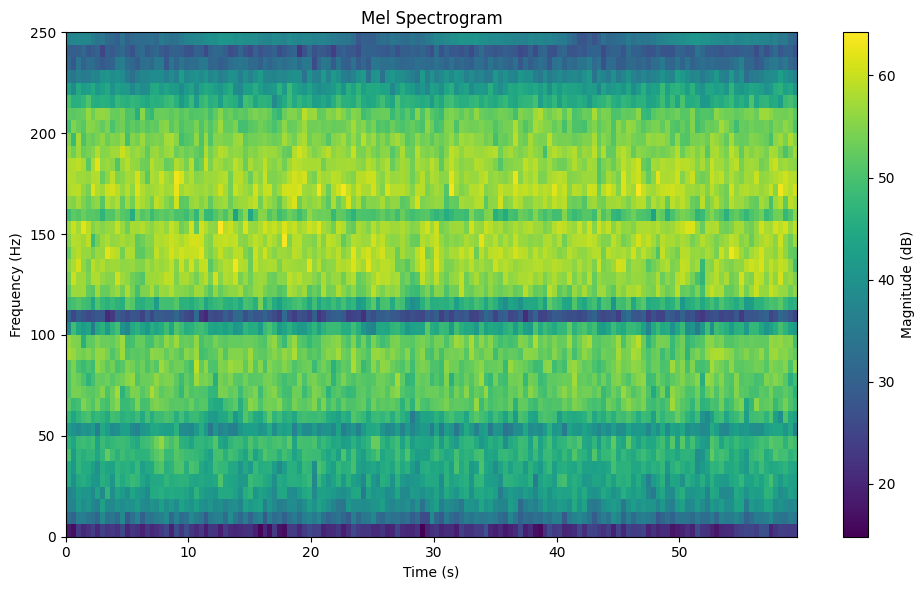

Number of samples: 30000
Number of frames: 149
MFCCs for clip 11: 26.433
Delta MFCCs for clip 11:0.009


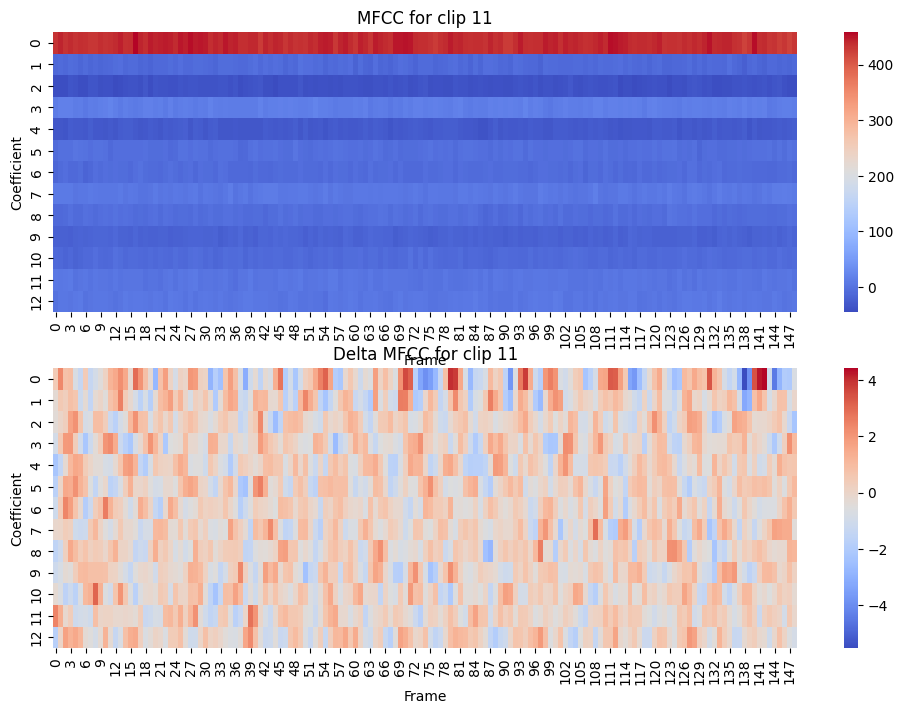

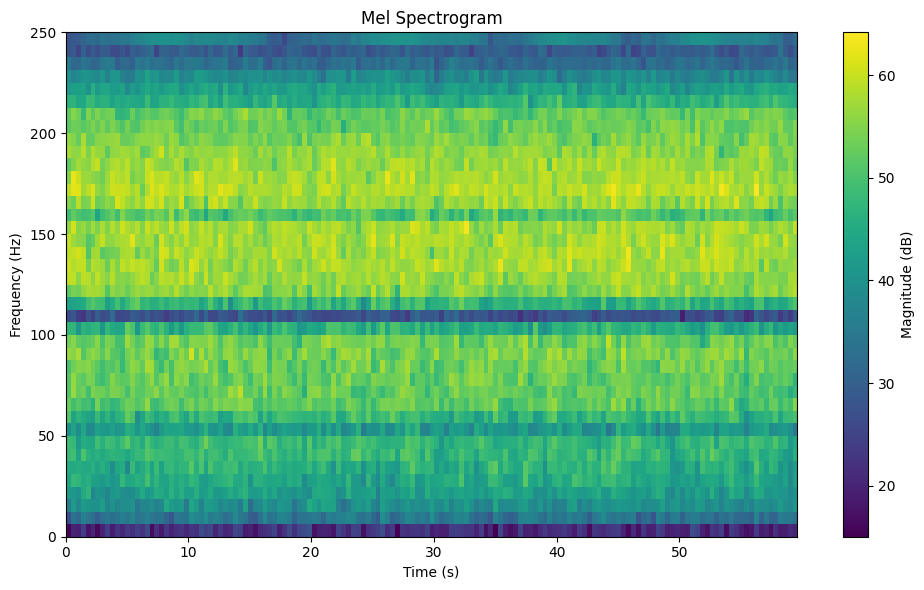

Number of samples: 30000
Number of frames: 149
MFCCs for clip 12: 26.001
Delta MFCCs for clip 12:-0.010


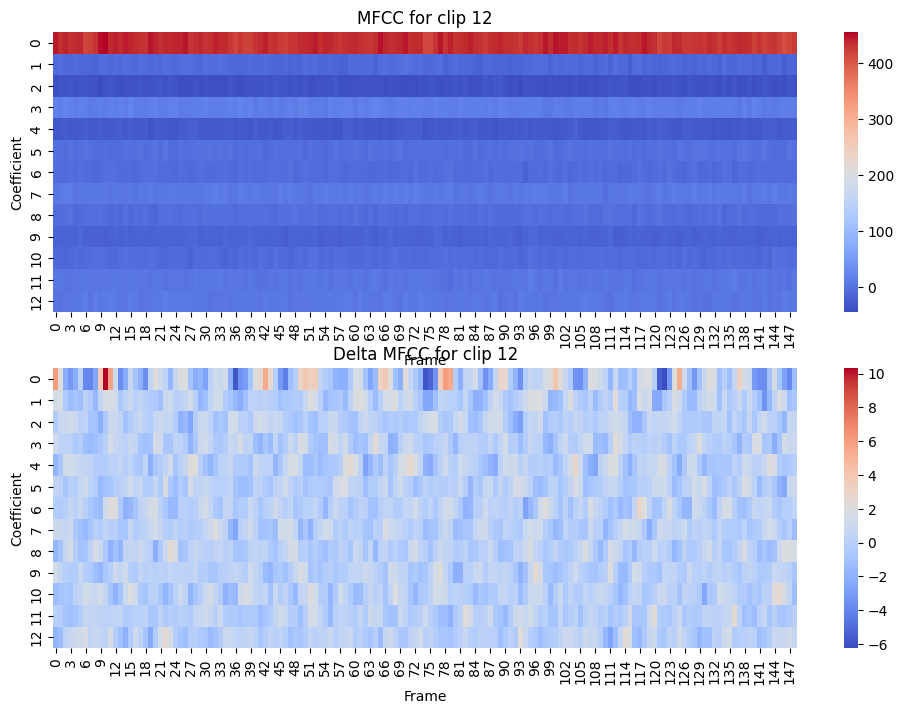

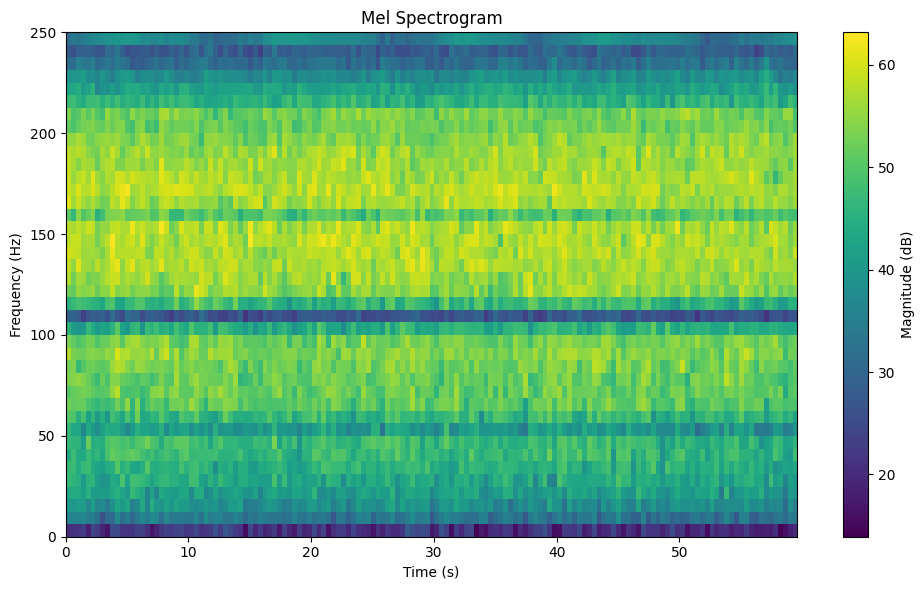

Number of samples: 30000
Number of frames: 149
MFCCs for clip 13: 25.236
Delta MFCCs for clip 13:-0.011


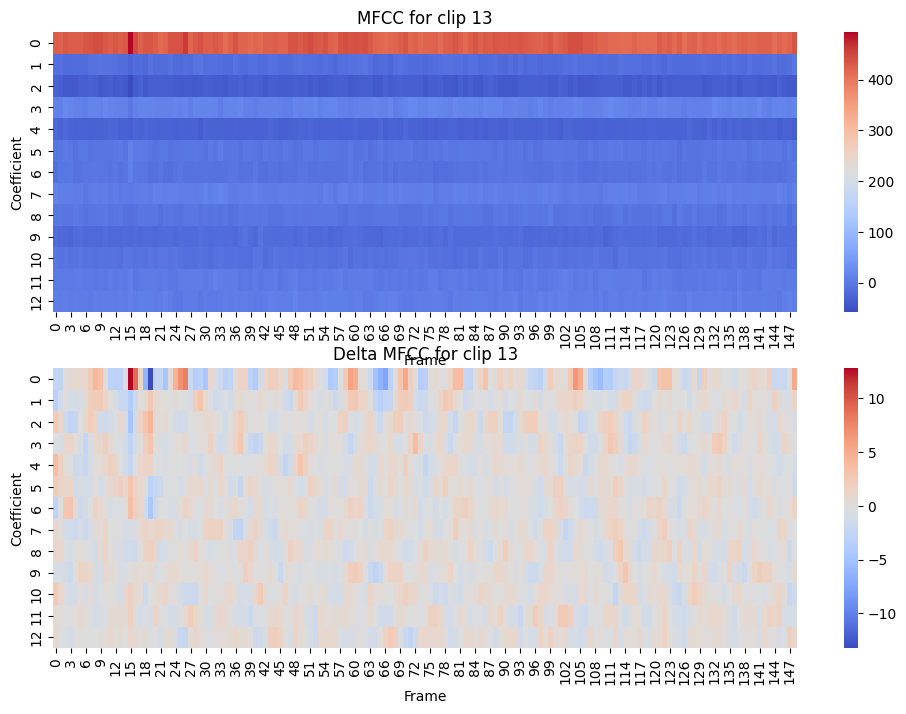

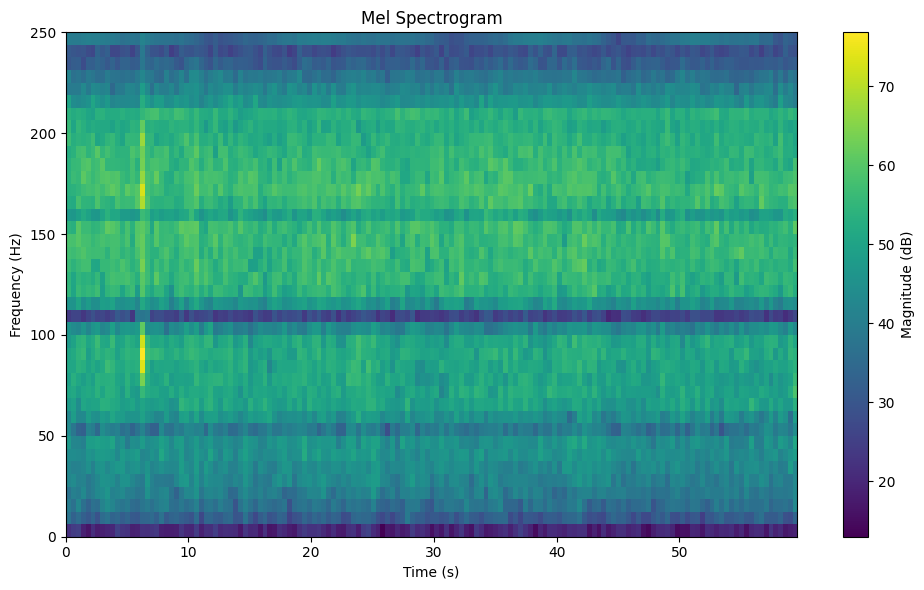

Number of samples: 30000
Number of frames: 149
MFCCs for clip 14: 25.592
Delta MFCCs for clip 14:0.013


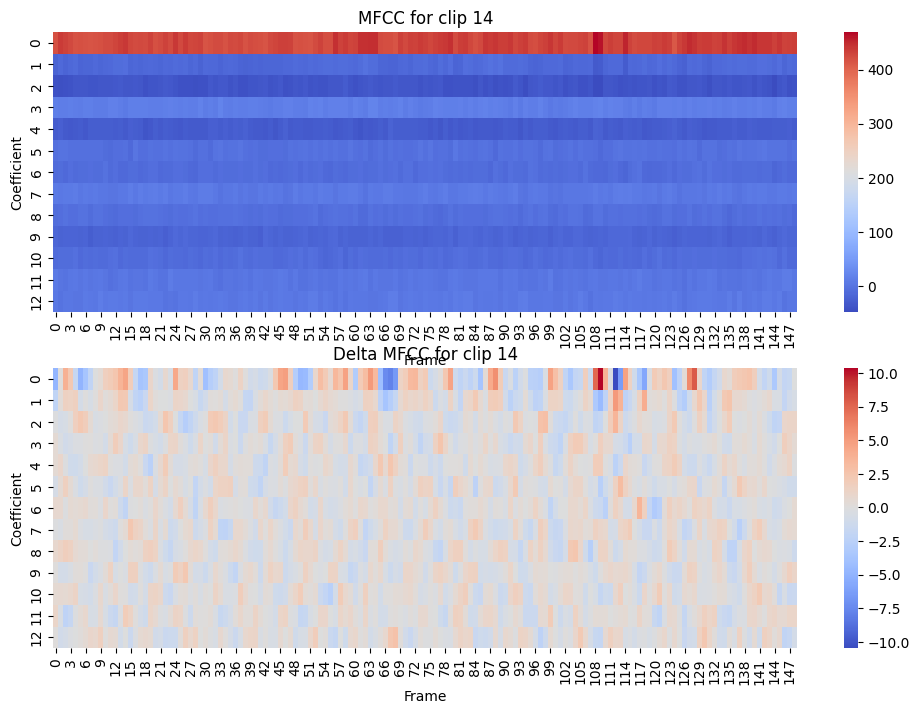

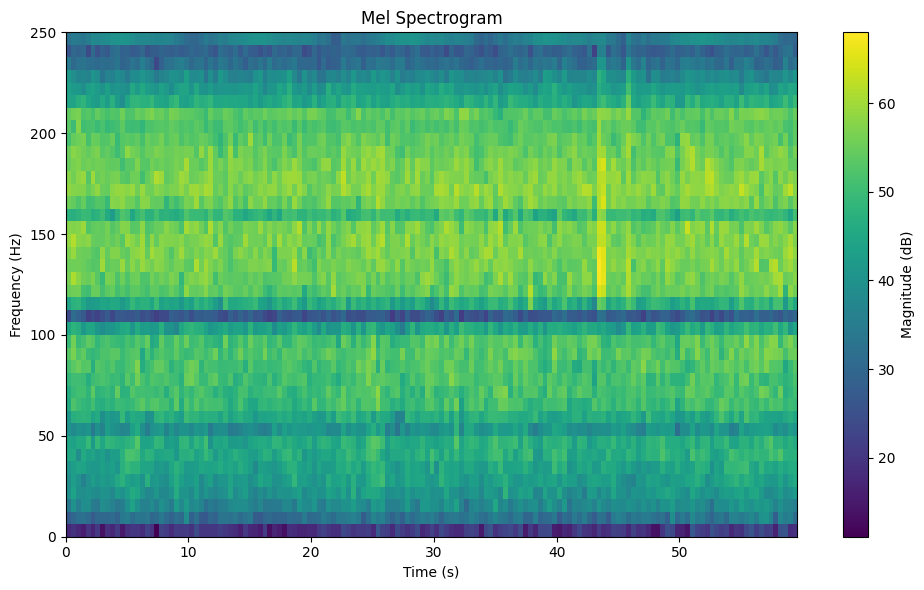

Number of samples: 30000
Number of frames: 149
MFCCs for clip 15: 25.427
Delta MFCCs for clip 15:-0.007


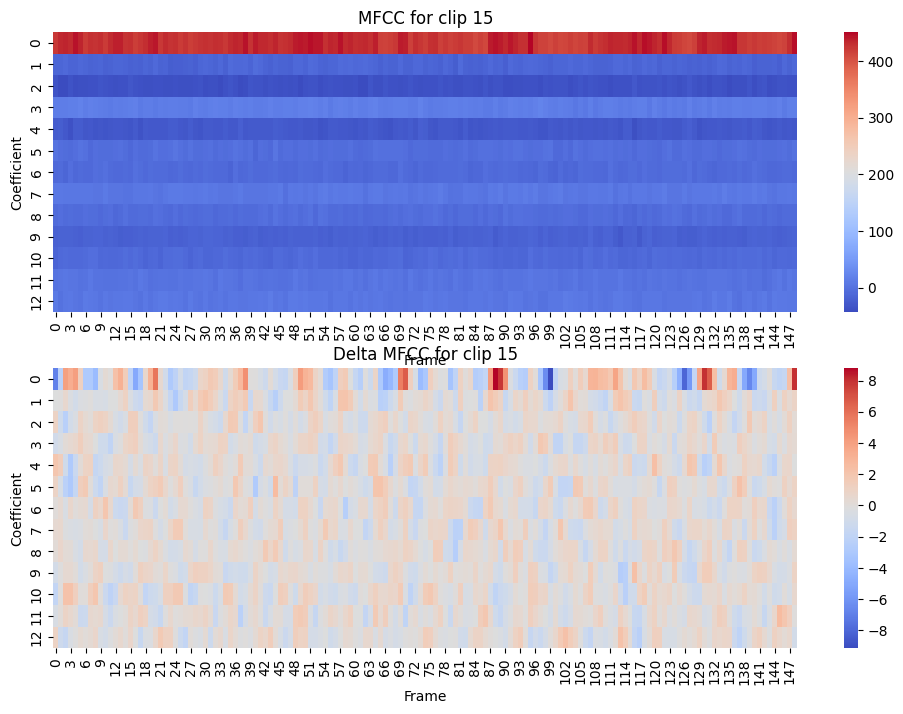

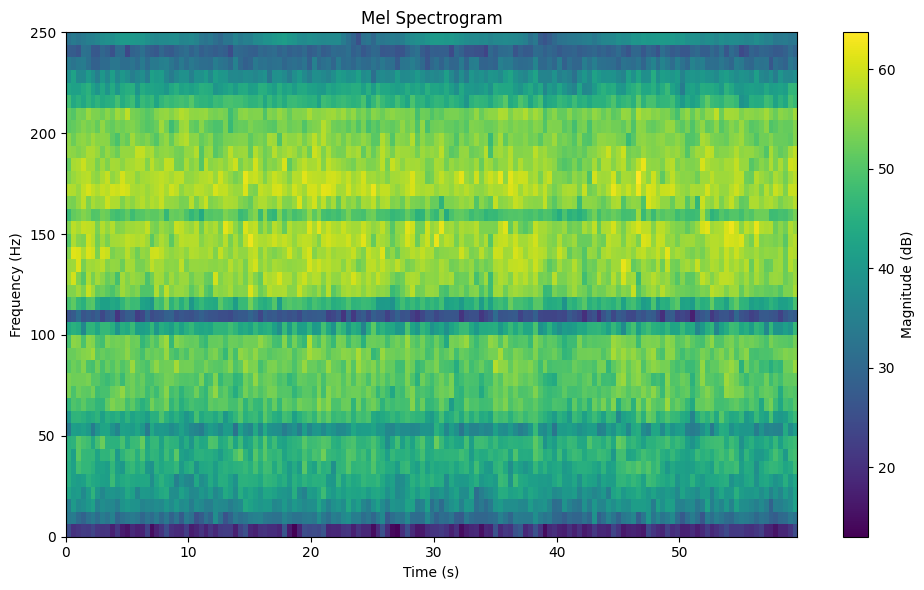

Number of samples: 30000
Number of frames: 149
MFCCs for clip 16: 25.418
Delta MFCCs for clip 16:-0.010


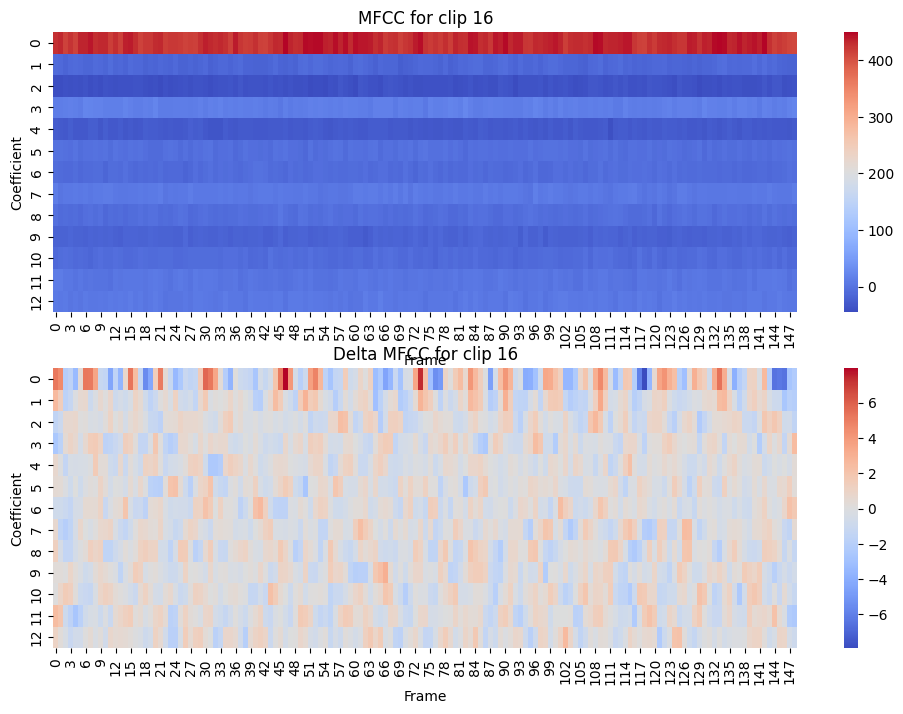

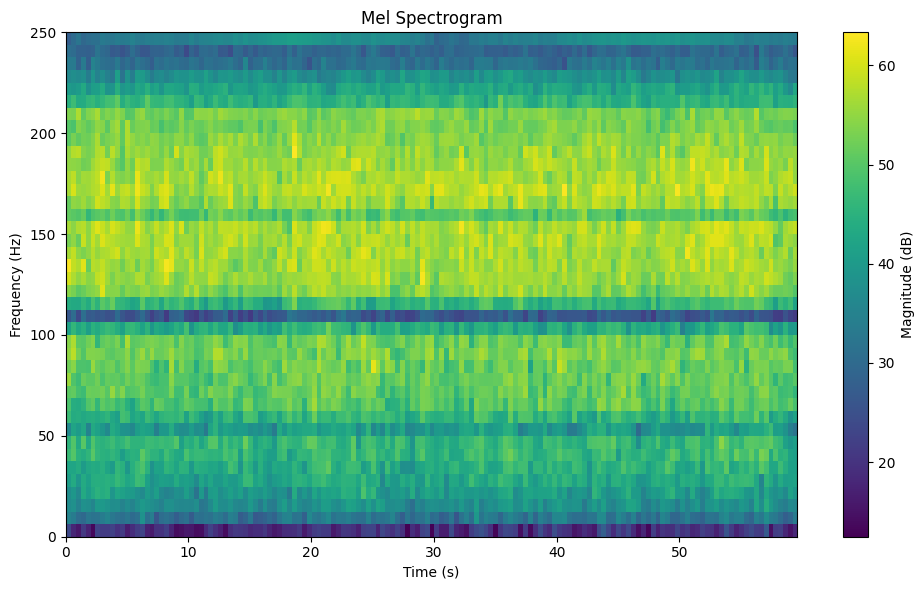

Number of samples: 30000
Number of frames: 149
MFCCs for clip 17: 25.495
Delta MFCCs for clip 17:0.003


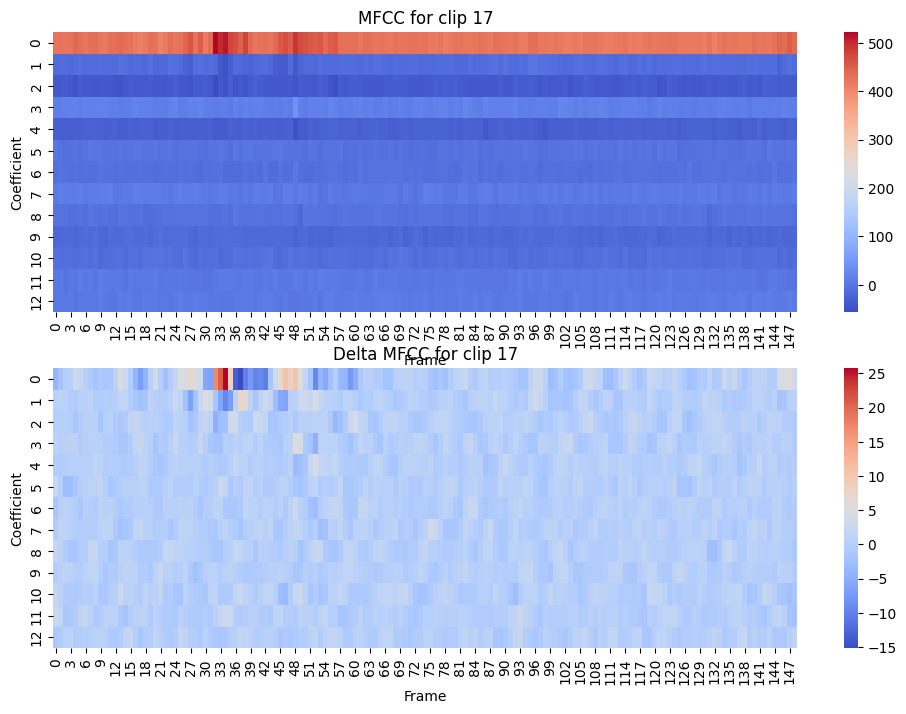

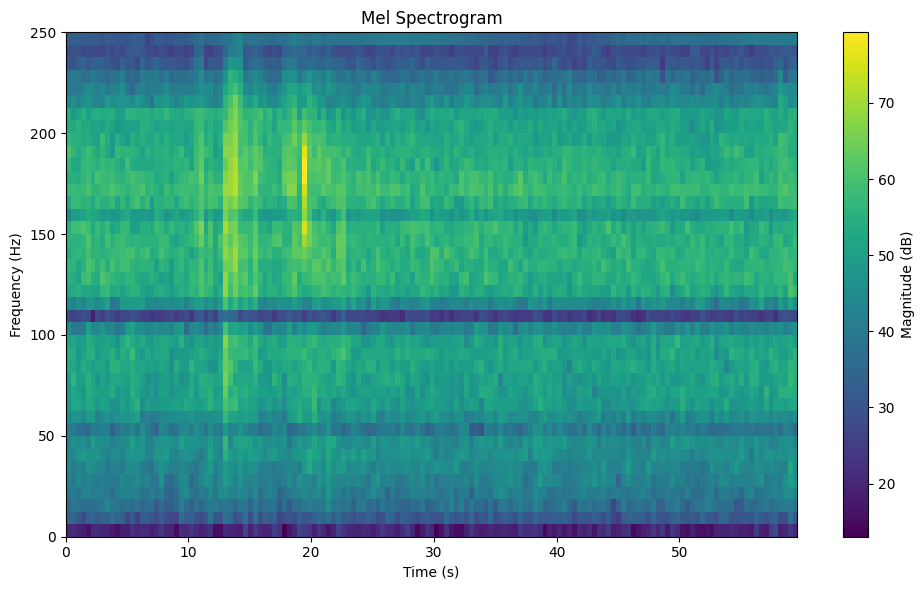

Number of samples: 30000
Number of frames: 149
MFCCs for clip 18: 25.314
Delta MFCCs for clip 18:-0.005


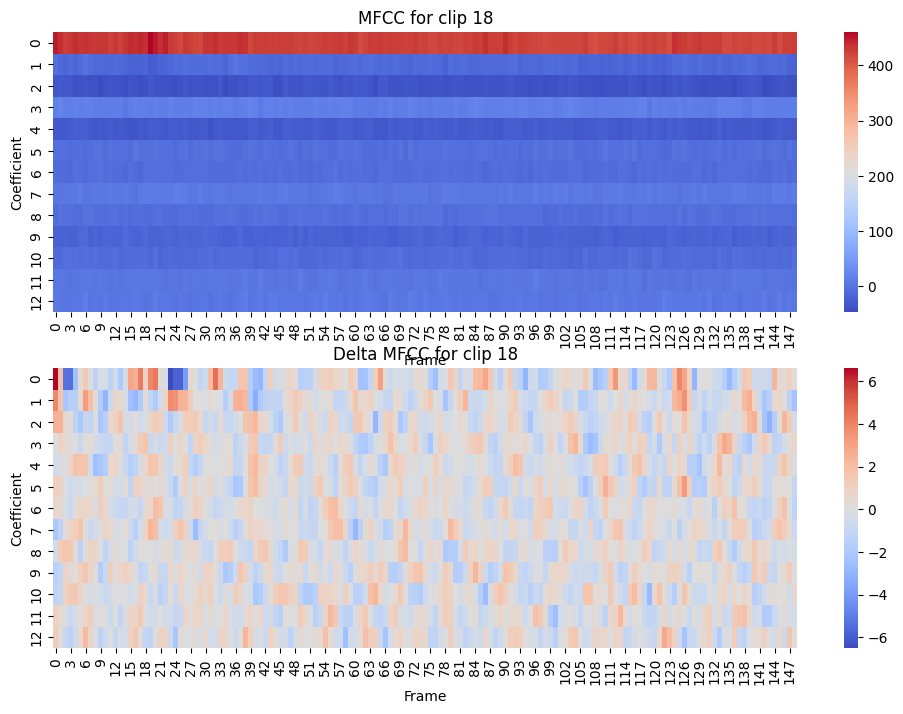

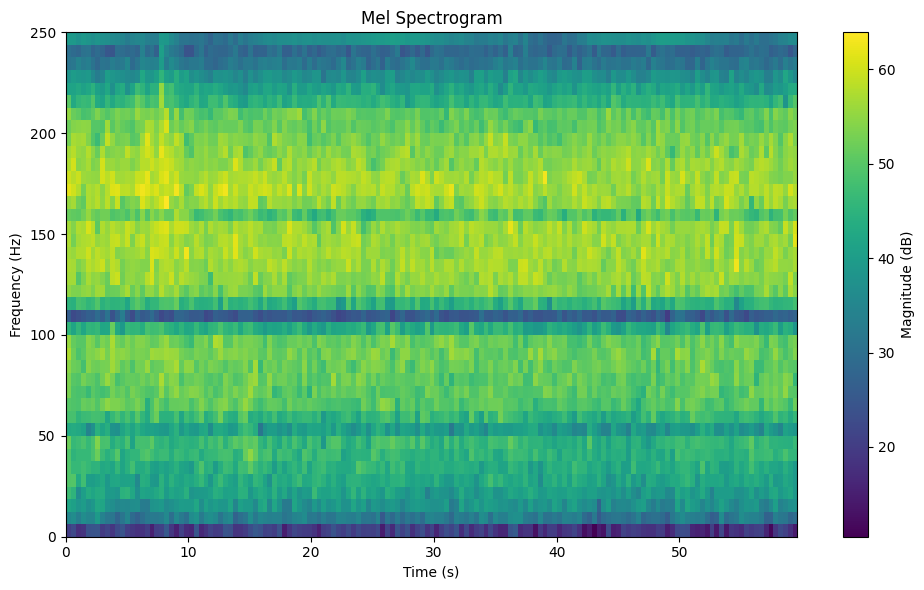

Number of samples: 30000
Number of frames: 149
MFCCs for clip 19: 25.714
Delta MFCCs for clip 19:-0.001


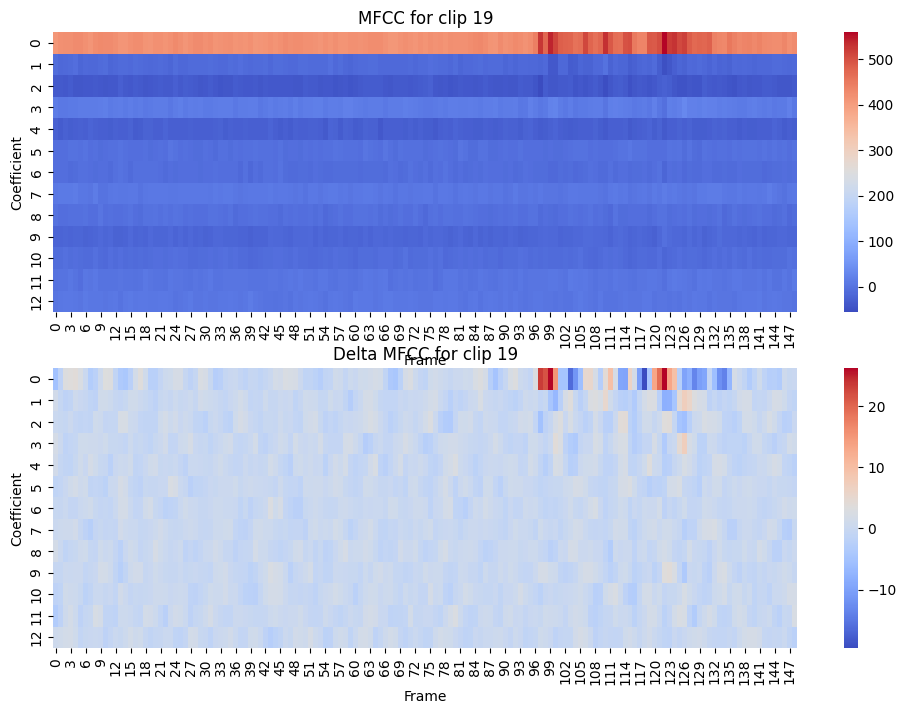

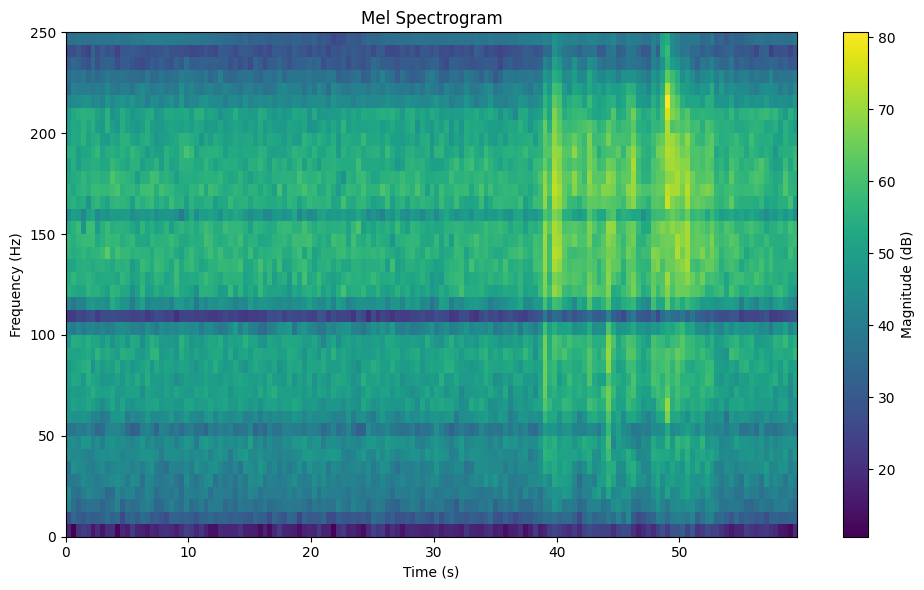

Number of samples: 30000
Number of frames: 149
MFCCs for clip 20: 25.789
Delta MFCCs for clip 20:0.003


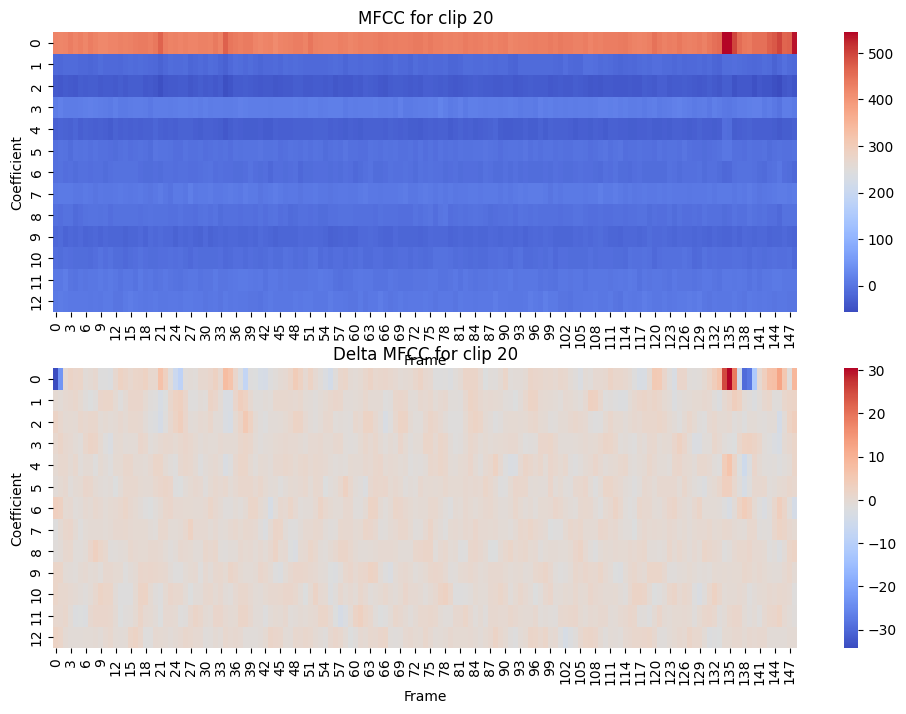

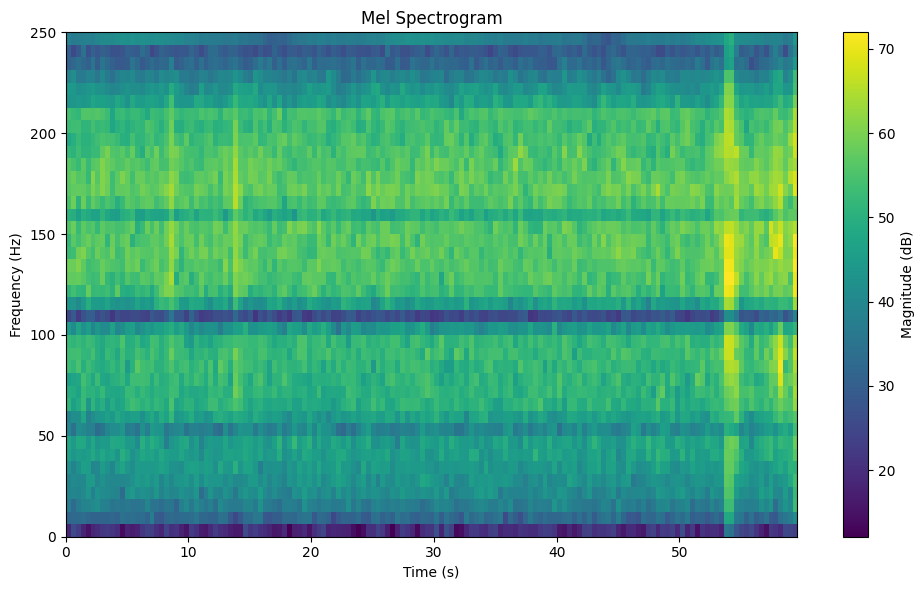

Number of samples: 30000
Number of frames: 149
MFCCs for clip 21: 26.468
Delta MFCCs for clip 21:0.000


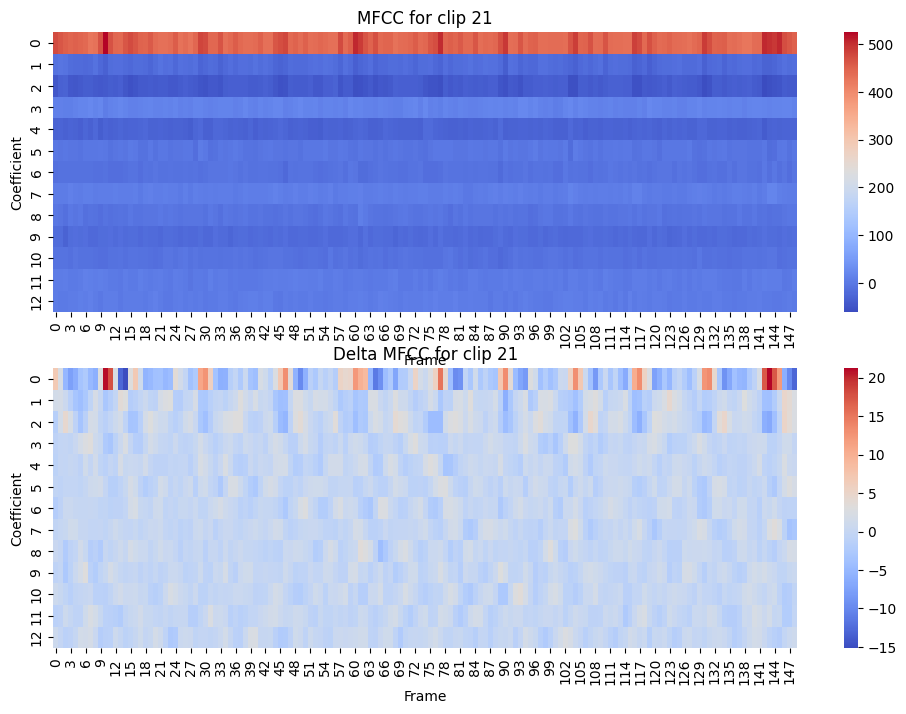

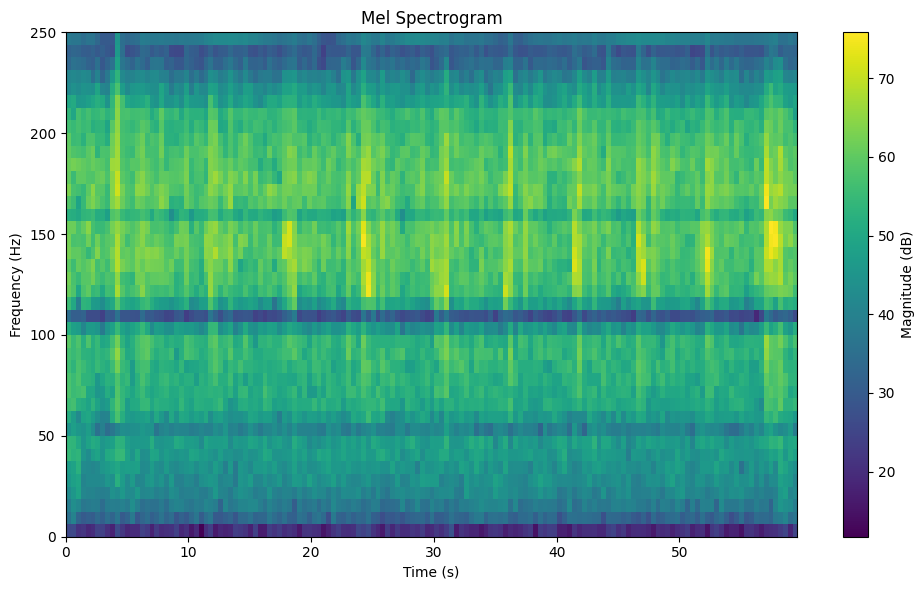

Number of samples: 30000
Number of frames: 149
MFCCs for clip 22: 26.517
Delta MFCCs for clip 22:-0.016


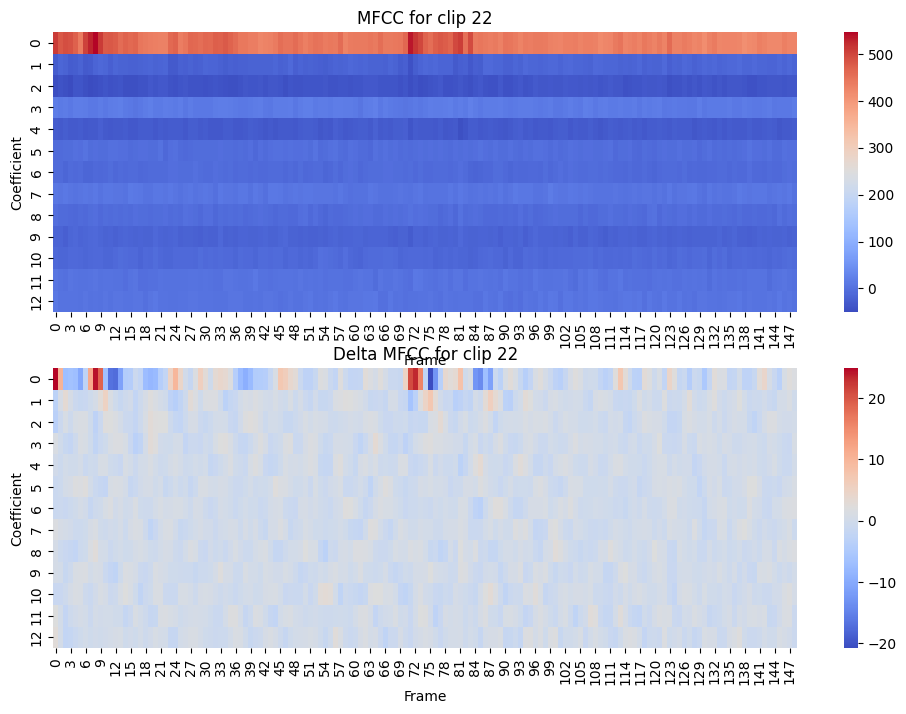

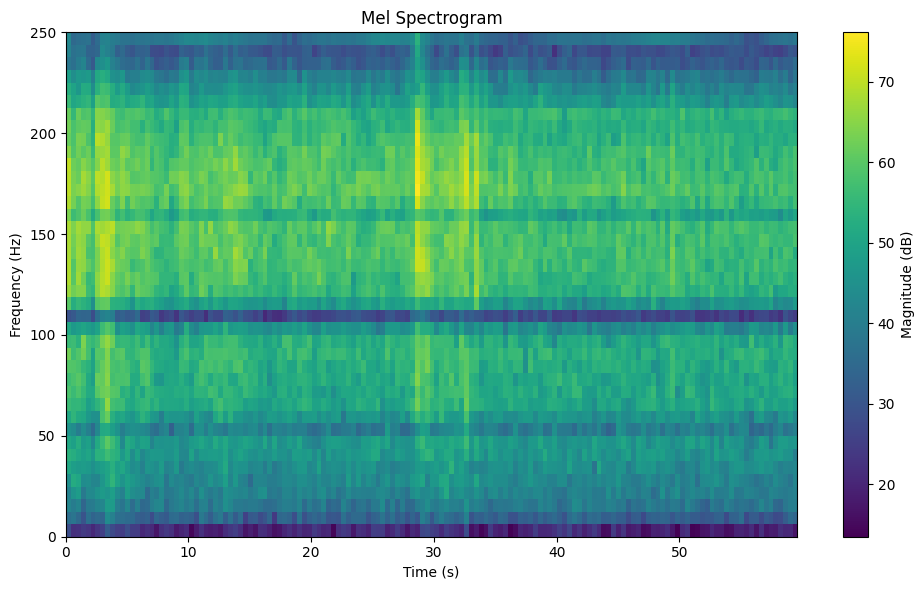

Number of samples: 30000
Number of frames: 149
MFCCs for clip 23: 26.194
Delta MFCCs for clip 23:-0.001


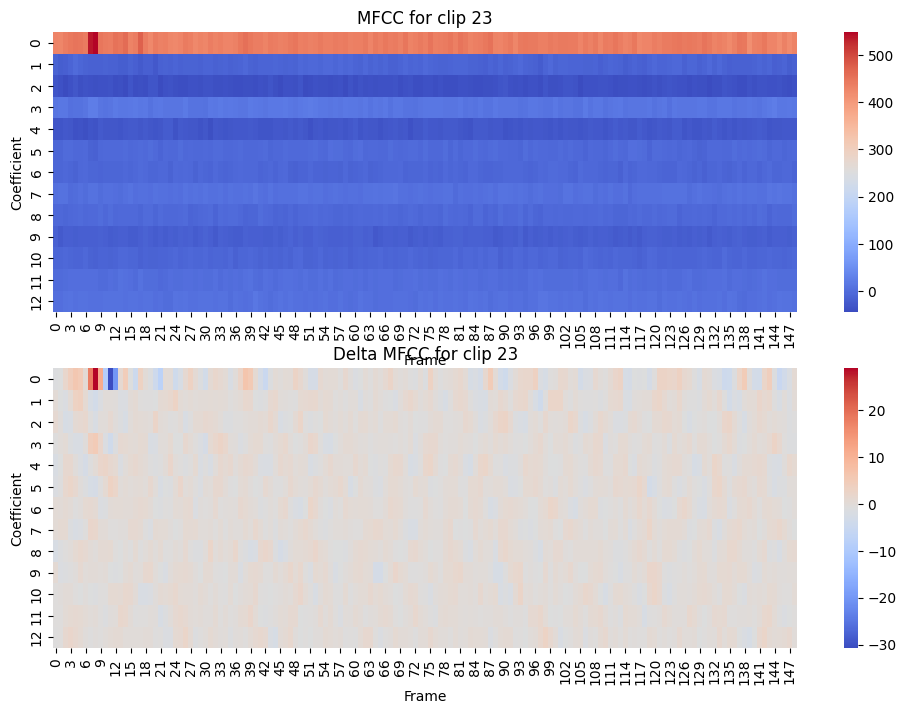

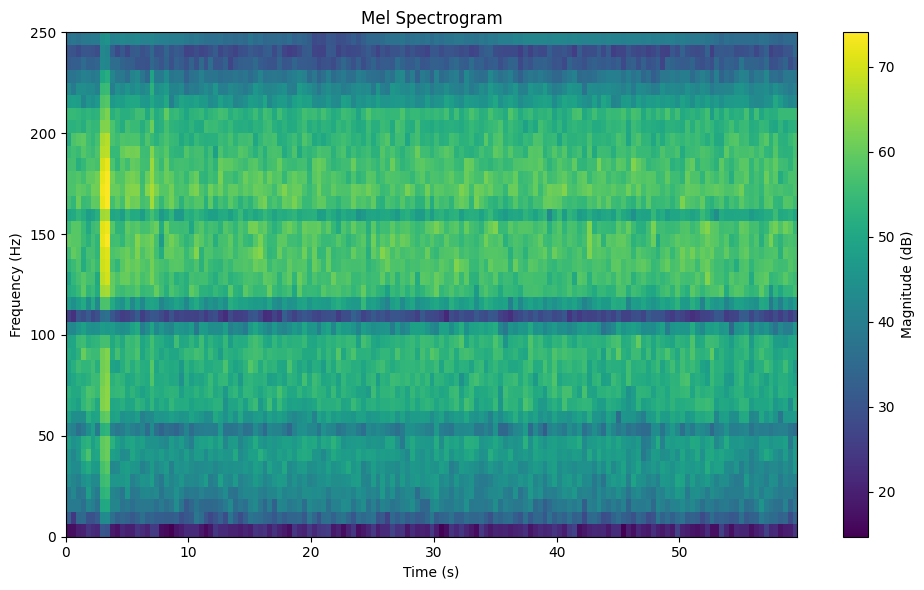

Number of samples: 30000
Number of frames: 149
MFCCs for clip 24: 26.527
Delta MFCCs for clip 24:0.005


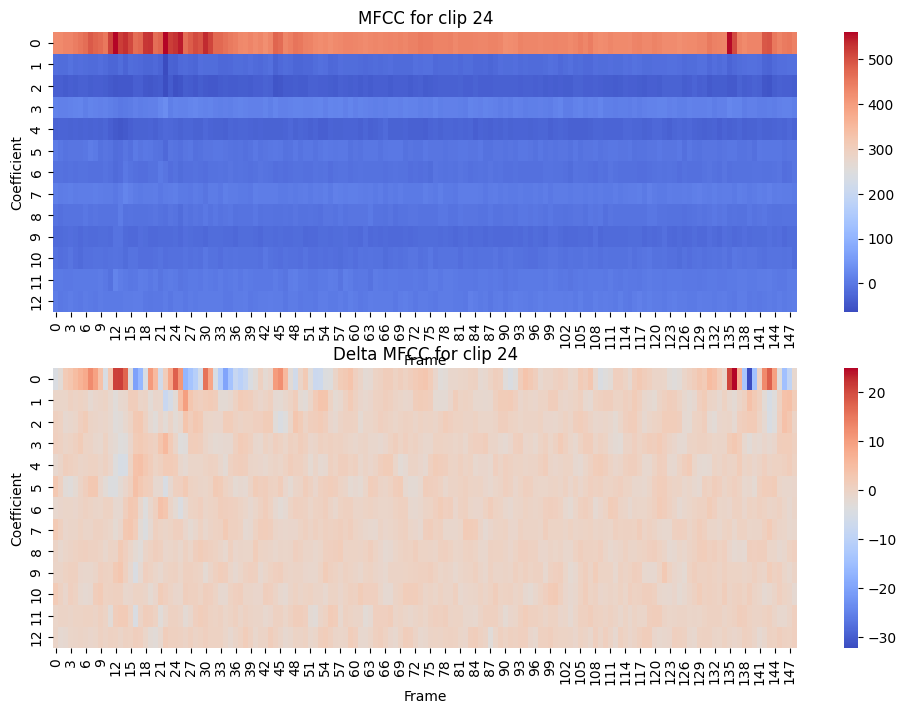

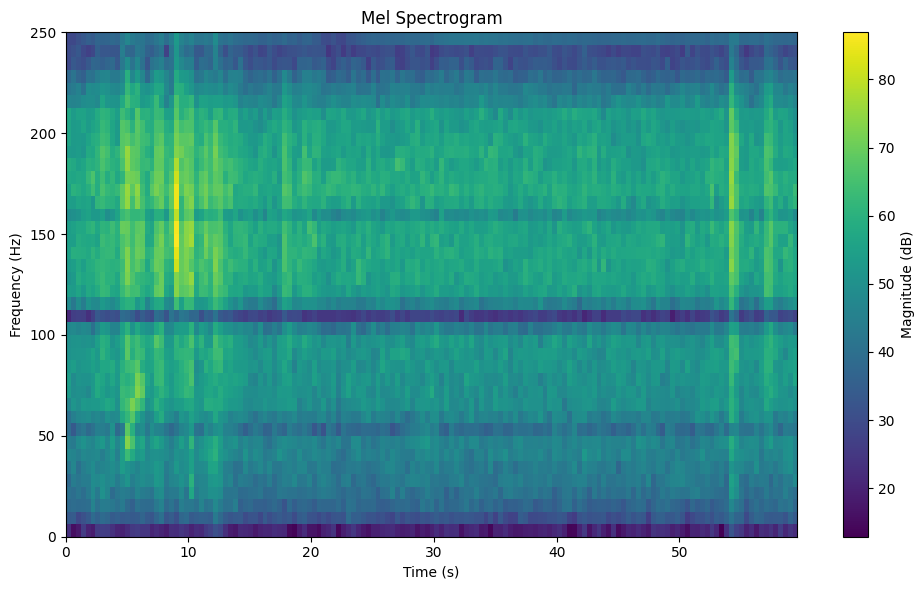

Number of samples: 30000
Number of frames: 149
MFCCs for clip 25: 26.309
Delta MFCCs for clip 25:0.008


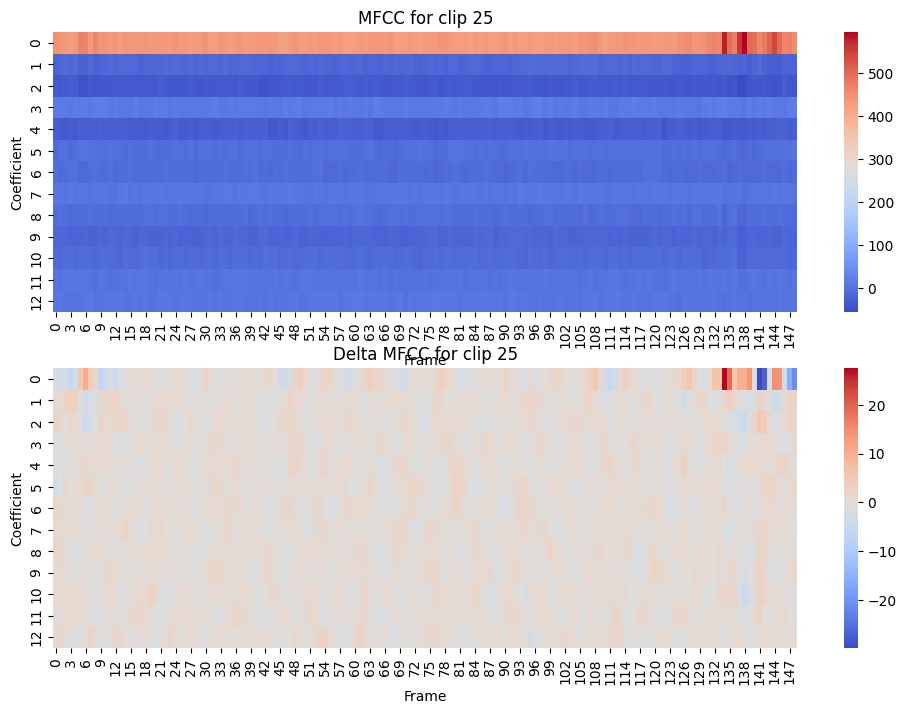

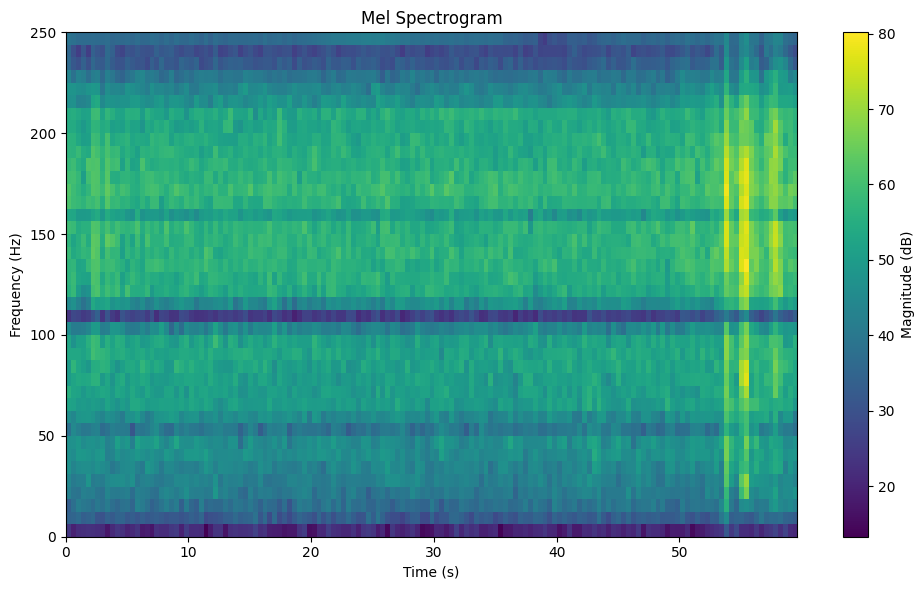

Number of samples: 30000
Number of frames: 149
MFCCs for clip 26: 26.892
Delta MFCCs for clip 26:0.011


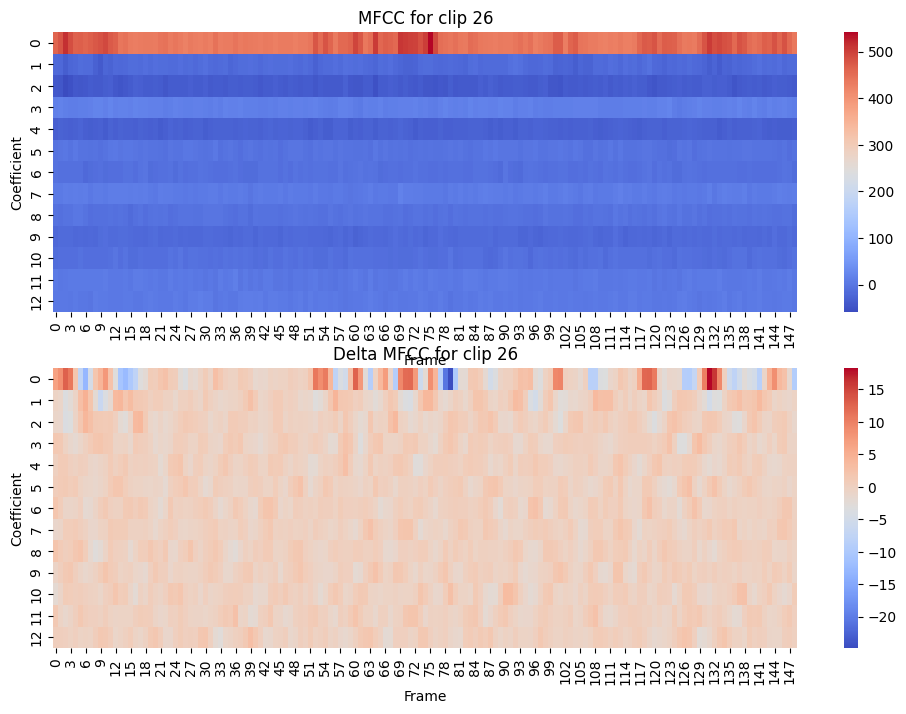

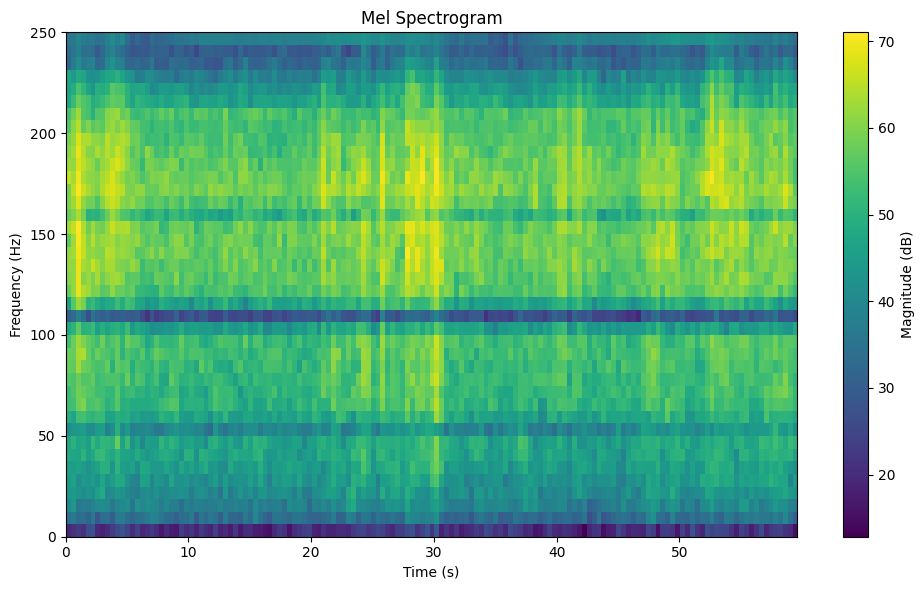

Number of samples: 30000
Number of frames: 149
MFCCs for clip 27: 26.212
Delta MFCCs for clip 27:-0.003


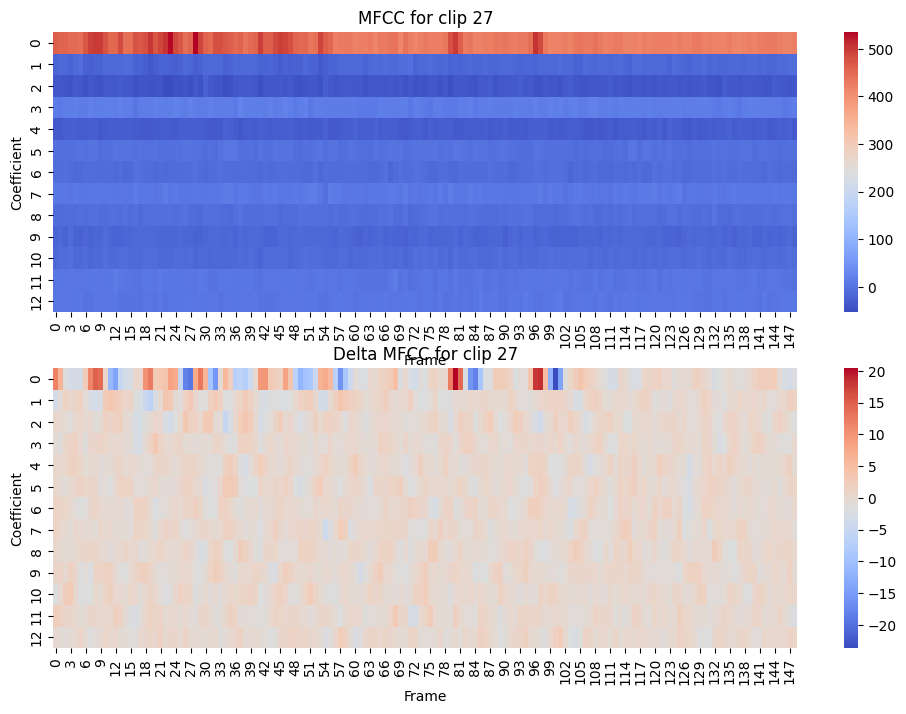

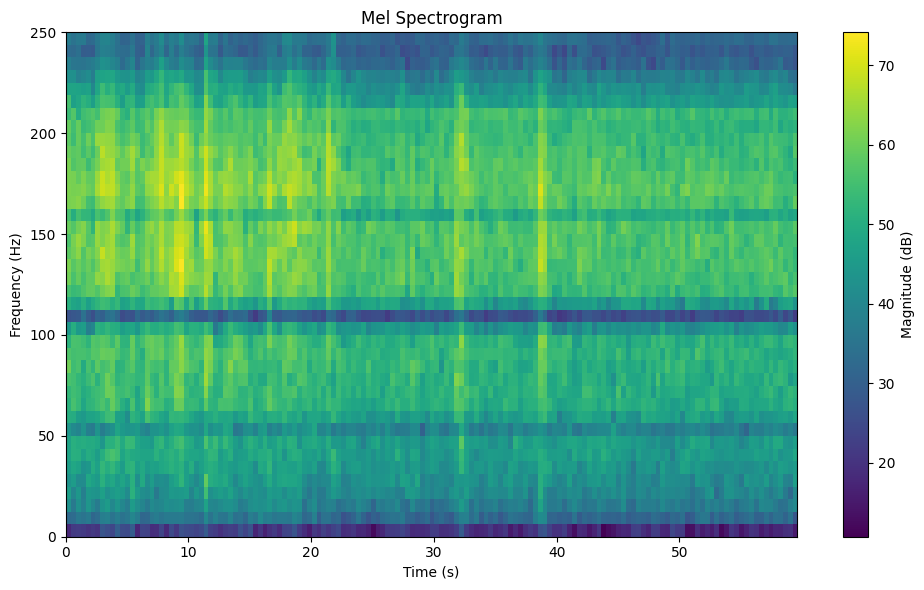

Number of samples: 30000
Number of frames: 149
MFCCs for clip 28: 25.549
Delta MFCCs for clip 28:0.005


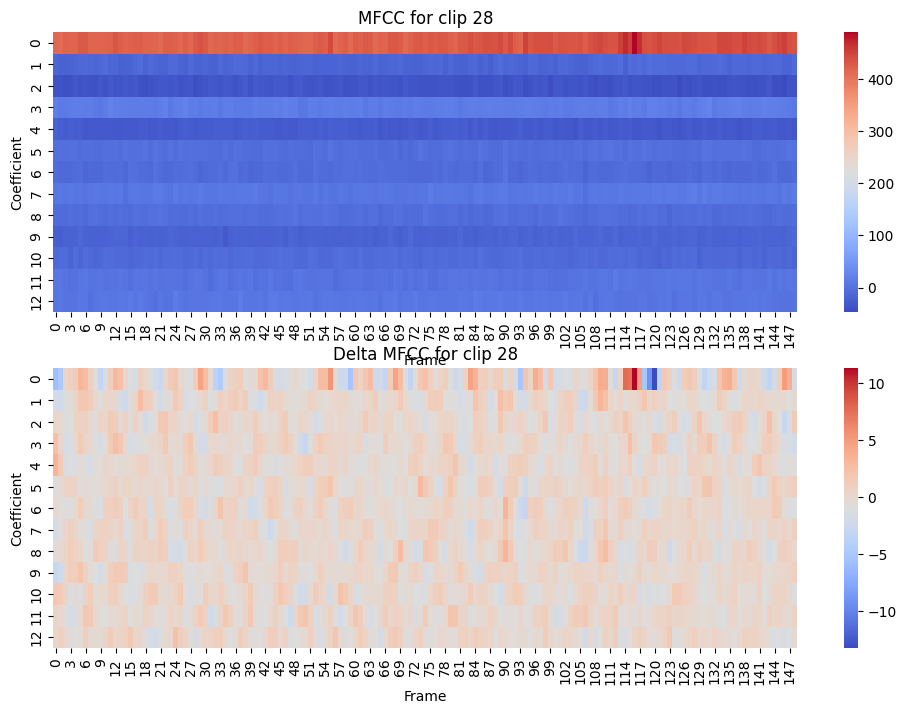

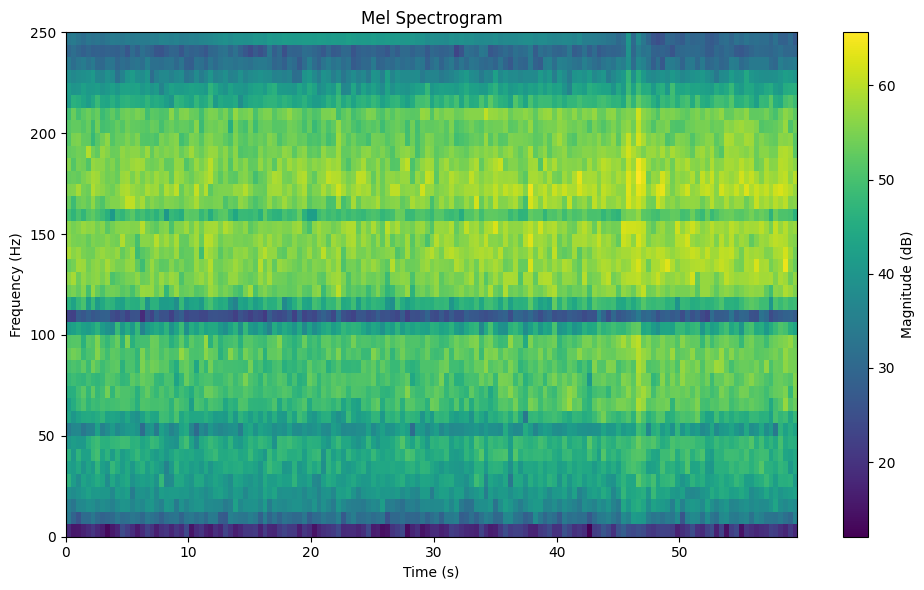

Number of samples: 30000
Number of frames: 149
MFCCs for clip 29: 26.337
Delta MFCCs for clip 29:0.011


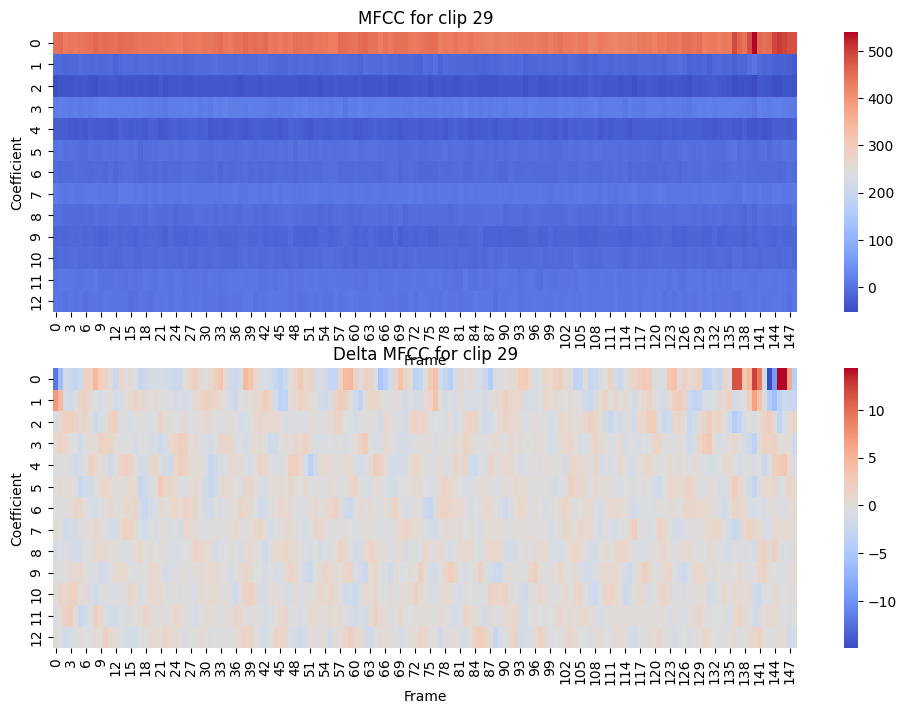

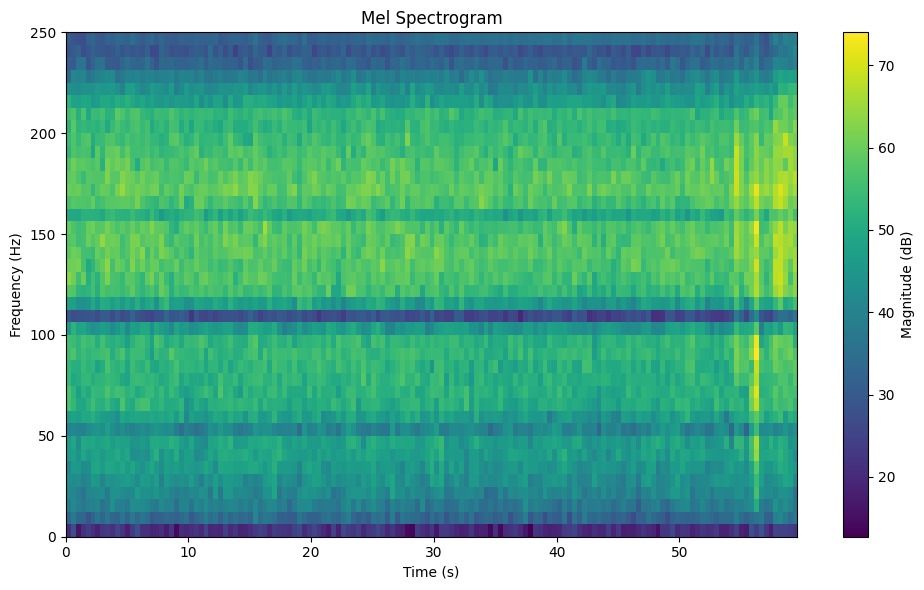

Number of samples: 30000
Number of frames: 149
MFCCs for clip 30: 24.947
Delta MFCCs for clip 30:-0.010


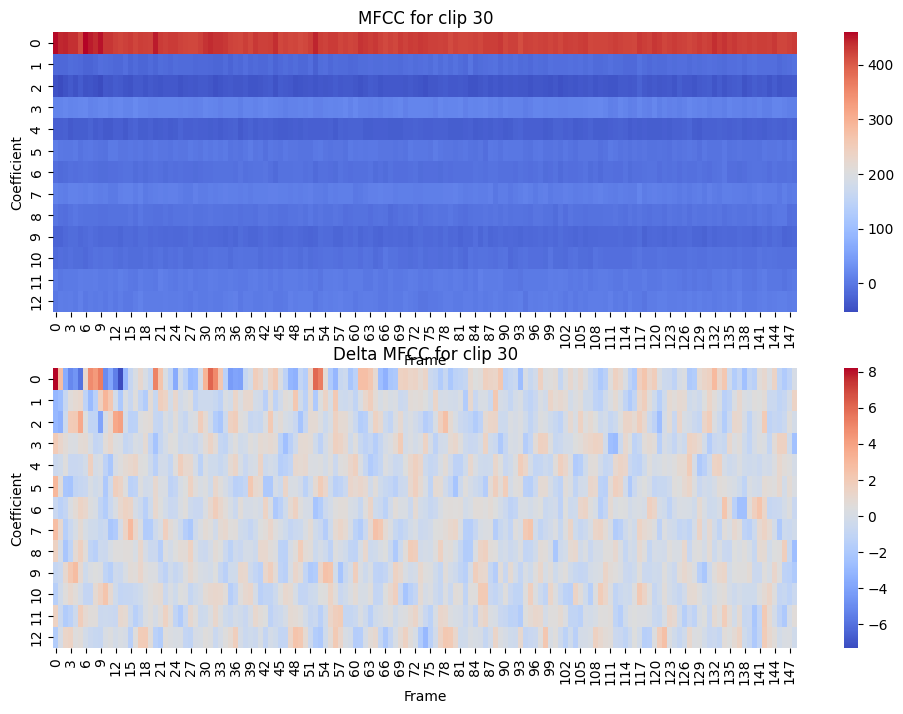

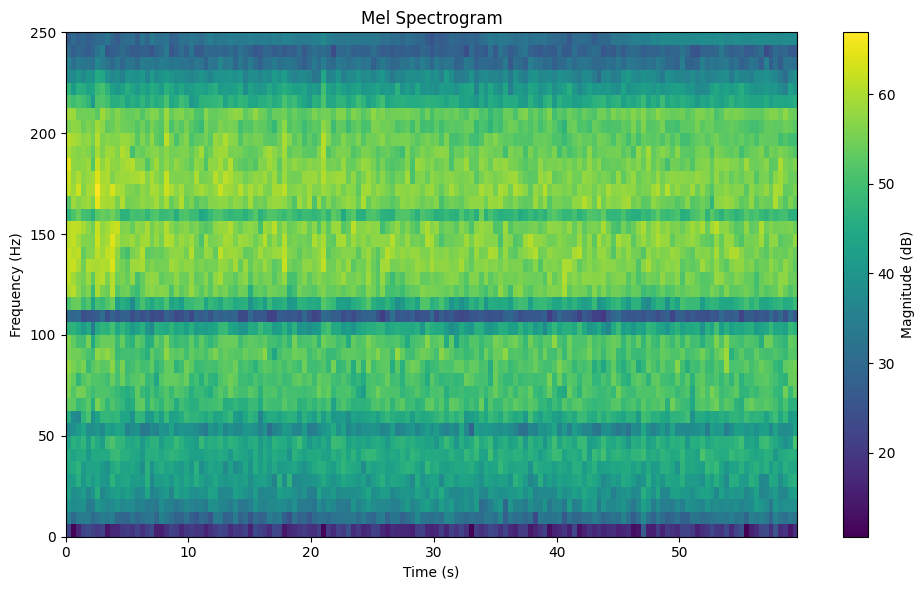

Number of samples: 30000
Number of frames: 149
MFCCs for clip 31: 25.653
Delta MFCCs for clip 31:0.003


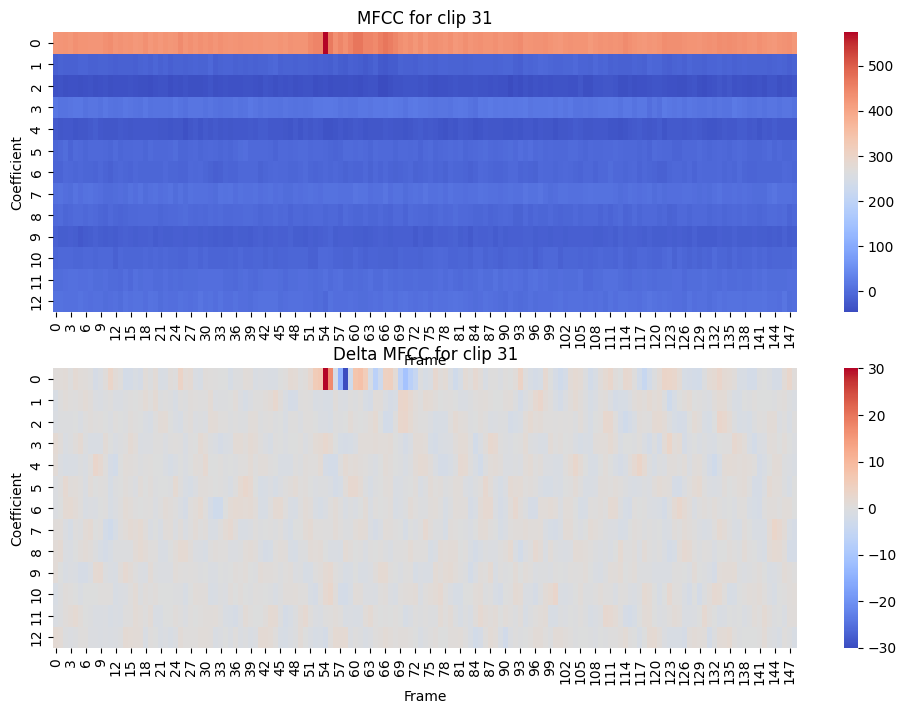

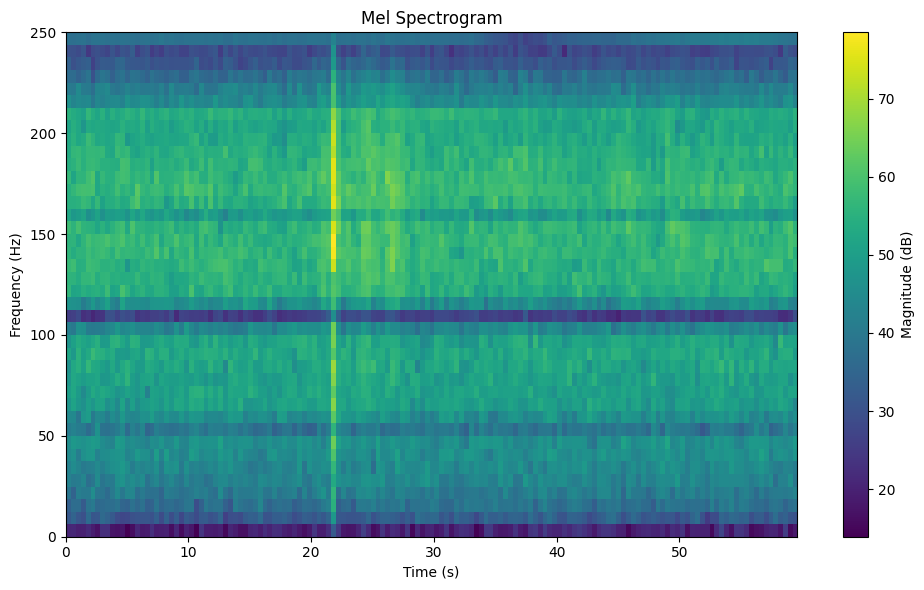

Number of samples: 30000
Number of frames: 149
MFCCs for clip 32: 25.431
Delta MFCCs for clip 32:0.006


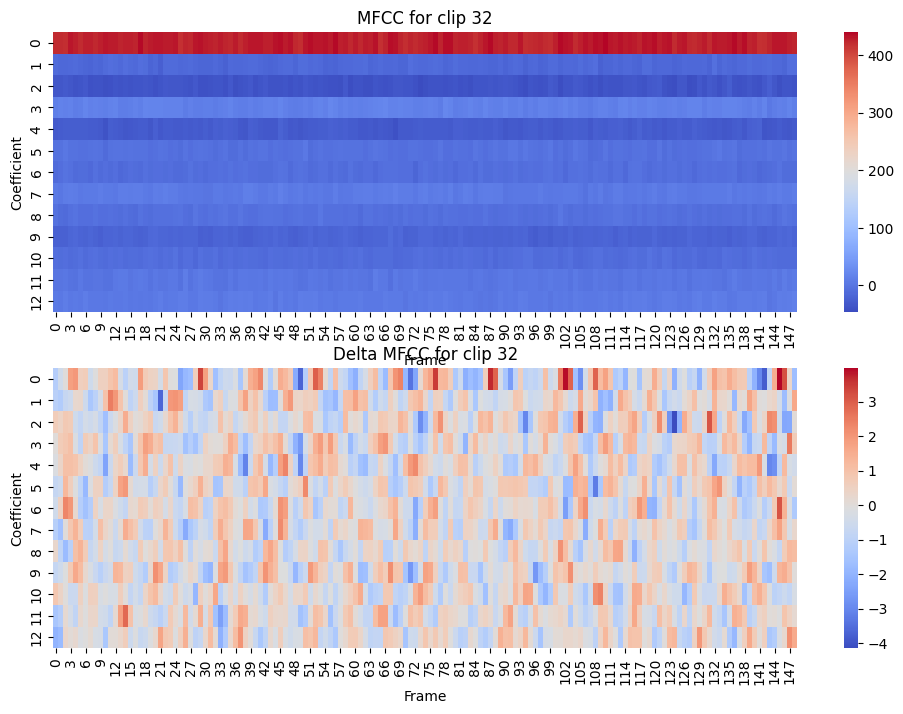

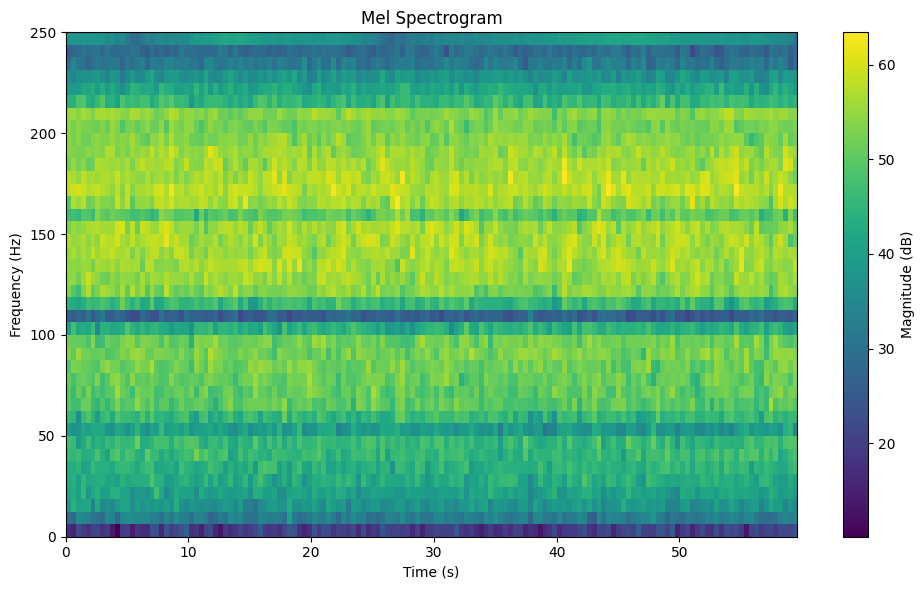

Number of samples: 30000
Number of frames: 149
MFCCs for clip 33: 25.333
Delta MFCCs for clip 33:-0.006


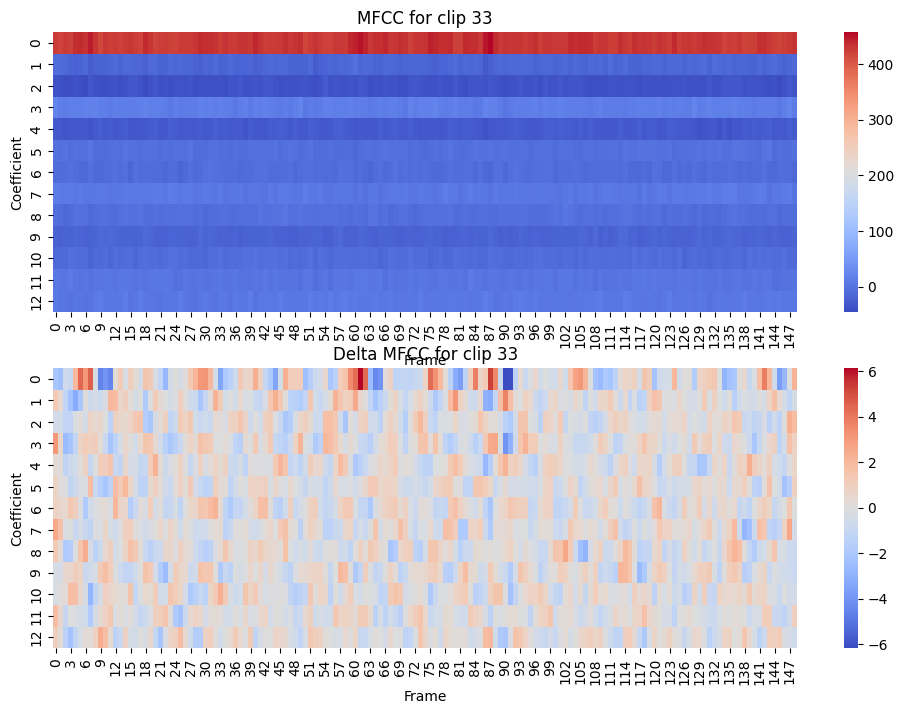

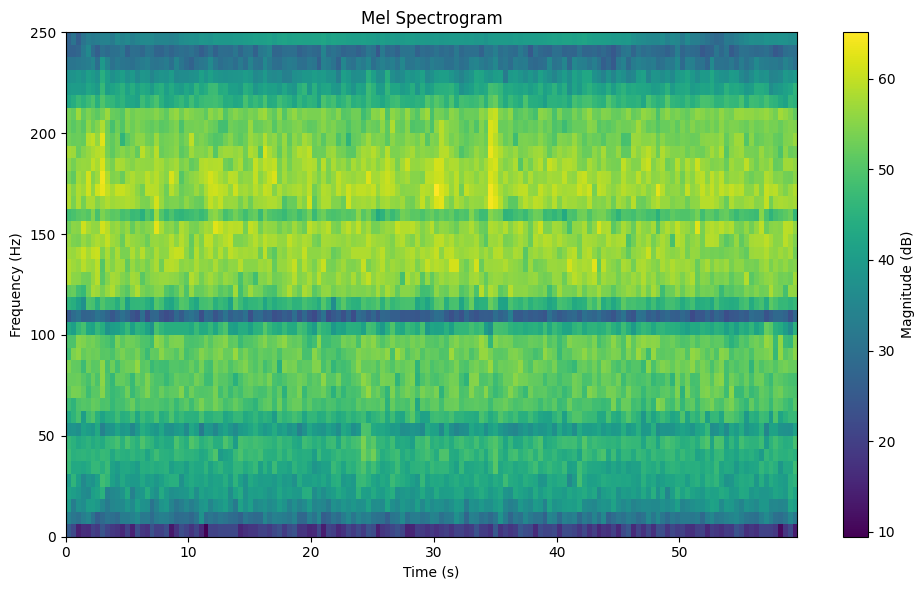

Number of samples: 30000
Number of frames: 149
MFCCs for clip 34: 26.231
Delta MFCCs for clip 34:-0.002


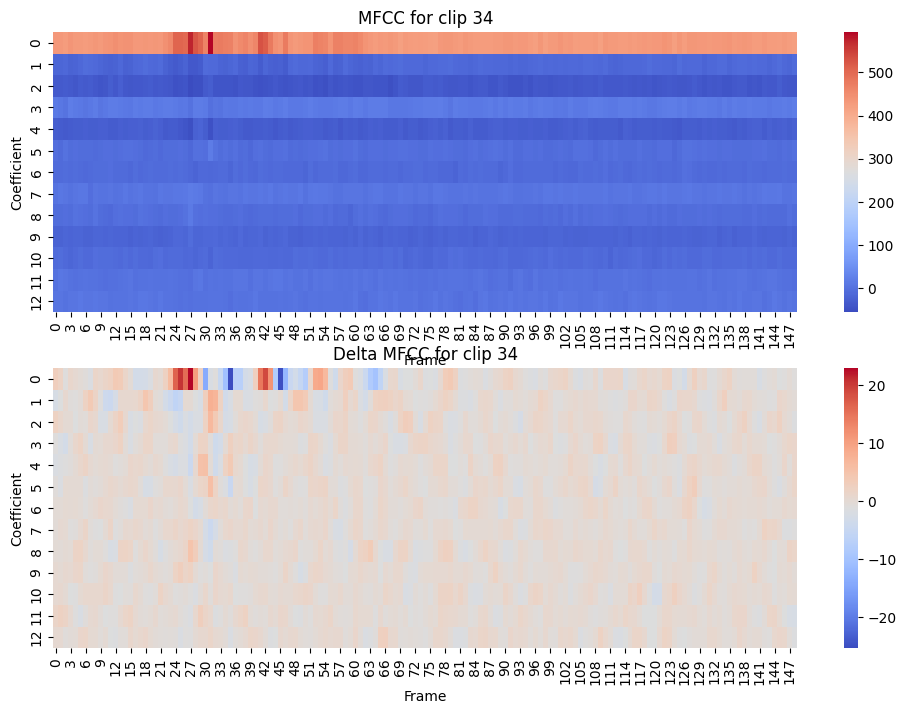

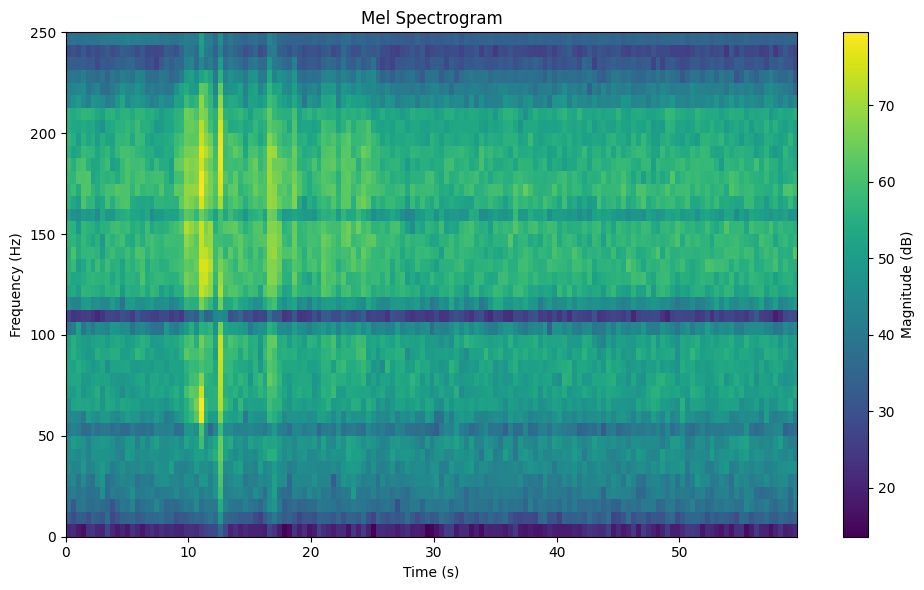

Number of samples: 30000
Number of frames: 149
MFCCs for clip 35: 25.500
Delta MFCCs for clip 35:-0.004


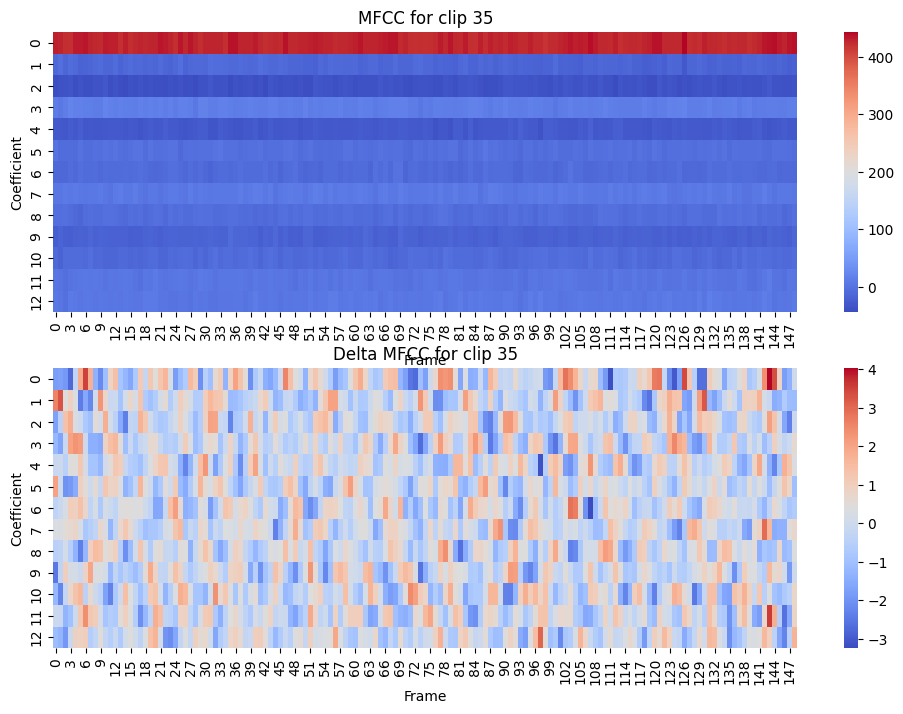

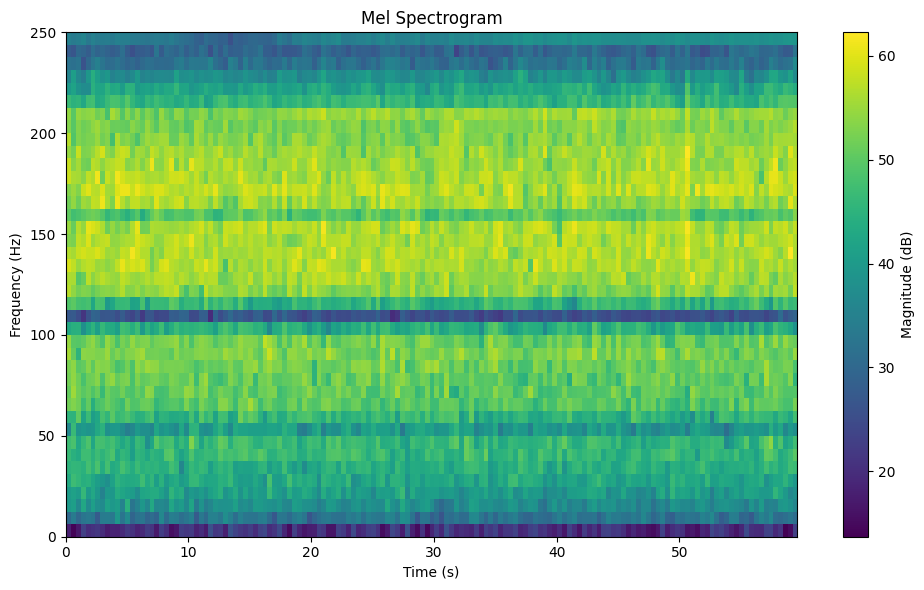

Number of samples: 30000
Number of frames: 149
MFCCs for clip 36: 25.533
Delta MFCCs for clip 36:0.002


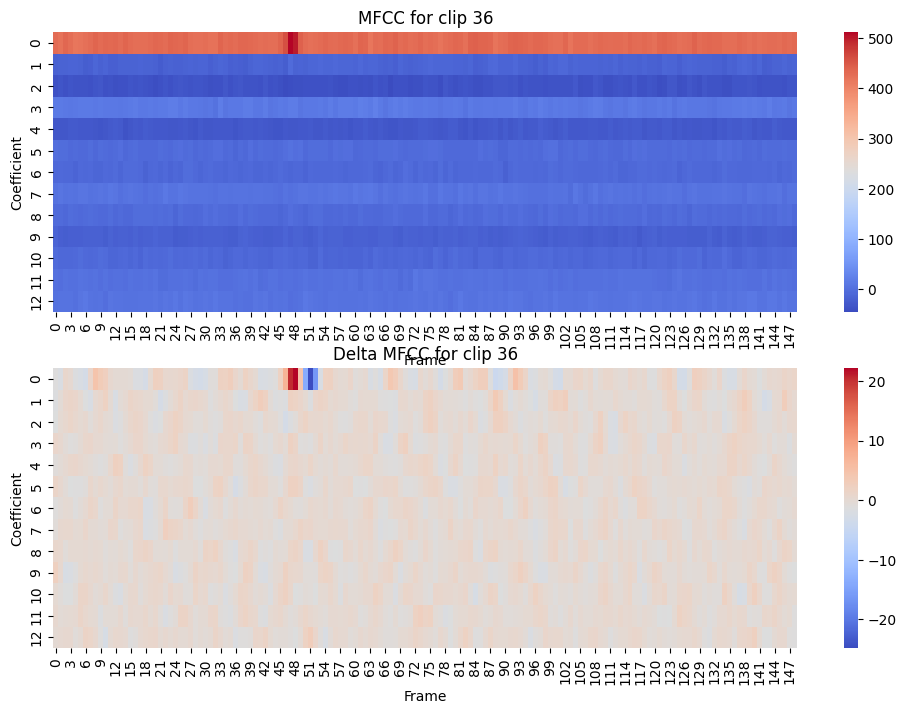

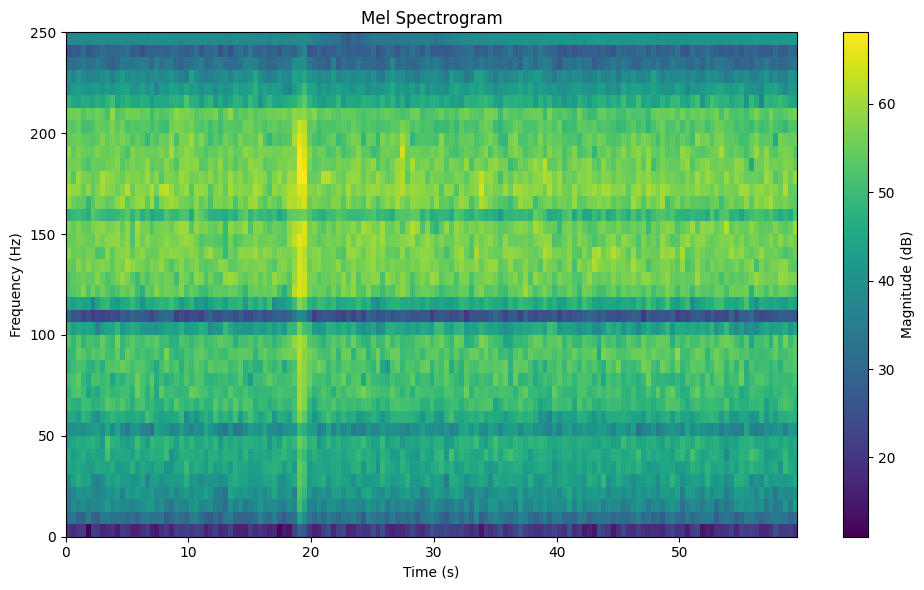

Number of samples: 30000
Number of frames: 149
MFCCs for clip 37: 25.987
Delta MFCCs for clip 37:0.001


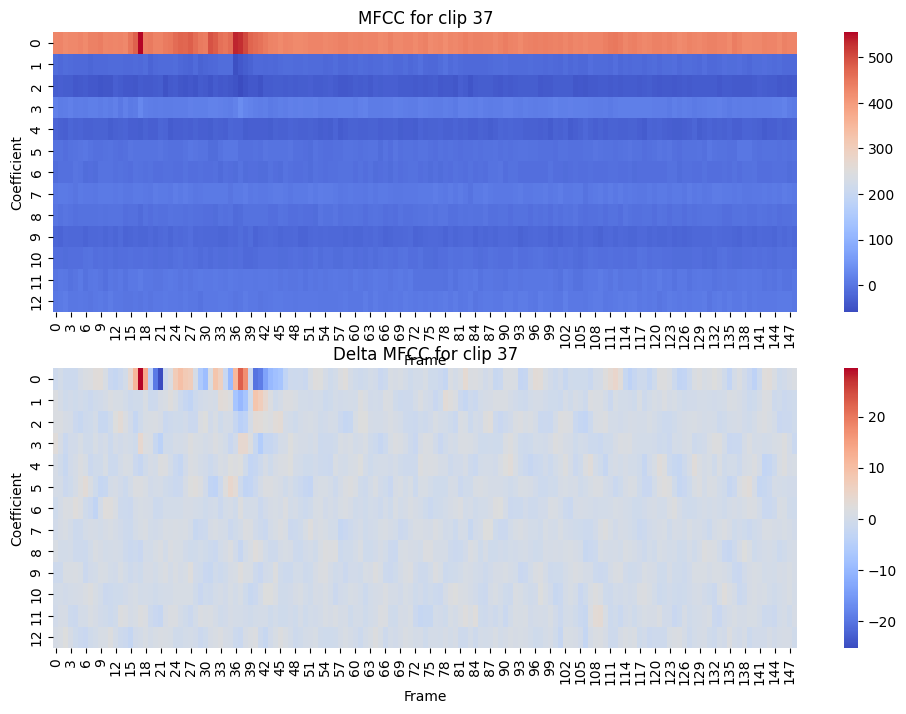

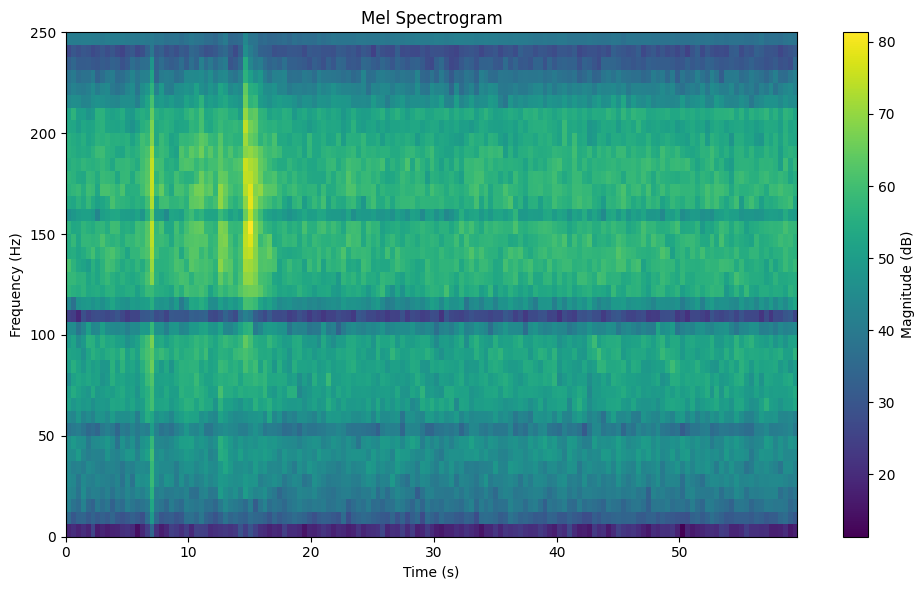

Number of samples: 30000
Number of frames: 149
MFCCs for clip 38: 28.295
Delta MFCCs for clip 38:0.007


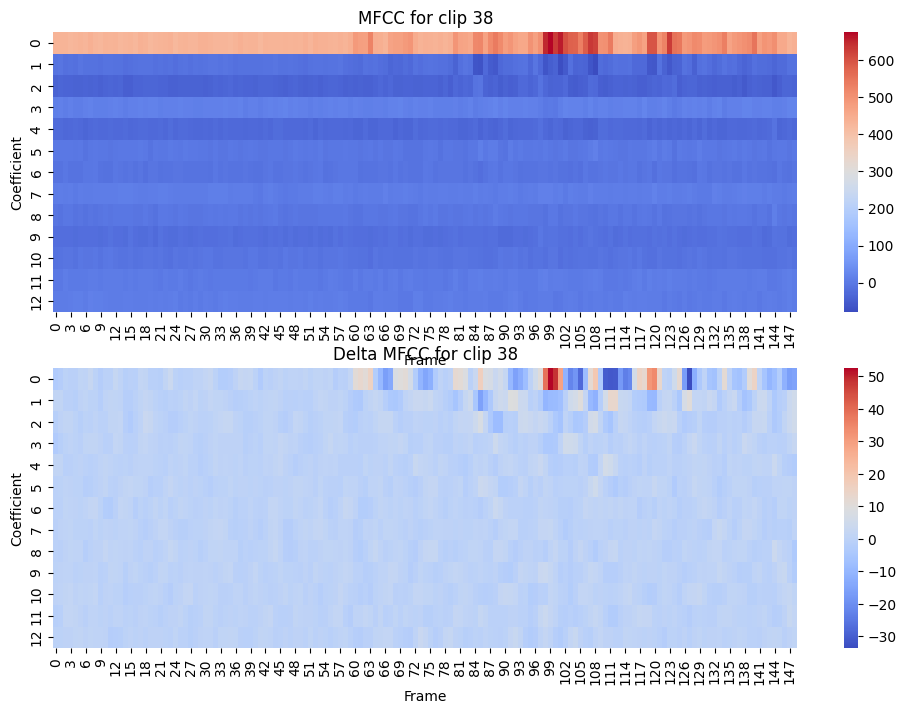

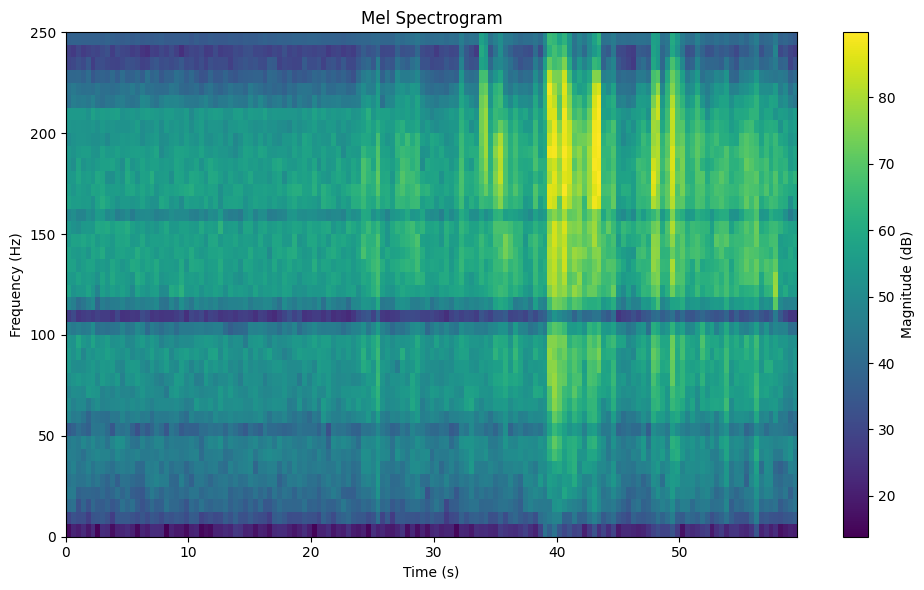

Number of samples: 30000
Number of frames: 149
MFCCs for clip 39: 26.774
Delta MFCCs for clip 39:-0.000


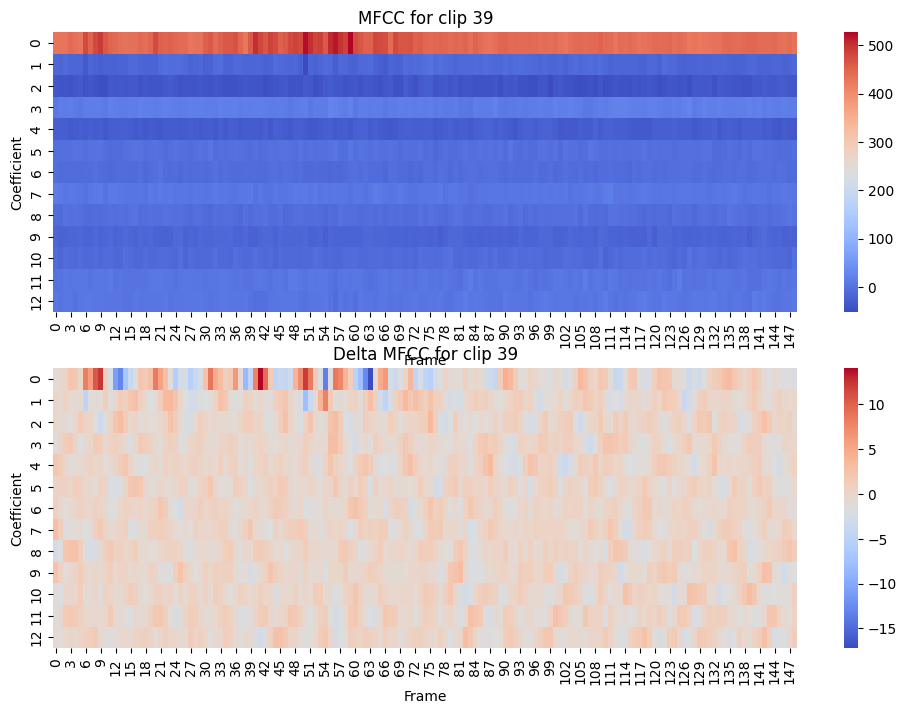

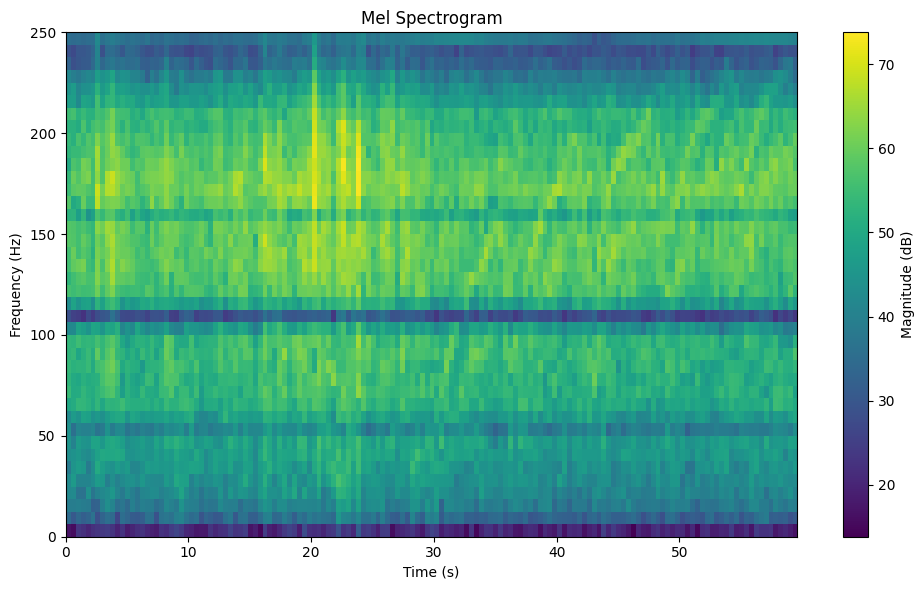

Number of samples: 30000
Number of frames: 149
MFCCs for clip 40: 25.487
Delta MFCCs for clip 40:-0.006


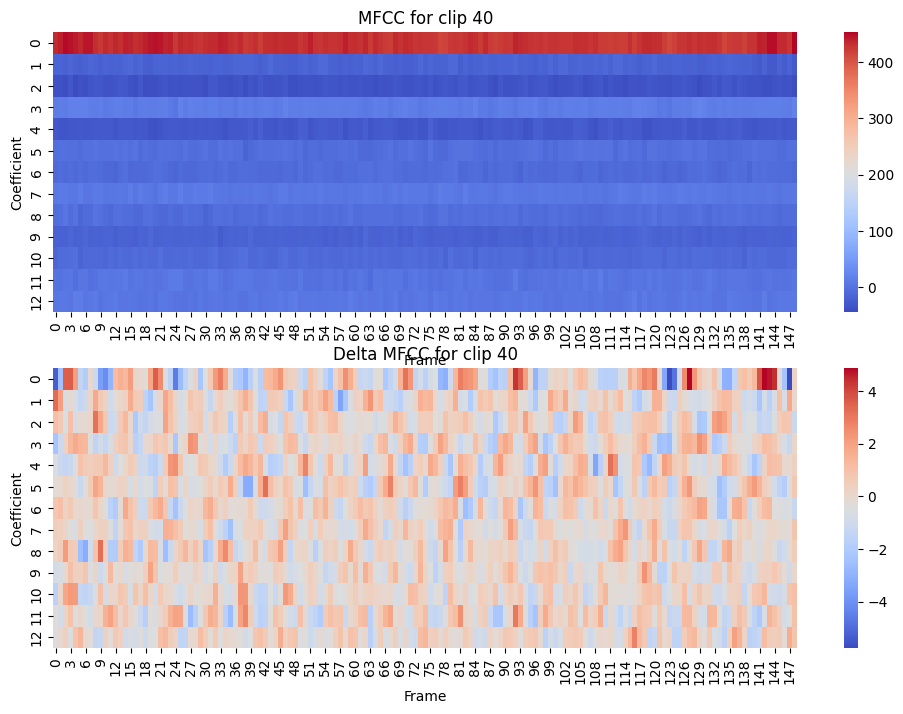

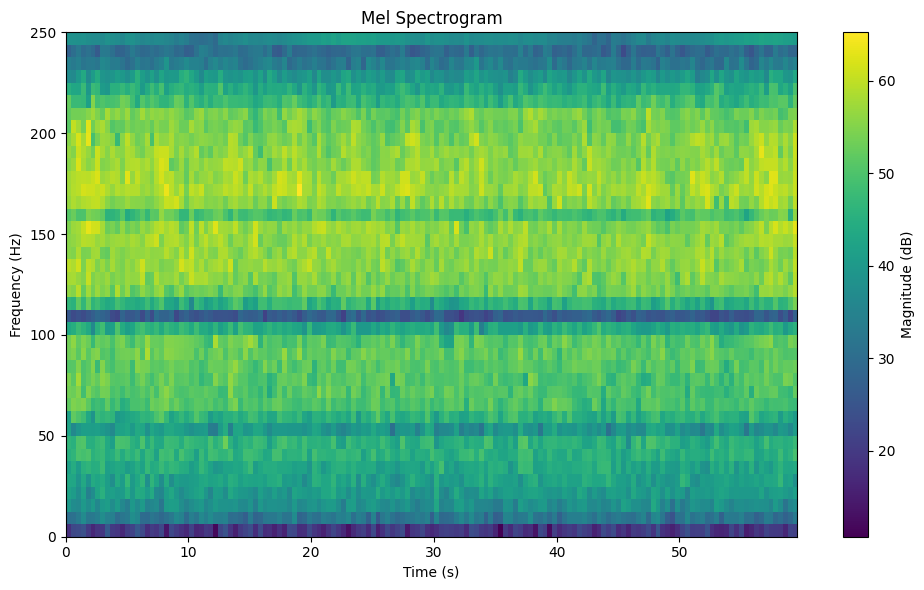

Number of samples: 30000
Number of frames: 149
MFCCs for clip 41: 26.412
Delta MFCCs for clip 41:0.014


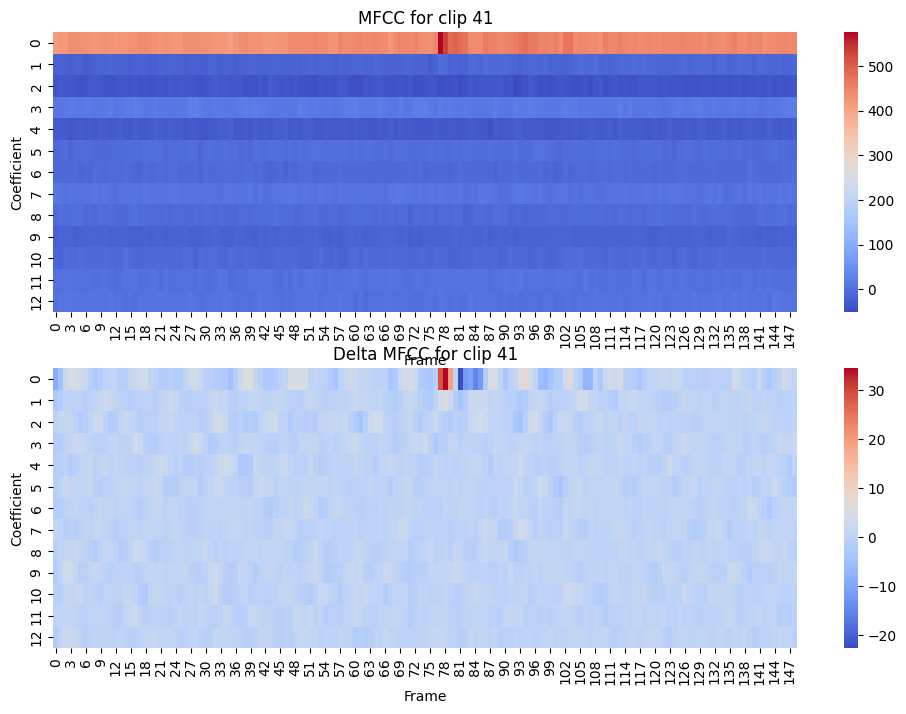

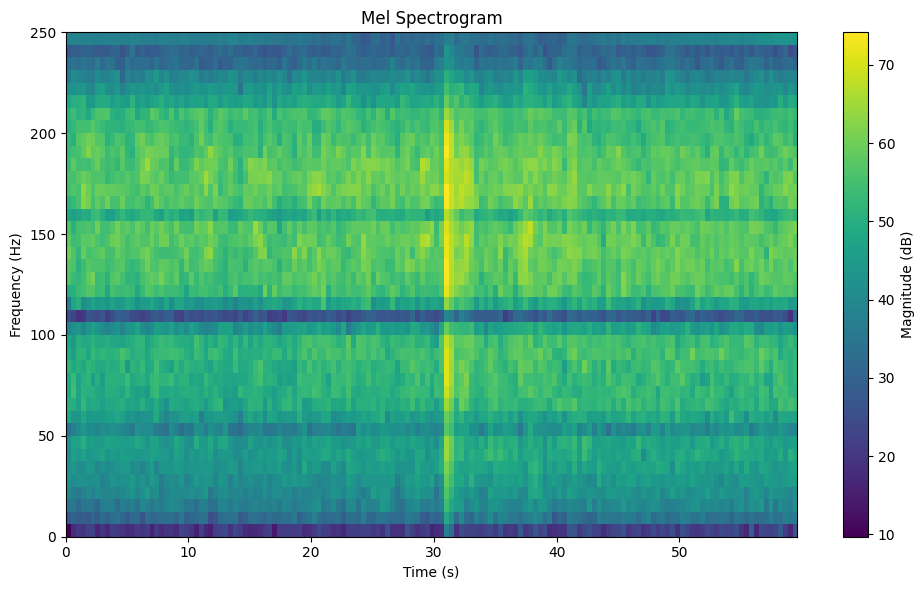

Number of samples: 30000
Number of frames: 149
MFCCs for clip 42: 25.177
Delta MFCCs for clip 42:-0.000


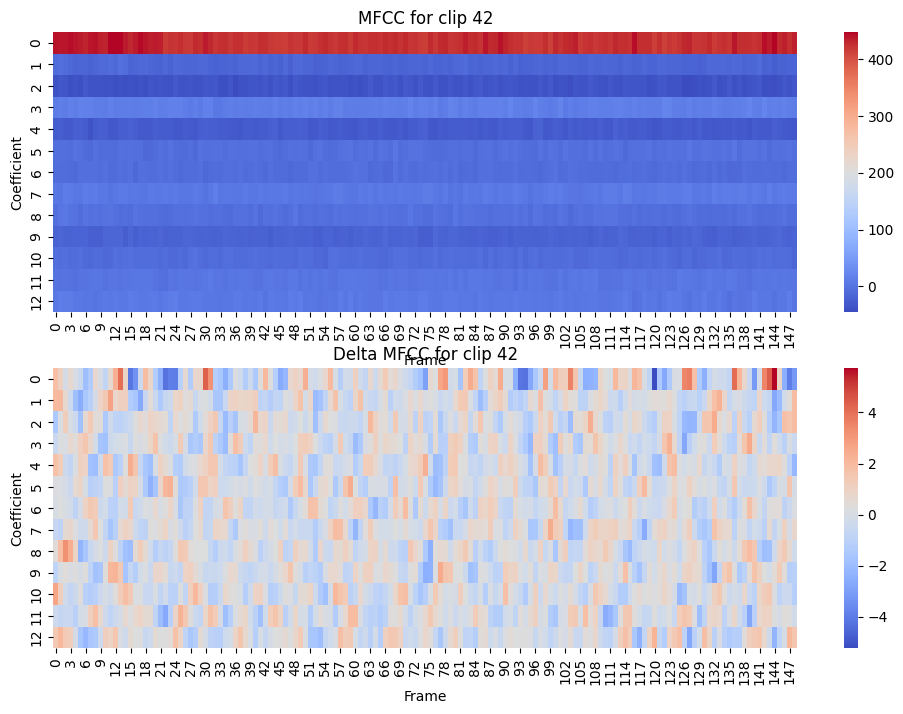

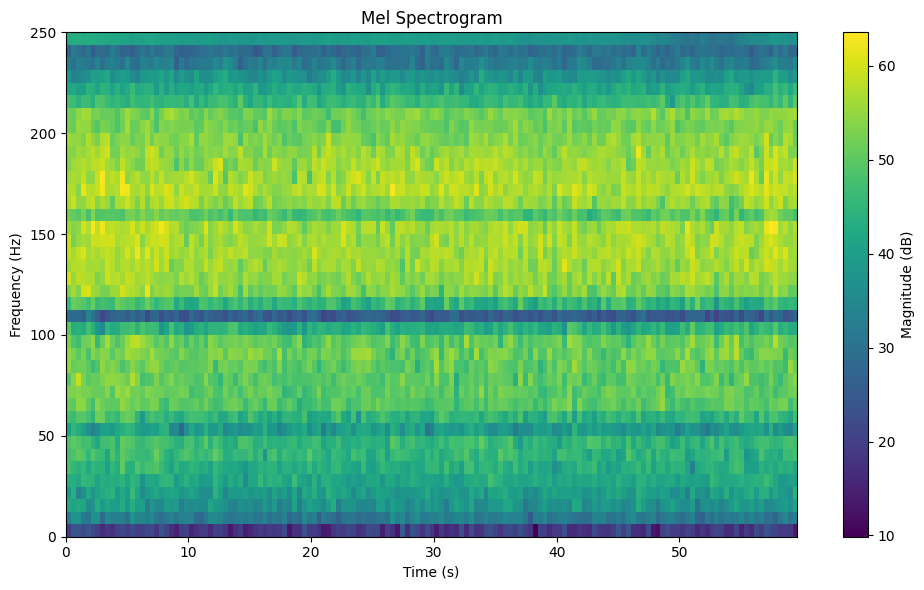

Number of samples: 30000
Number of frames: 149
MFCCs for clip 43: 25.418
Delta MFCCs for clip 43:0.006


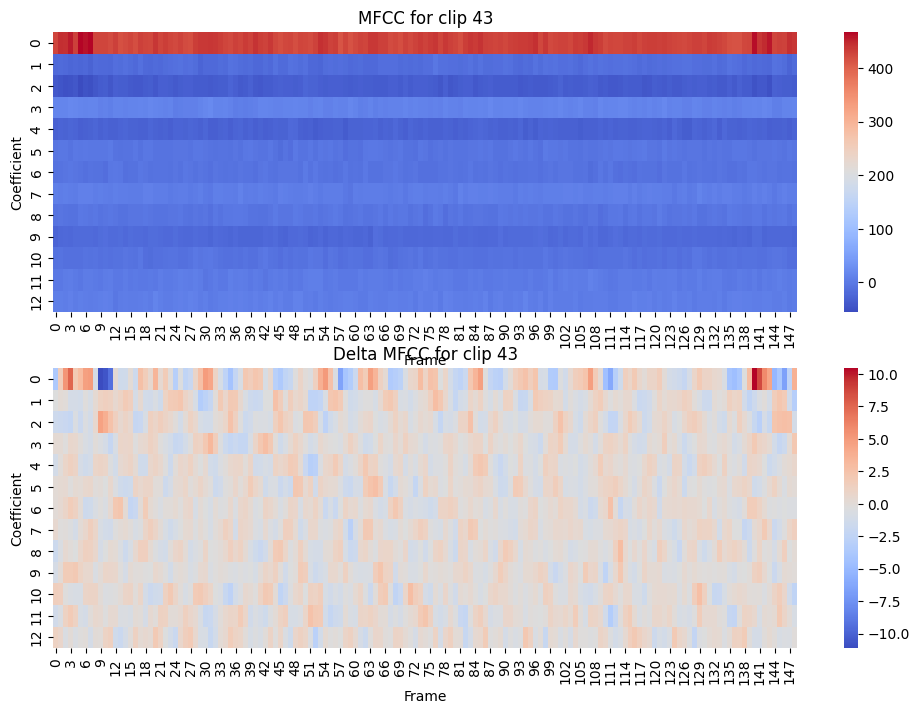

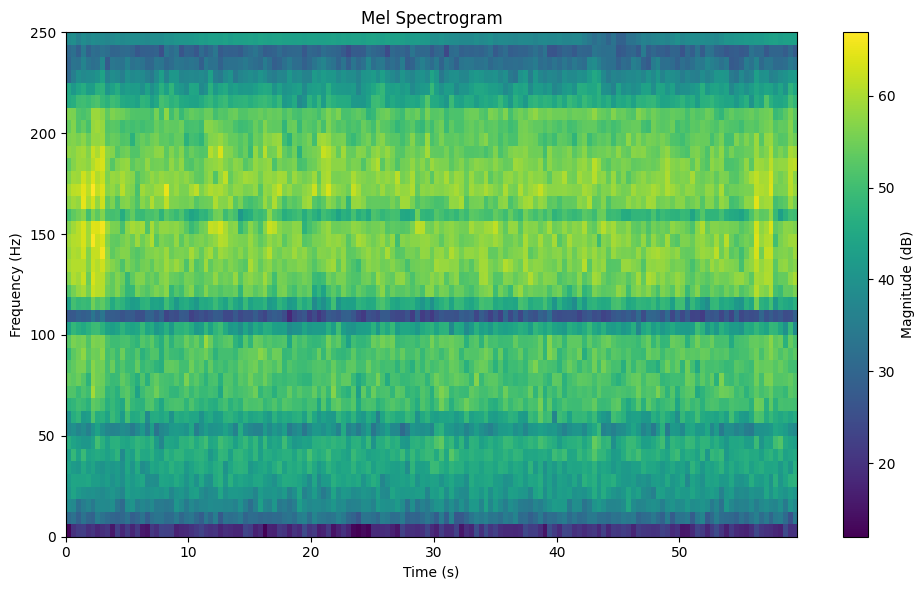

Number of samples: 30000
Number of frames: 149
MFCCs for clip 44: 25.587
Delta MFCCs for clip 44:0.004


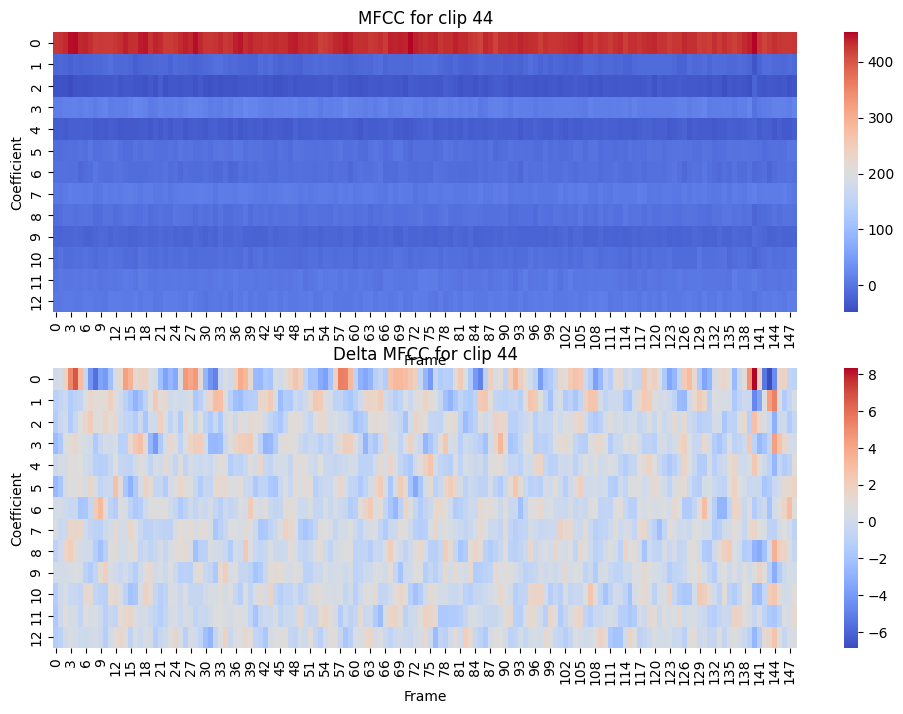

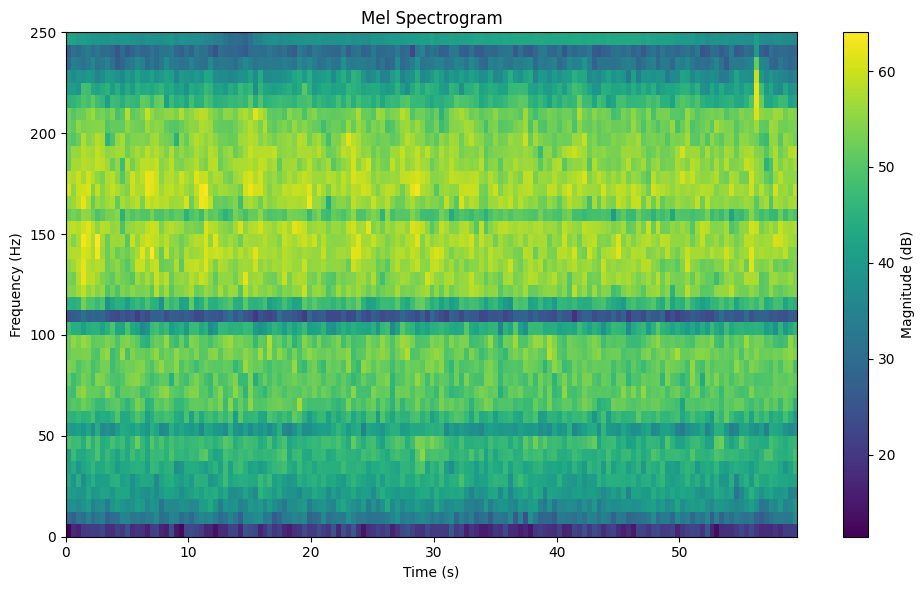

Number of samples: 30000
Number of frames: 149
MFCCs for clip 45: 26.248
Delta MFCCs for clip 45:-0.002


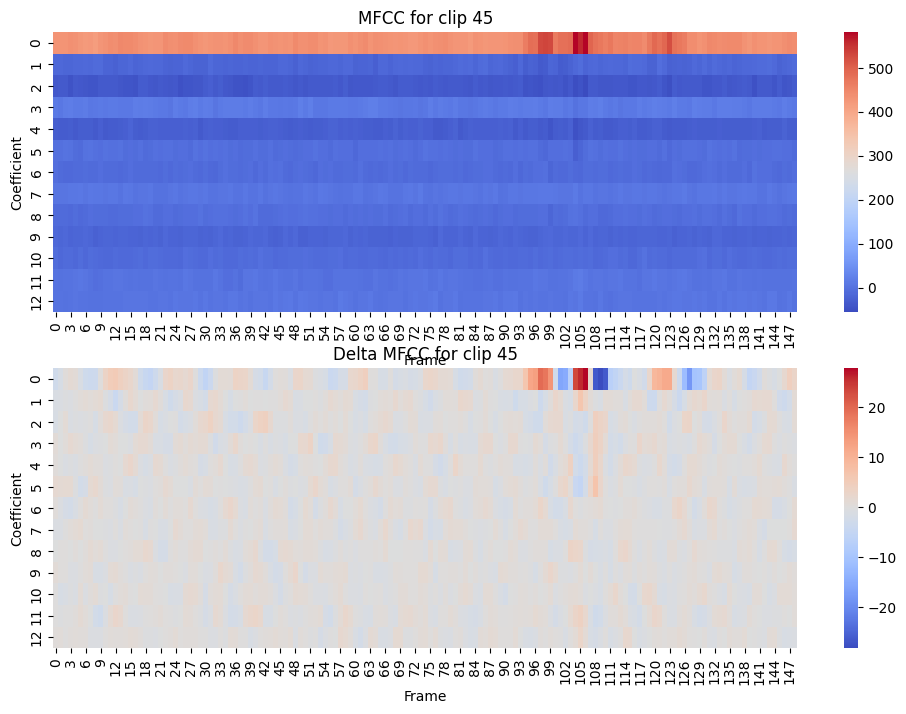

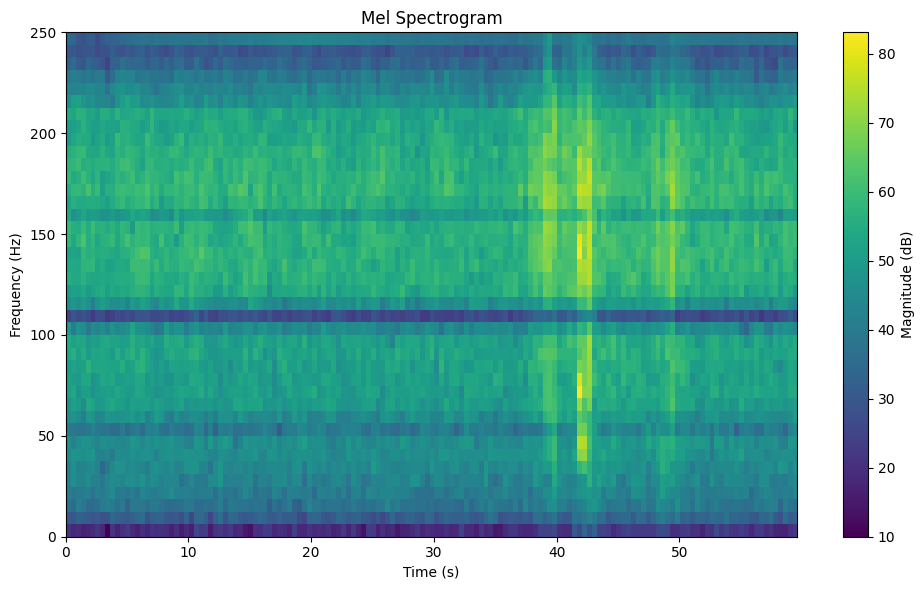

Number of samples: 30000
Number of frames: 149
MFCCs for clip 46: 25.834
Delta MFCCs for clip 46:0.001


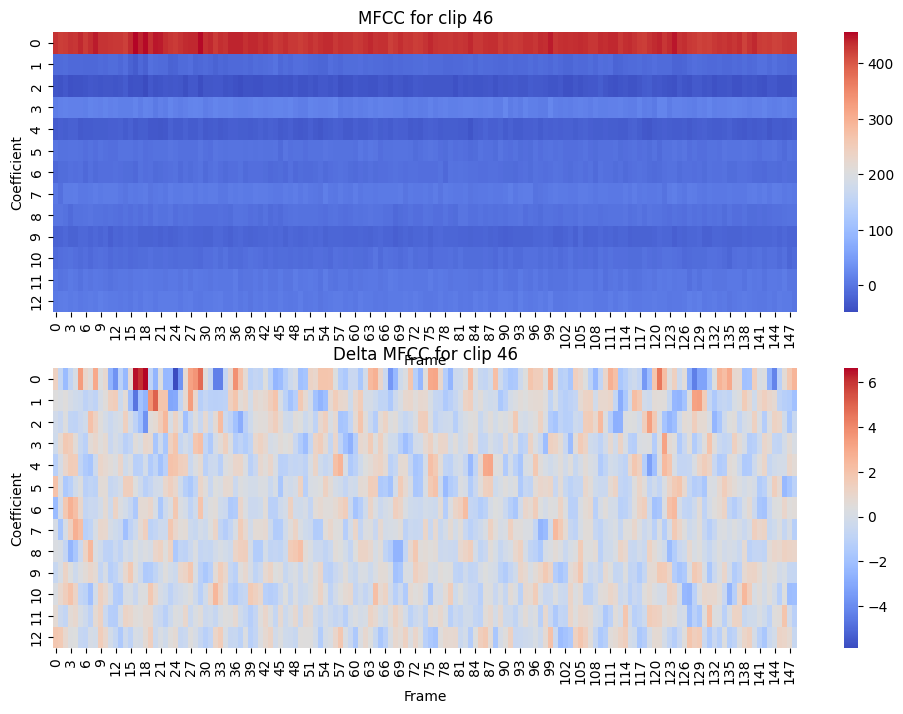

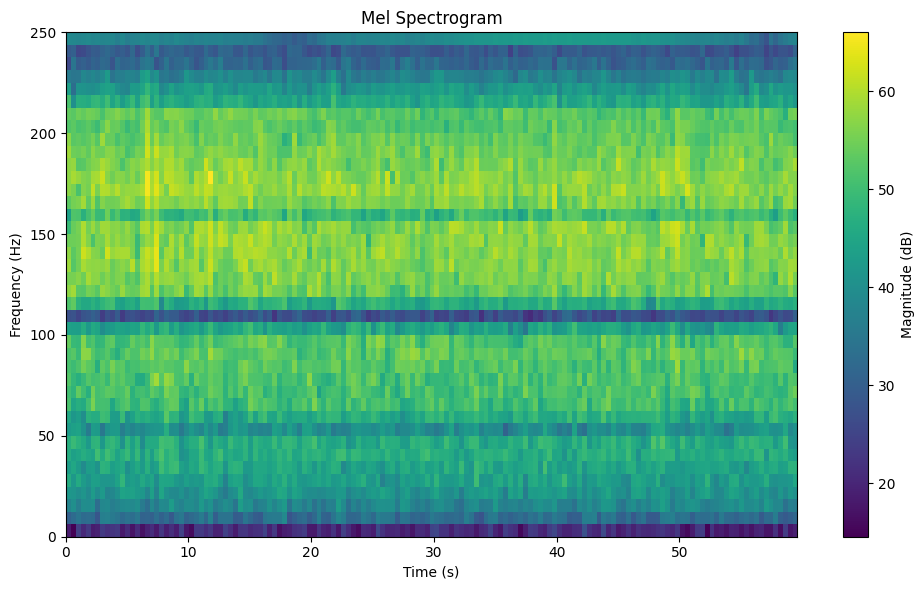

Number of samples: 30000
Number of frames: 149
MFCCs for clip 47: 25.863
Delta MFCCs for clip 47:0.004


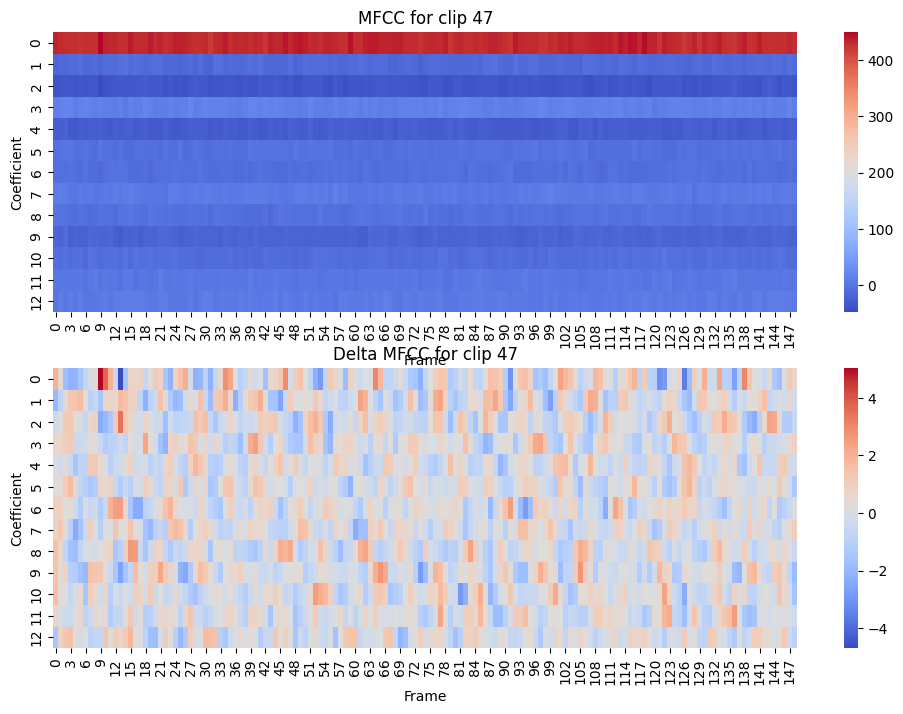

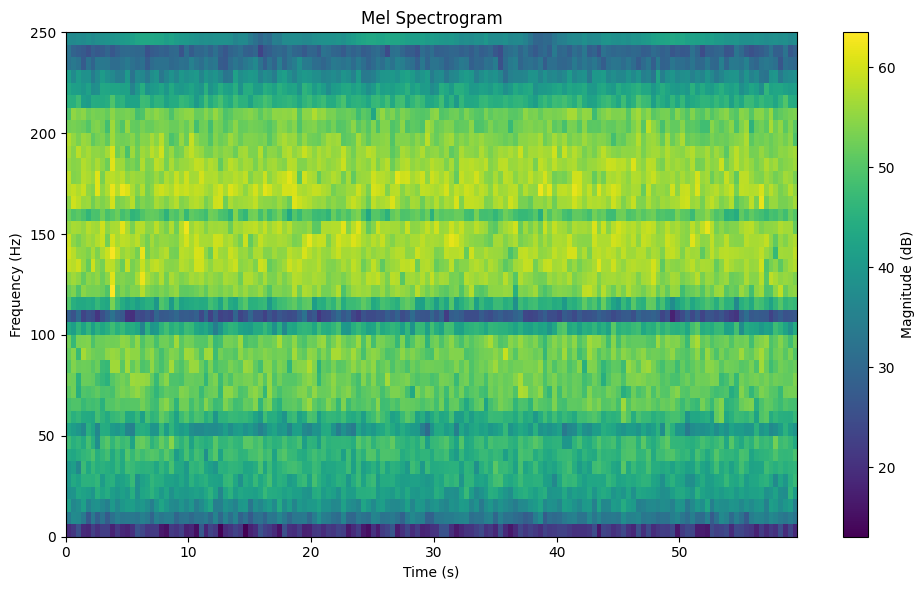

Number of samples: 30000
Number of frames: 149
MFCCs for clip 48: 25.729
Delta MFCCs for clip 48:0.002


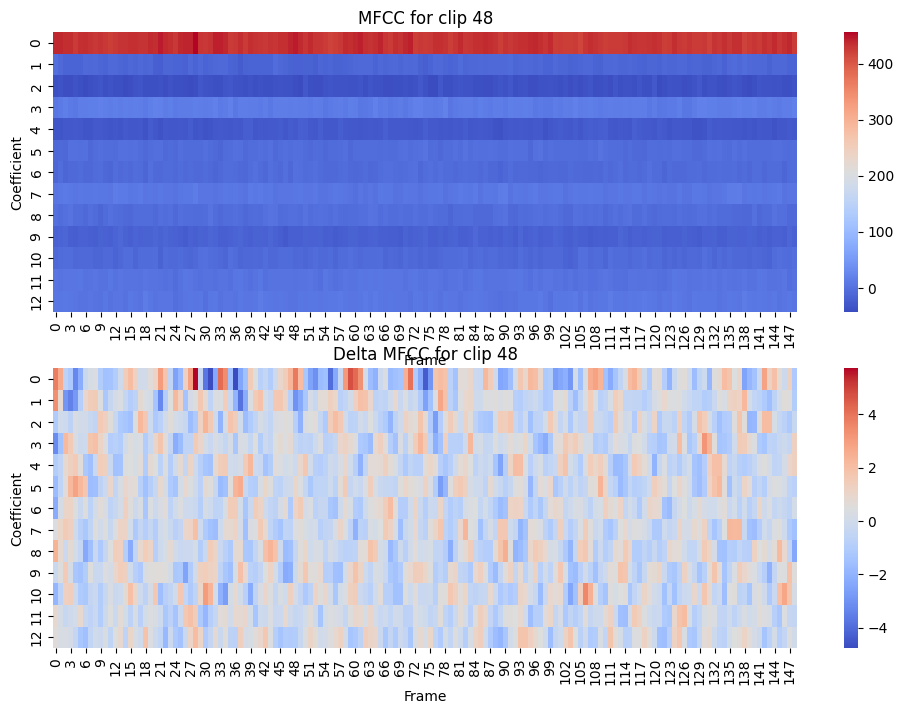

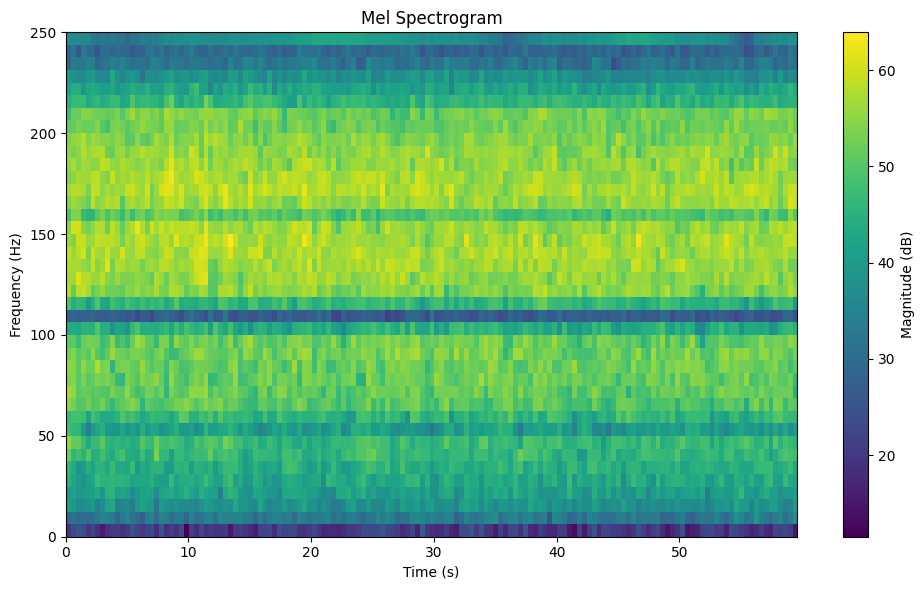

Number of samples: 30000
Number of frames: 149
MFCCs for clip 49: 25.666
Delta MFCCs for clip 49:-0.001


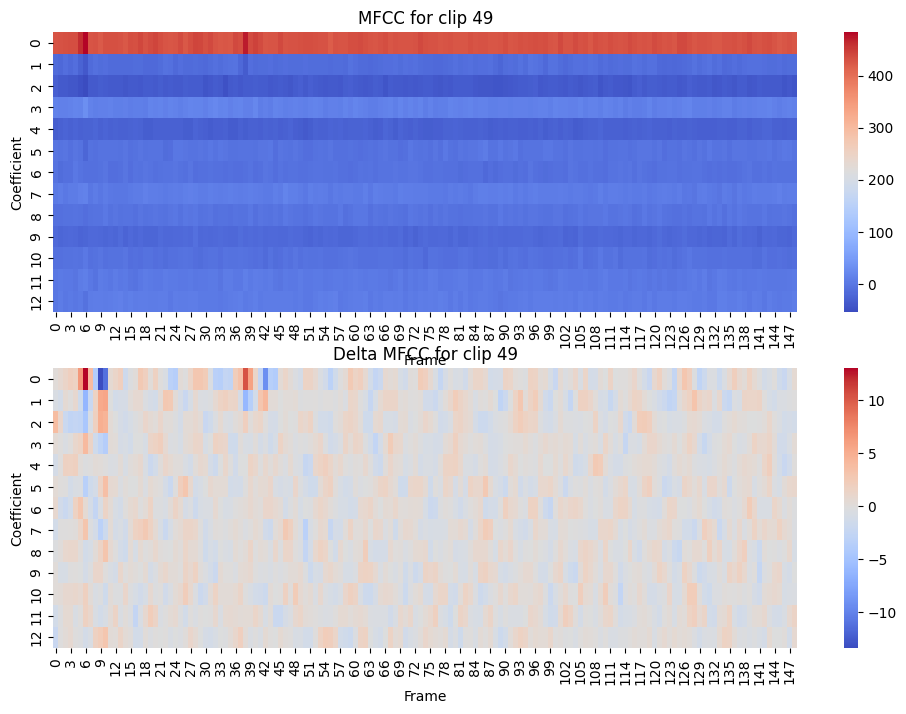

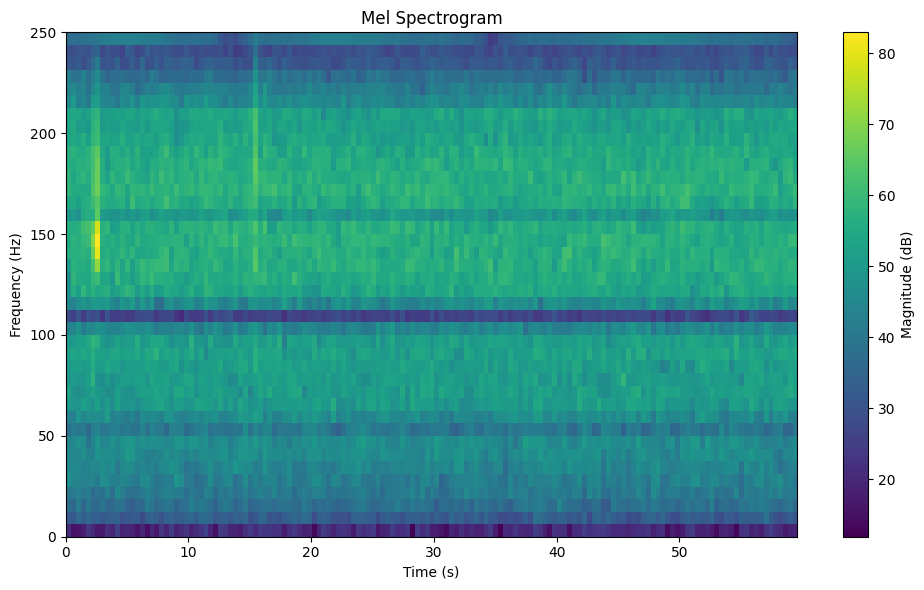

Number of samples: 30000
Number of frames: 149
MFCCs for clip 50: 25.680
Delta MFCCs for clip 50:0.003


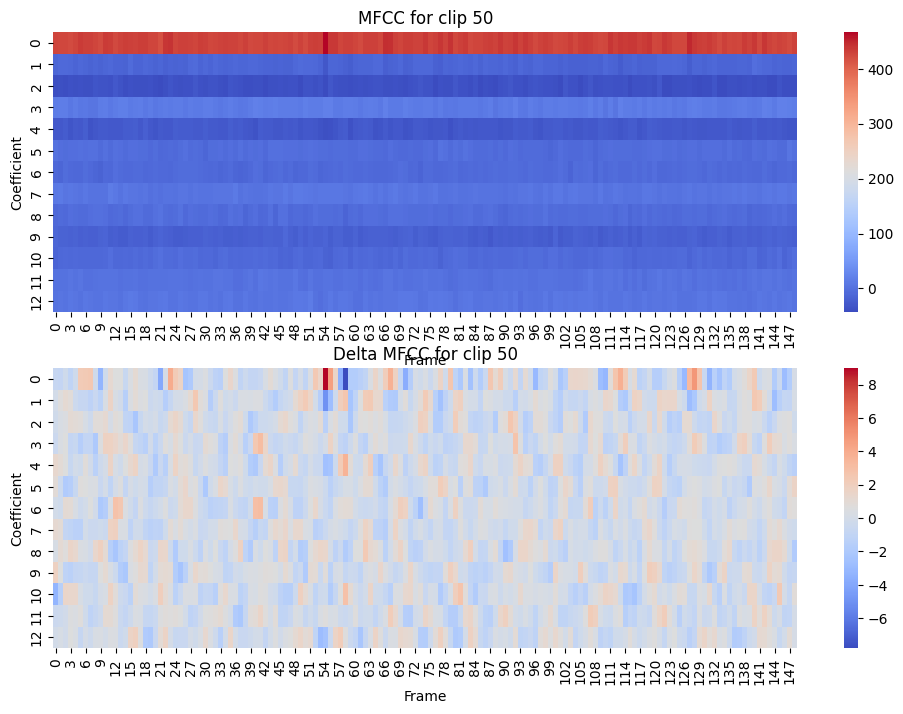

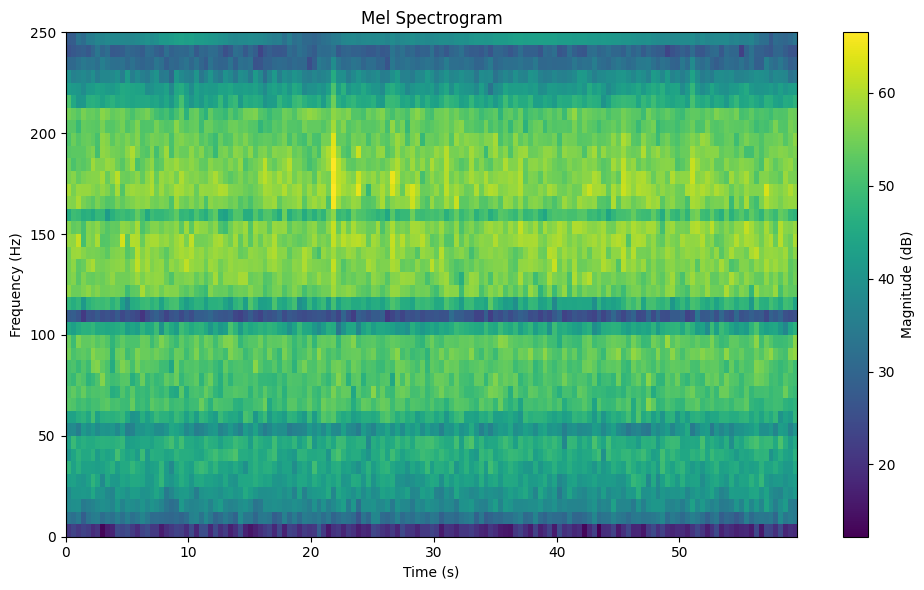

Number of samples: 30000
Number of frames: 149
MFCCs for clip 51: 25.925
Delta MFCCs for clip 51:-0.003


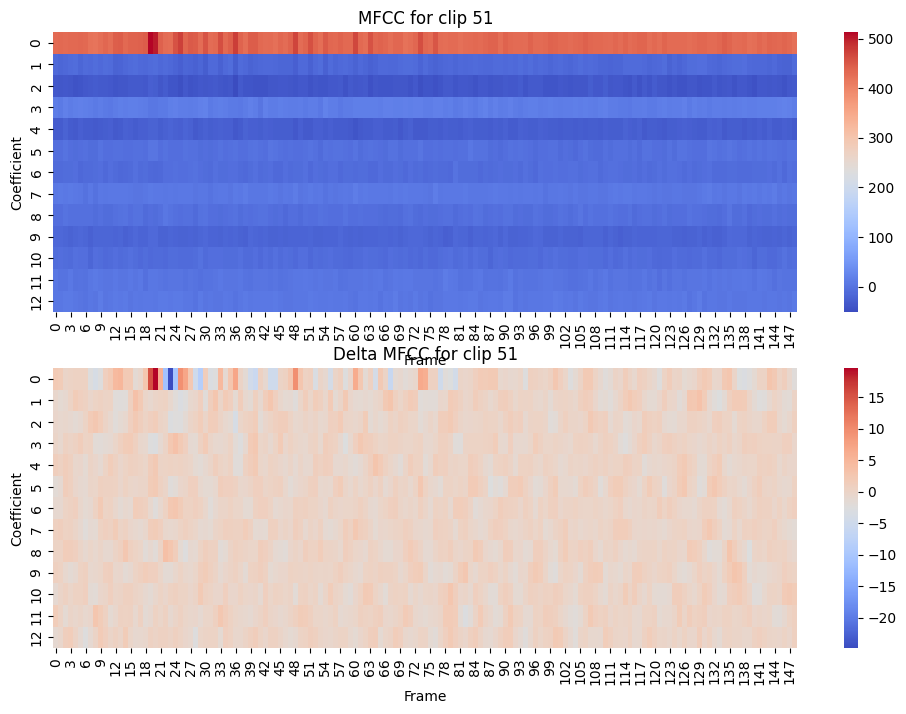

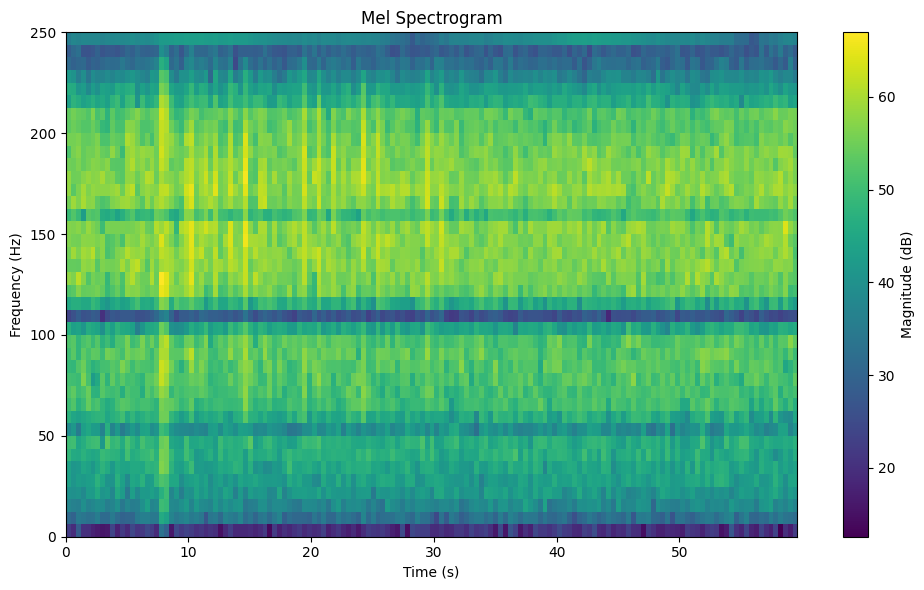

Number of samples: 30000
Number of frames: 149
MFCCs for clip 52: 25.719
Delta MFCCs for clip 52:-0.005


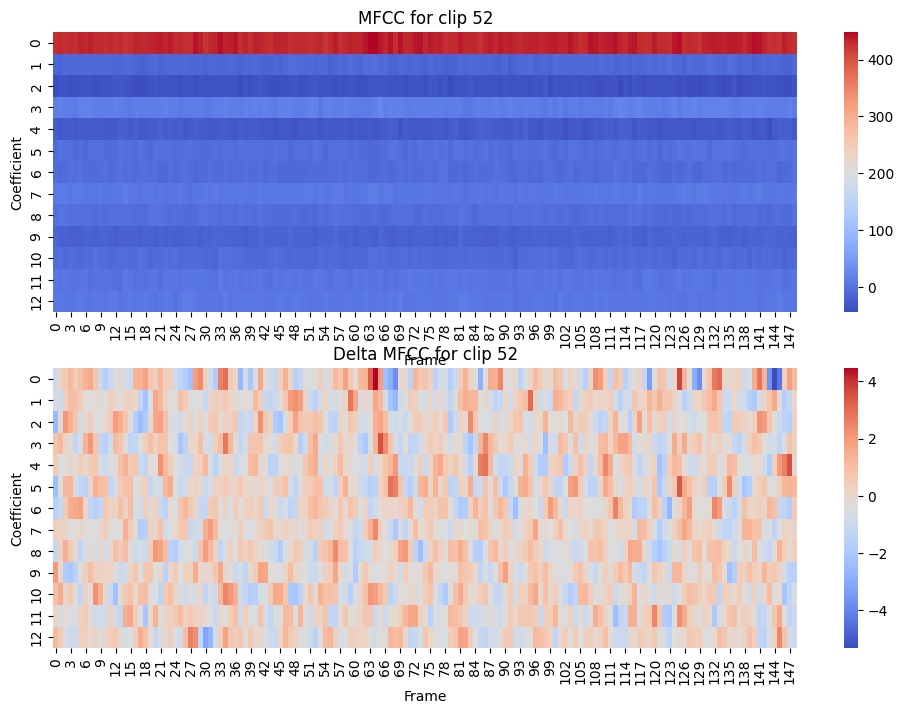

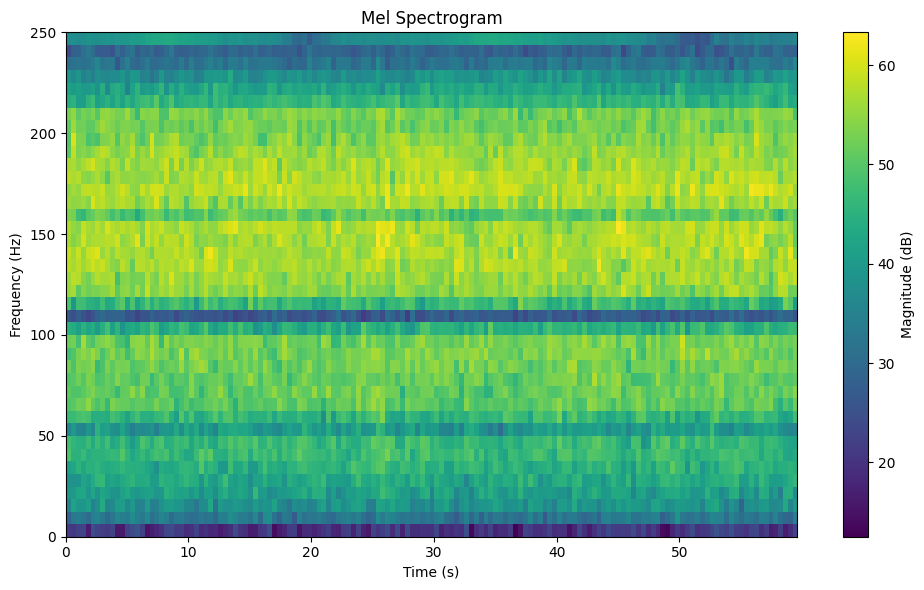

Number of samples: 30000
Number of frames: 149
MFCCs for clip 53: 25.955
Delta MFCCs for clip 53:0.006


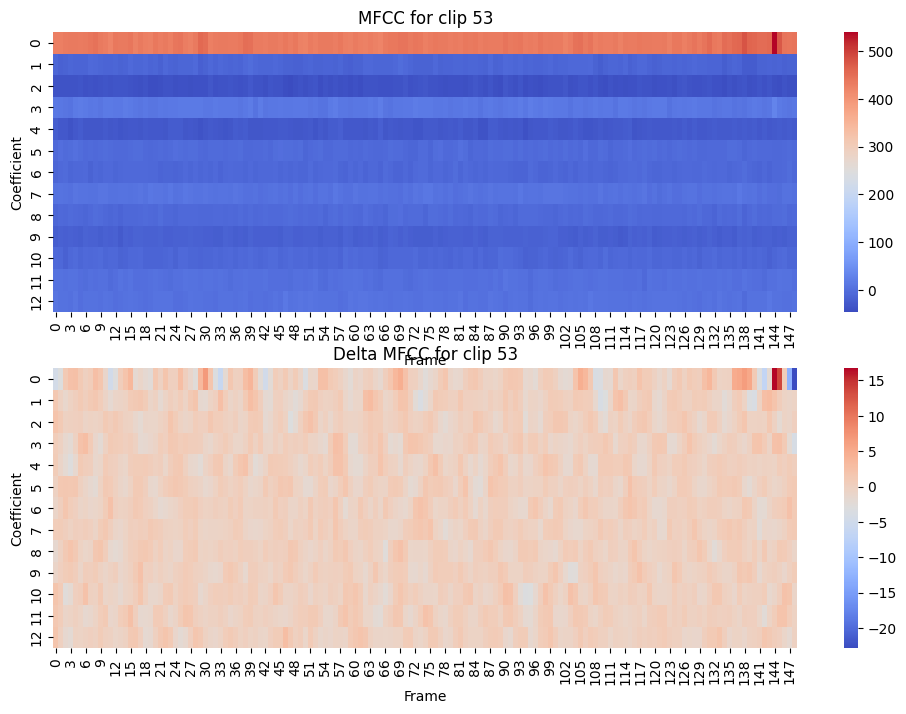

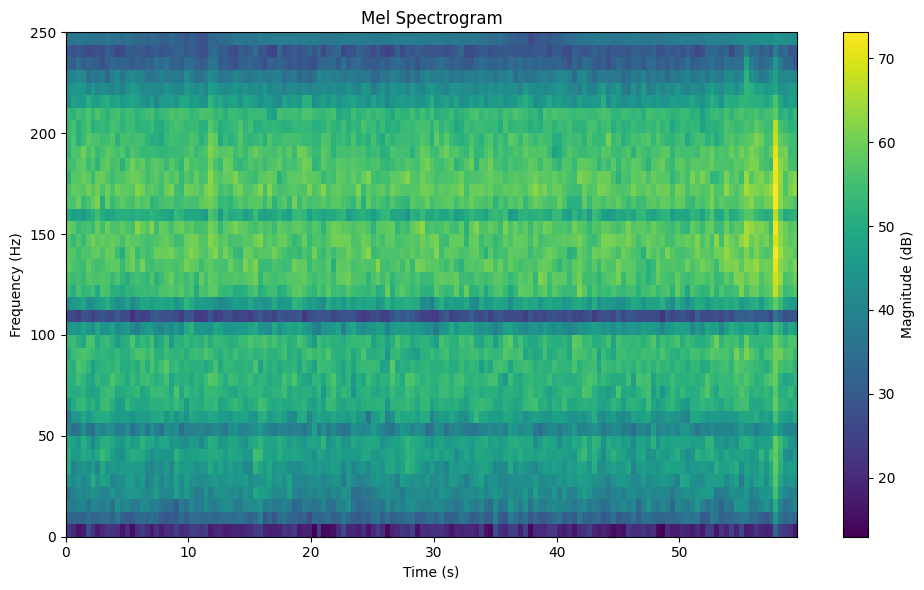

Number of samples: 30000
Number of frames: 149
MFCCs for clip 54: 25.925
Delta MFCCs for clip 54:0.002


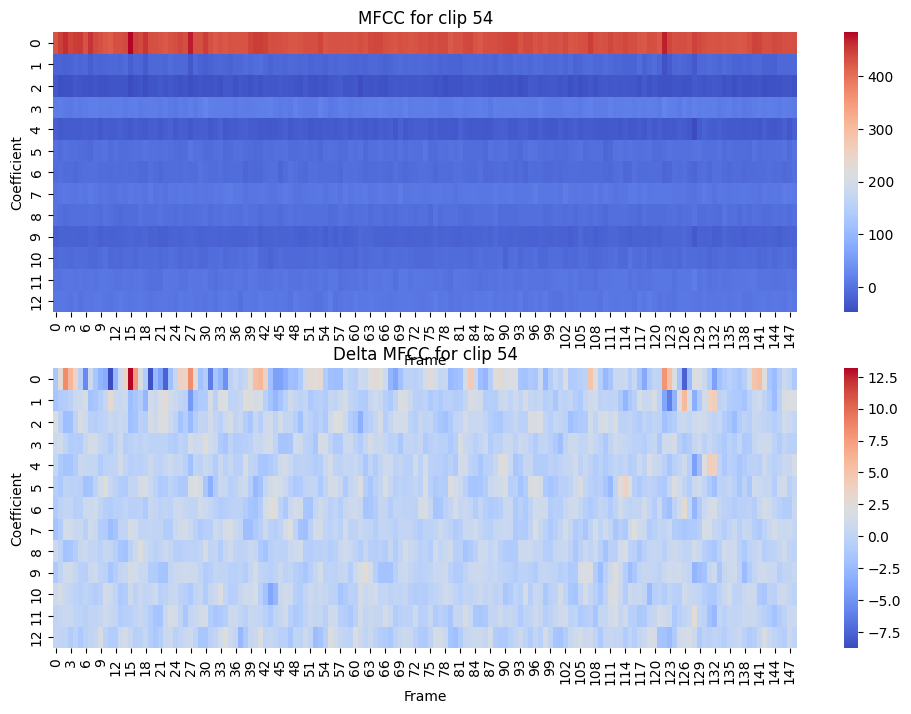

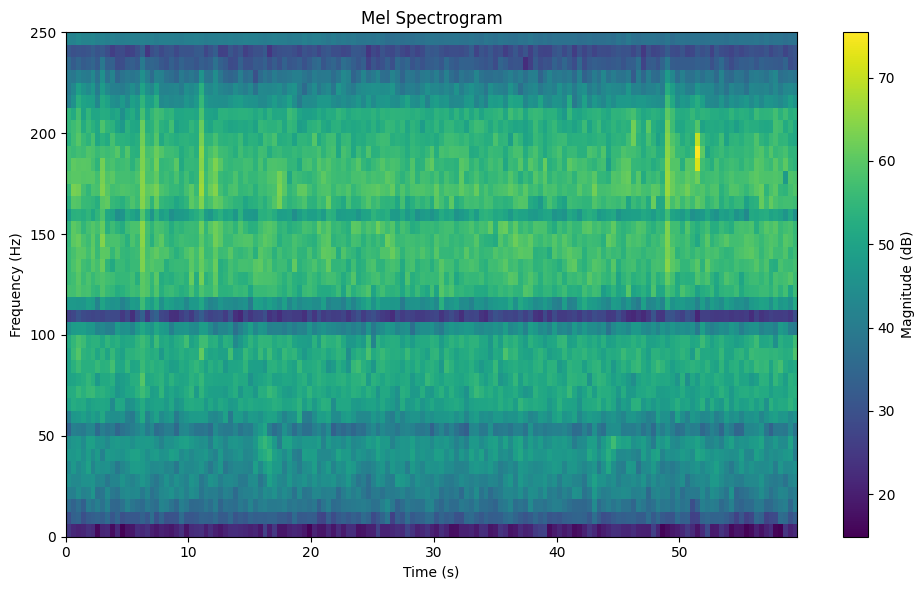

Number of samples: 30000
Number of frames: 149
MFCCs for clip 55: 25.839
Delta MFCCs for clip 55:-0.002


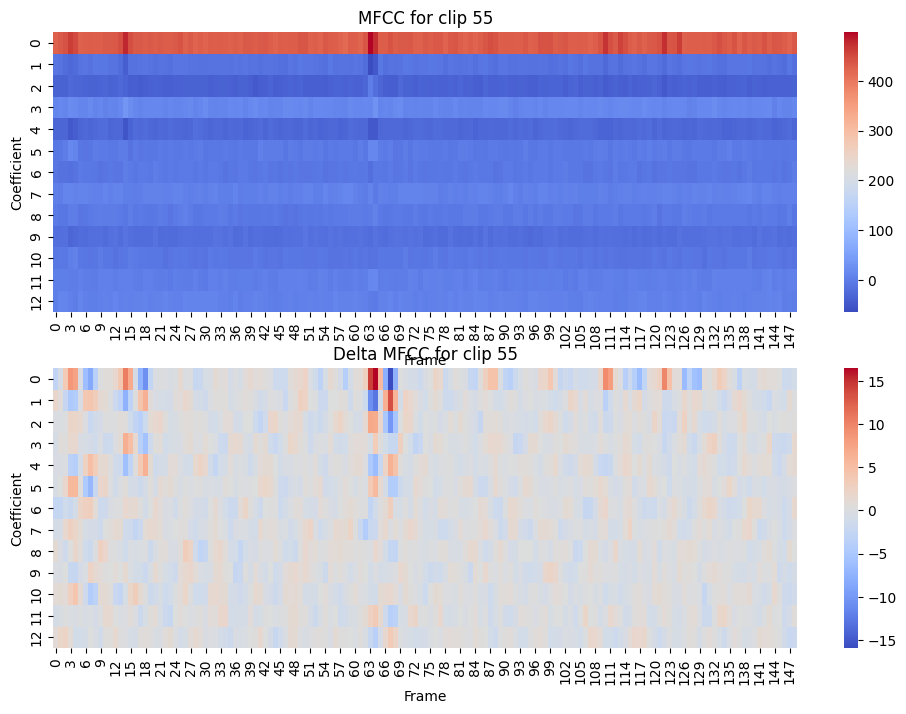

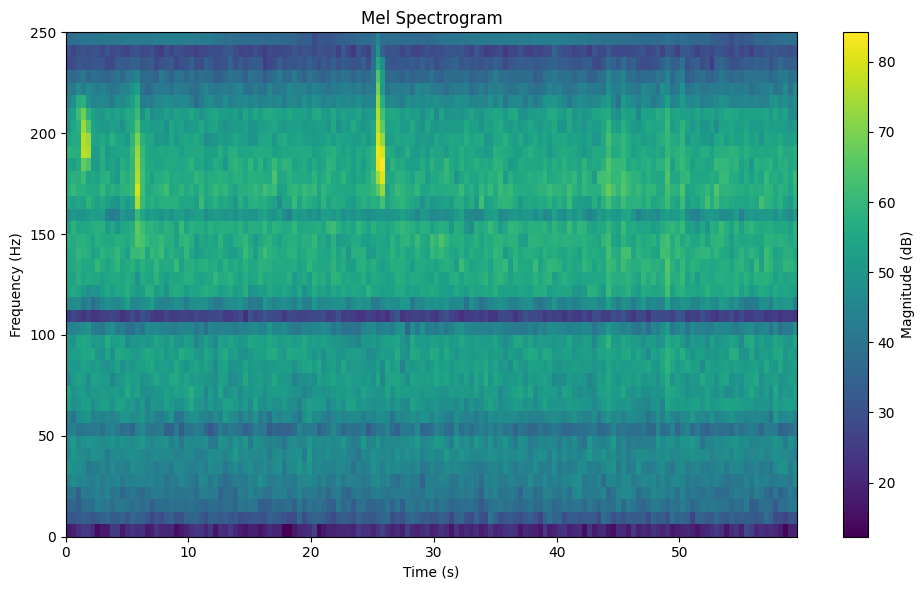

Number of samples: 30000
Number of frames: 149
MFCCs for clip 56: 26.632
Delta MFCCs for clip 56:0.011


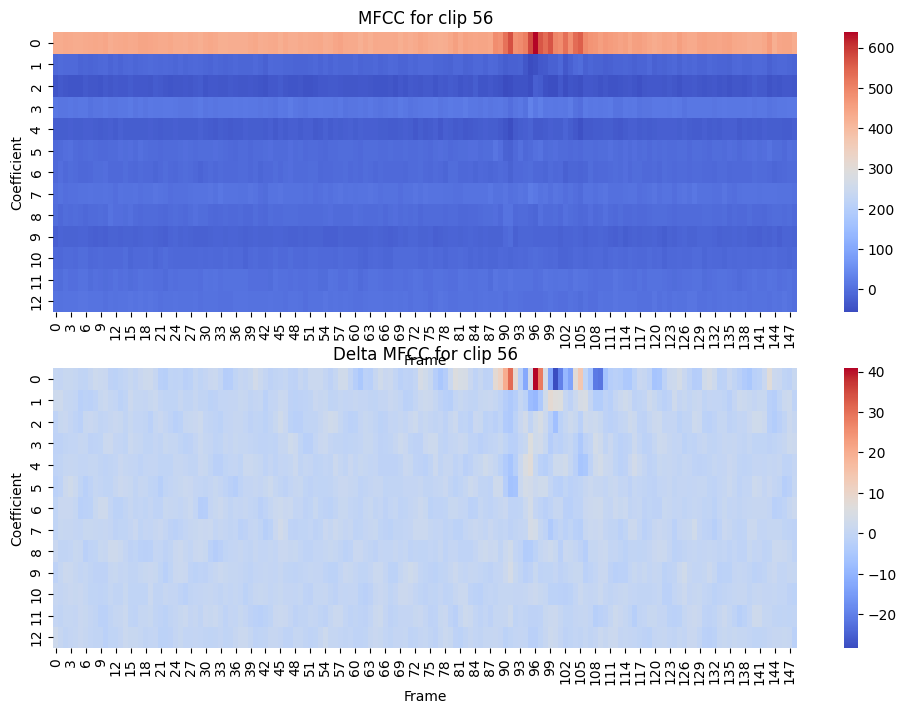

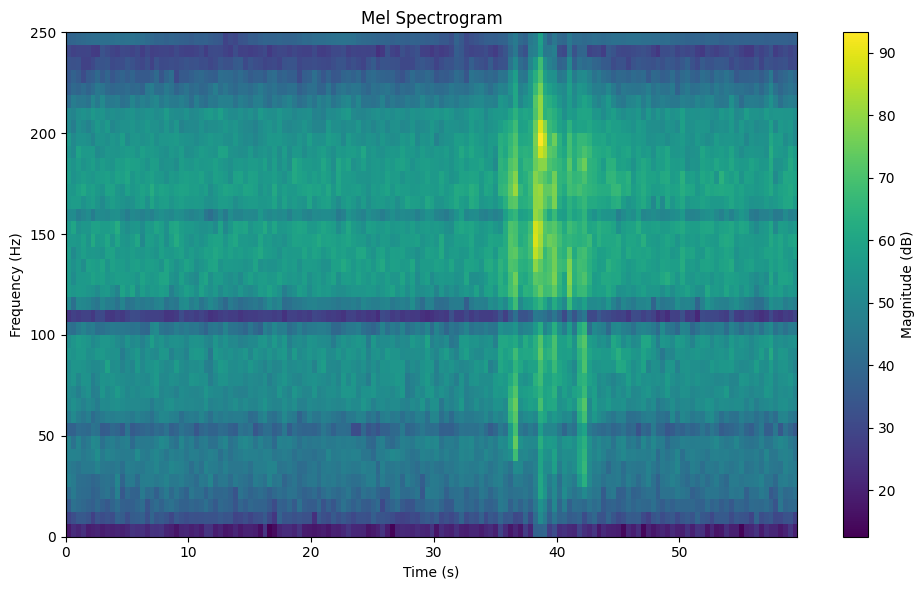

Number of samples: 30000
Number of frames: 149
MFCCs for clip 57: 25.673
Delta MFCCs for clip 57:-0.001


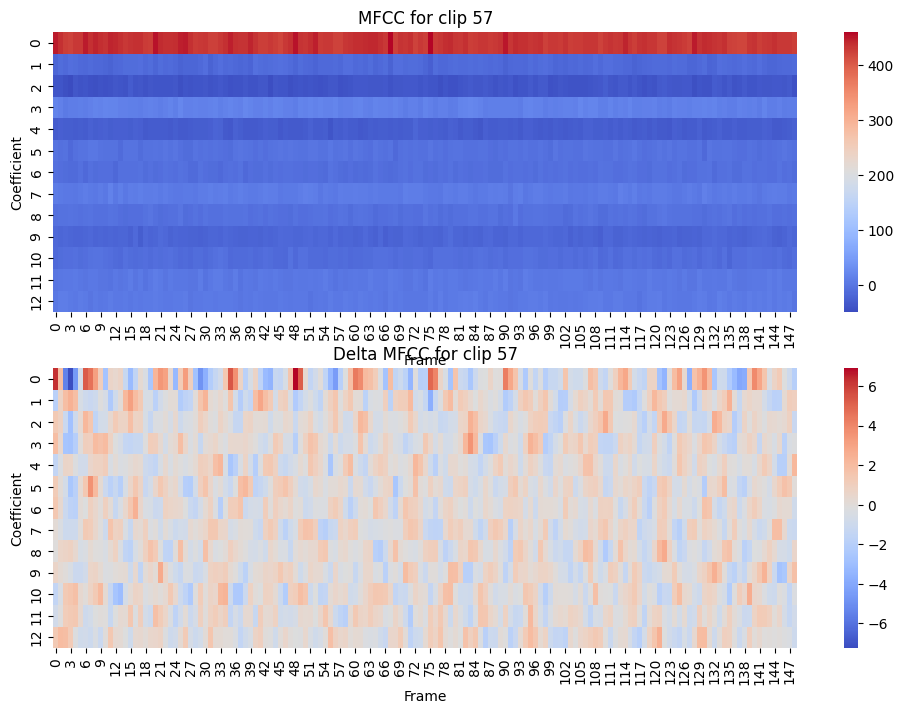

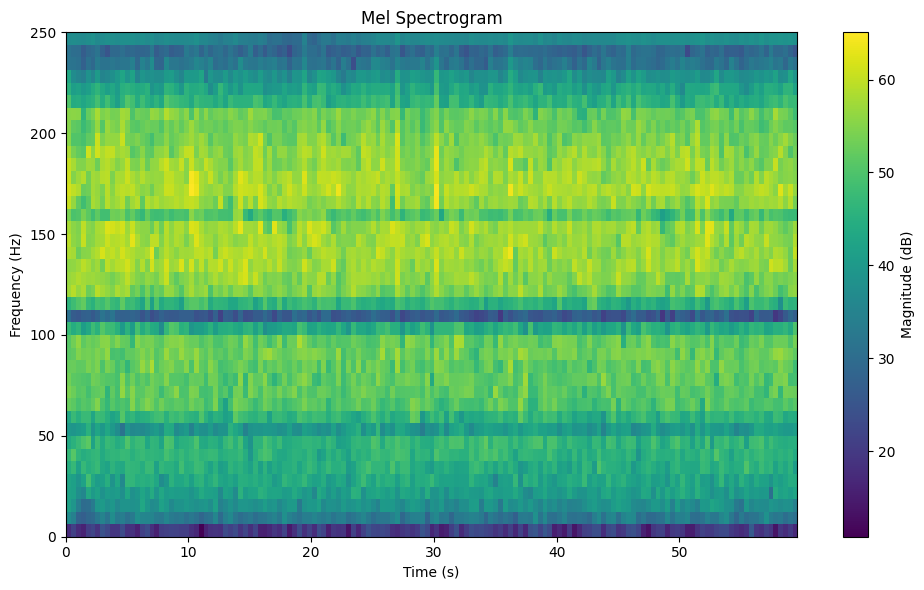

Number of samples: 30000
Number of frames: 149
MFCCs for clip 58: 26.354
Delta MFCCs for clip 58:-0.006


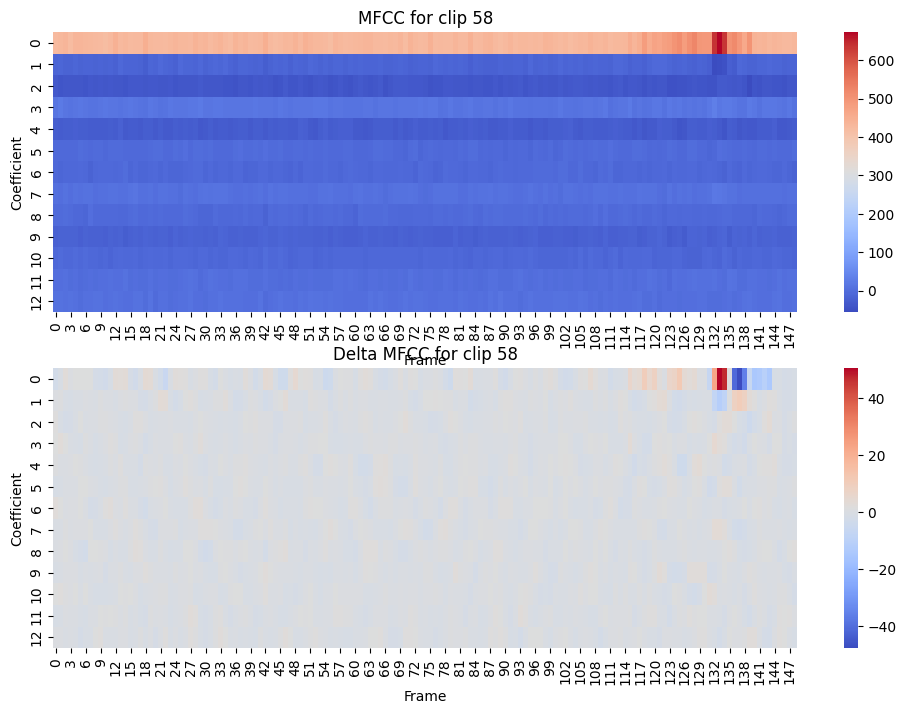

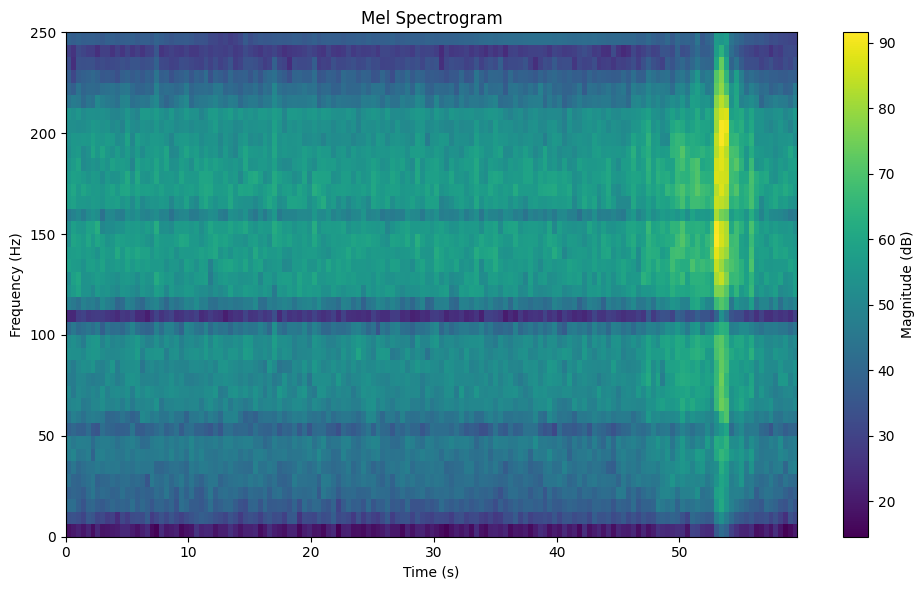

Number of samples: 30000
Number of frames: 149
MFCCs for clip 59: 25.935
Delta MFCCs for clip 59:-0.004


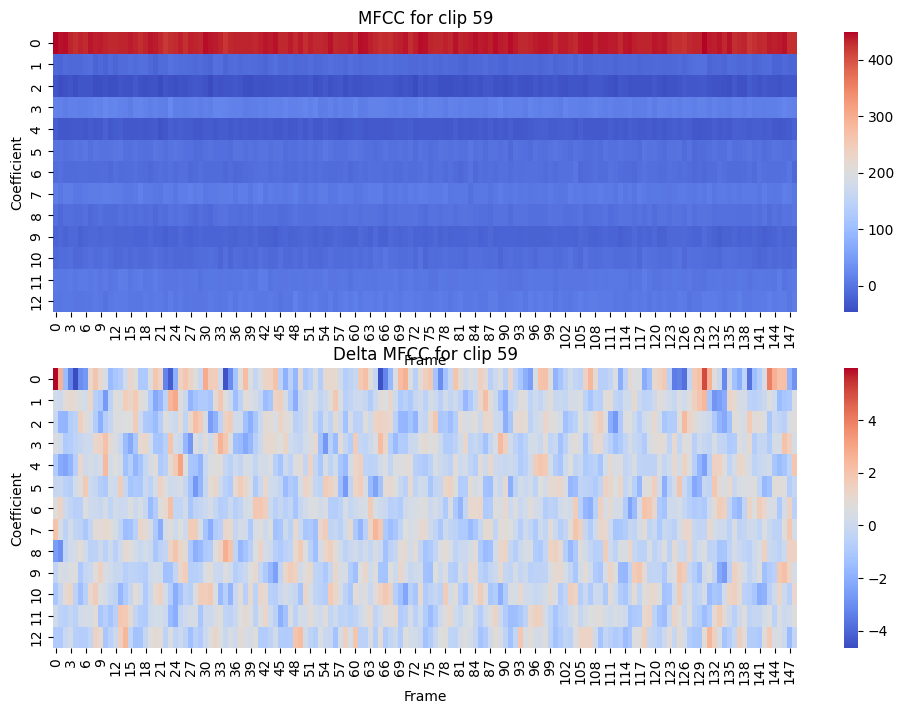

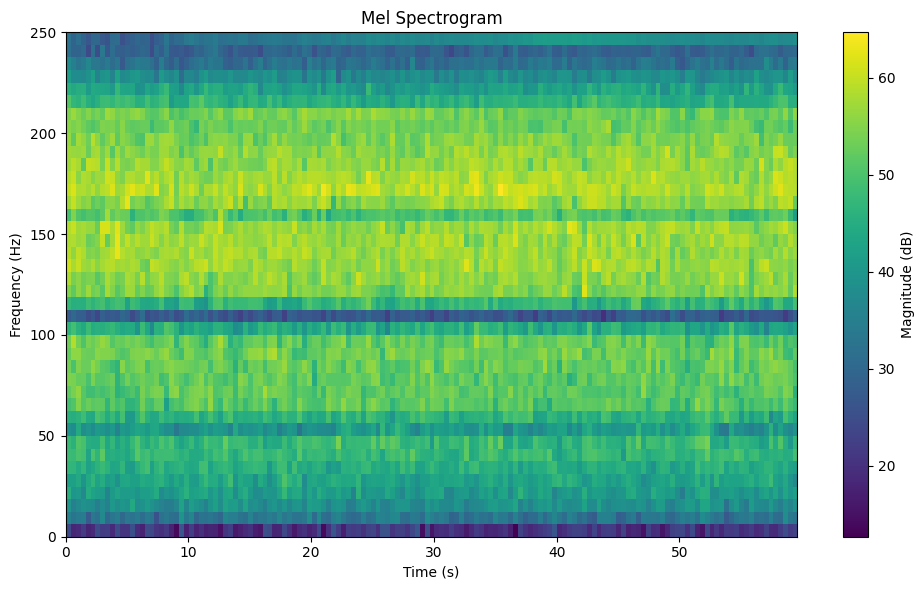

In [ ]:
# Create 60-second clips from the snoring signal
clips = make_clips(signal, sr)
mfcc_mean=[]
delmfcc_mean=[]

# Compute MFCCs for each clip
for i, clip in enumerate(clips):
    framesar, fft_frames,hz_points, mel_spectrogram, mfccs, delta_mfccs = compute_mfccs(clip, sr)
    np.save(f'mfcc_clip_{i}.npy', mfccs)
    np.save(f'delta_mfcc_clip_{i}.npy', delta_mfccs)

    mfcc_mean.append(np.mean(mfccs))
    delmfcc_mean.append(np.mean(delta_mfccs))
     # Print MFCCs and Delta MFCCs for each clip
    print(f"MFCCs for clip {i}: {mfcc_mean[-1]:.3f}")

    print(f"Delta MFCCs for clip {i}:{delmfcc_mean[-1]:.3f}")



# plotting for a clip
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 1, 1)
    sns.heatmap(mfccs.T, cmap='coolwarm', cbar=True)
    plt.title(f'MFCC for clip {i}')
    plt.xlabel('Frame')
    plt.ylabel('Coefficient')

    plt.subplot(2, 1, 2)
    sns.heatmap(delta_mfccs.T, cmap='coolwarm', cbar=True)
    plt.title(f'Delta MFCC for clip {i}')
    plt.xlabel('Frame')
    plt.ylabel('Coefficient')


    plt.figure(figsize=(10, 6))
    plt.imshow(10 * np.log10(mel_spectrogram.T), aspect='auto', origin='lower', cmap='viridis',
           extent=[0, len(framesar) * HOP_SIZE / sr, hz_points[0], hz_points[-1]])
    plt.colorbar(label='Magnitude (dB)')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.tight_layout()
    plt.show()



 # Save MFCCs and Delta MFCCs to text files
    # mfcc_filename = f'mfcc_clip_{i}.txt'
    # delta_mfcc_filename = f'delta_mfcc_clip_{i}.txt'

    # np.savetxt(mfcc_filename, mfccs, delimiter=',')
    # np.savetxt(delta_mfcc_filename, delta_mfccs, delimiter=',')

    # # Download the text files
    # files.download(mfcc_filename)
    # files.download(delta_mfcc_filename)



Calculating and plotting required graphs for mfcc and delta mfcc for whole signal


Number of samples: 1800000
Number of frames: 8999
MFCC:
[[432.69006821  -8.51380369 -38.41801687 ...  -6.22920339   1.0389606
    5.49231864]
 [433.21222701  -8.56131742 -35.83857891 ...  -9.86391753  -2.6169058
    6.66707876]
 [436.64001957 -10.32879776 -37.71211772 ...  -8.7183113   -2.60983422
    5.24628598]
 ...
 [441.33205035 -12.71741303 -33.86805375 ... -13.84281065  -0.88901649
    8.74690591]
 [426.19202877 -17.70243262 -34.60943794 ... -14.57085933   3.60612031
    2.90848348]
 [428.89199394 -15.89375929 -34.87206457 ...  -8.4164644    5.84755552
    7.49788326]]
Delta MFCC:
[[ 1.13942228  2.21398668 -1.06378569 ...  0.6561783  -1.44257848
  -0.60166939]
 [ 0.86404661  1.46648837 -0.19330287 ... -0.28949062 -1.69289226
  -0.1661609 ]
 [ 0.84220615 -0.36775019  0.39912363 ... -0.86129299 -1.0953456
   0.06826948]
 ...
 [ 2.16742894 -1.11146187 -0.602793   ...  0.04767854  0.00832162
  -0.03704553]
 [-1.8604545  -1.03750762  0.41858444 ... -0.62298948  0.13545295
  -1.5743459

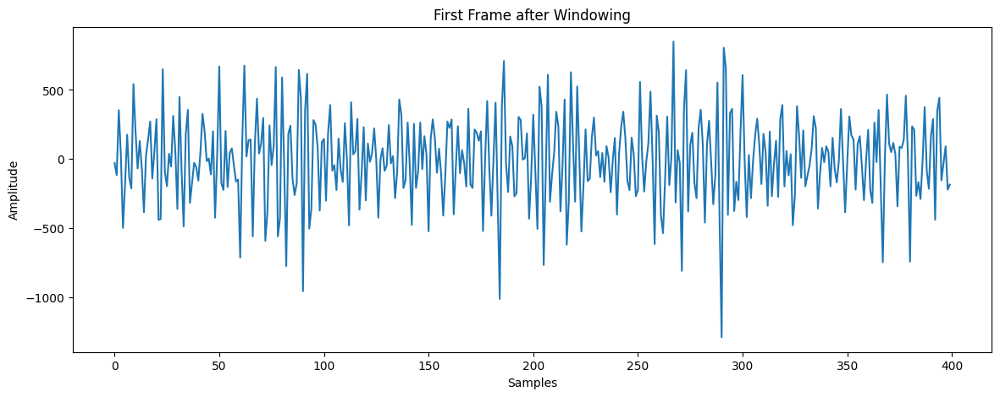

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


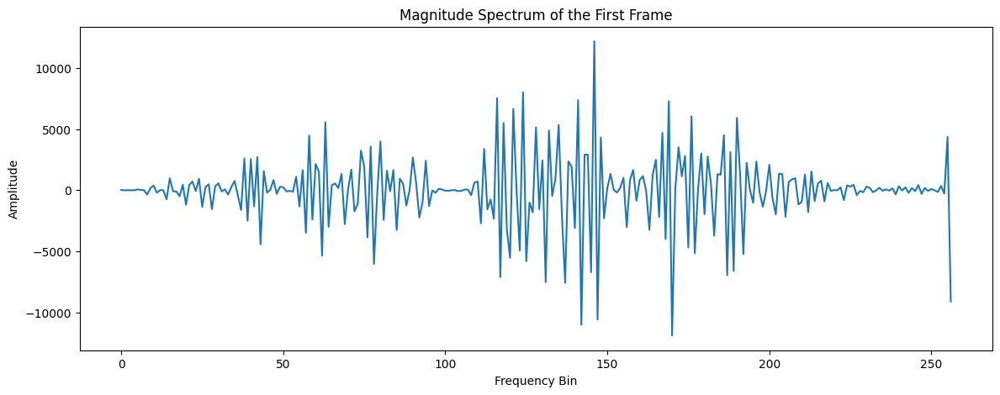

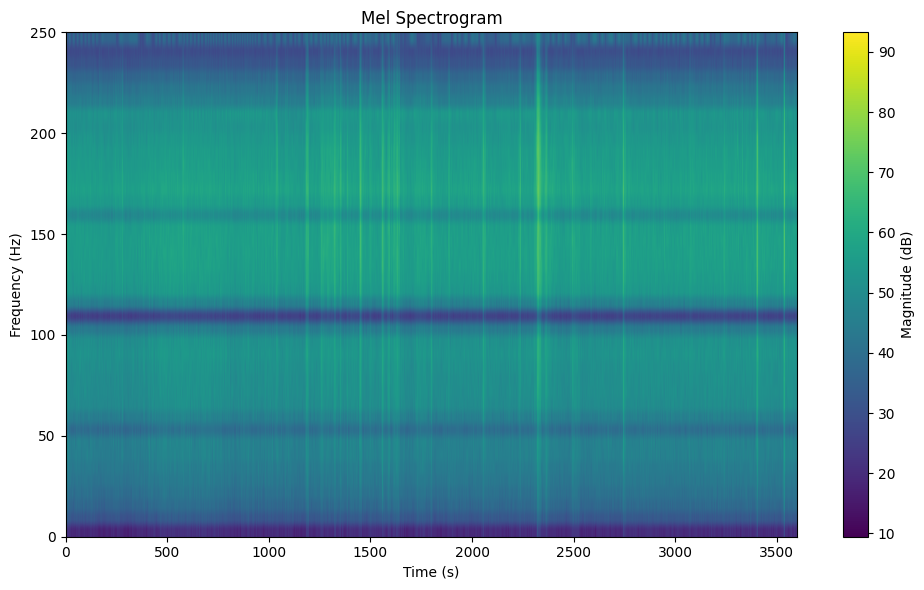

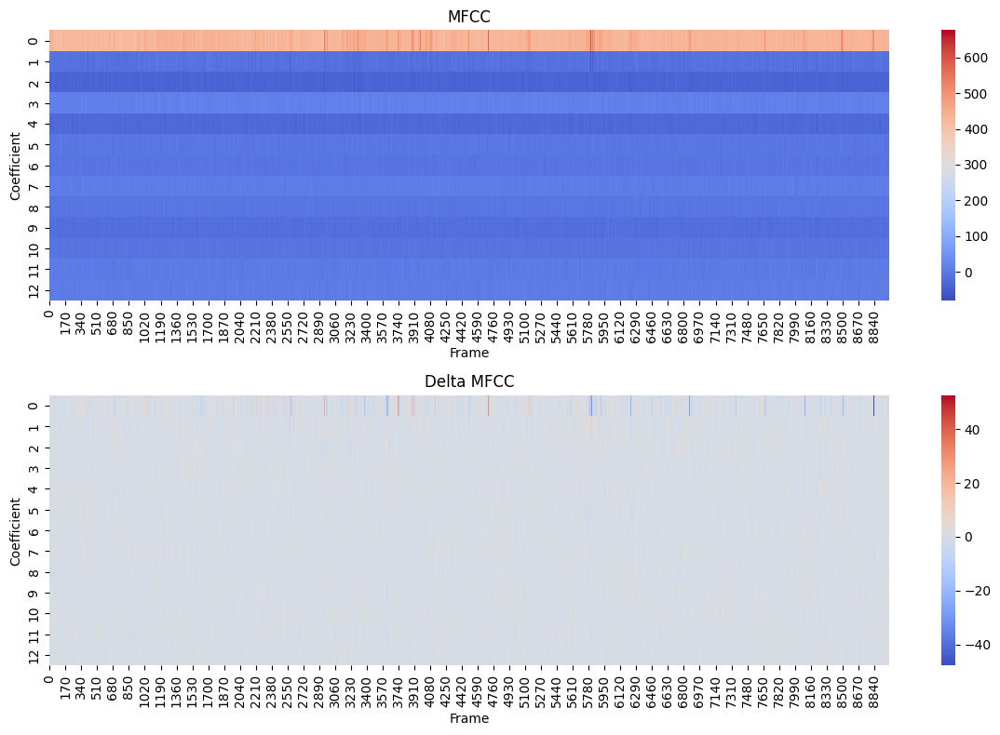

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

framesar, fft_frames,hz_points, mel_spectrogram, mfccs, delta_mfccs=compute_mfccs(signal, sr)

print("MFCC:")
print(mfccs)
print("Delta MFCC:")
print(delta_mfccs)


# plotting window of first frame
plt.figure(figsize=(14, 5))
plt.plot(framesar[0])
plt.title('First Frame after Windowing')
plt.xlabel('Samples')
plt.ylabel('Amplitude')
plt.show()

# Plot the magnitude spectrum of the first frame (fft result)
plt.figure(figsize=(14, 5))
plt.plot(fft_frames[0])
plt.title('Magnitude Spectrum of the First Frame')
plt.xlabel('Frequency Bin')
plt.ylabel('Amplitude')
plt.show()

# Plot the filter bank energies
# plt.figure(figsize=(14, 5))
# plt.imshow(fbank.T, cmap='hot', aspect='auto')
# plt.title('Filter Bank Energies')
# plt.xlabel('Frame Index')
# plt.ylabel('Filter Index')
# plt.show()

# Plot spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(10 * np.log10(mel_spectrogram.T), aspect='auto', origin='lower', cmap='viridis',
           extent=[0, len(framesar) * HOP_SIZE / sr, hz_points[0], hz_points[-1]])
plt.colorbar(label='Magnitude (dB)')
plt.title('Mel Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.tight_layout()
plt.show()

# Plotting MFCC and Delta mfcc
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
sns.heatmap(mfccs.T, cmap='coolwarm', cbar=True)
plt.title('MFCC')
plt.xlabel('Frame')
plt.ylabel('Coefficient')

plt.subplot(2, 1, 2)
sns.heatmap(delta_mfccs.T, cmap='coolwarm', cbar=True)
plt.title('Delta MFCC')
plt.xlabel('Frame')
plt.ylabel('Coefficient')


plt.tight_layout()
plt.show()

signal processing psg;
Extracting snoring signal from psg dataset

In [ ]:
!pip install pyedflib
from google.colab import files
# uploaded = files.upload()
# edf_path = next(iter(uploaded))
# import zipfile
# # Unzip the file
# with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
#     zip_ref.extractall('/content')

# # List the extracted files to find the EDF file
# import os
# extracted_files = os.listdir('/content')


# first you need to upload the edf file in google drive under content path then paste the filename
from google.colab import drive
drive.mount('/content/drive')
# filepath in drive
edf_path = '/content/drive/My Drive/00001057-100507[003]_pt2.edf'


import pyedflib
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile


# Open the EDF file
edf = pyedflib.EdfReader(edf_path)
# Get the list of signal labels
signal_labels = edf.getSignalLabels()

# Print the signal labels
print("Signal Labels: ", signal_labels)

# Find the index of the snoring signal (assuming it is labeled 'Snore')
snore_index = signal_labels.index('Snore')

# Get the sampling frequency of the snoring signal
fs = edf.getSampleFrequency(snore_index)

# Read the snoring signal data
snore_signal = edf.readSignal(snore_index)

# Close the EDF file
edf.close()

# Plot the snoring signal
plt.figure(figsize=(10, 4))
plt.plot(snore_signal)
plt.title('Snoring Signal')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.show()

# IF ENTERING A NEW EDF FILE, TO SAVE ITS SNORING SIGNAL THEN COMMENT IN THE BELOW CODE

# # Convert the snoring signal to 16-bit signed integers
# snore_signal = snore_signal / np.max(np.abs(snore_signal))
# snore_signal = (snore_signal * 32767).astype(np.int16)

# # FOR NEW SIGNAL CHANGE THE AUDIO FILENAME APPROPRIATELY

# # Save the snoring signal to a WAV file
# fs=int(fs)
# wavfile.write('snore_signal3pt2.wav', fs, snore_signal)

# # Download the WAV file
# files.download('snore_signal3pt2.wav')


AHC CLUSTERING

Cluster 1: Normal Breathing
Clip 1, Clip 2, Clip 3, Clip 4, Clip 5, Clip 6, Clip 7, Clip 8, Clip 9, Clip 10, Clip 13, Clip 15, Clip 18, Clip 19, Clip 20, Clip 21, Clip 24, Clip 29, Clip 32, Clip 33, Clip 36, Clip 37, Clip 43, Clip 44, Clip 45, Clip 47, Clip 48, Clip 49, Clip 50, Clip 51, Clip 52, Clip 53, Clip 54, Clip 55, Clip 56, Clip 58, Clip 59, Clip 60

Cluster 2: Snoring
Clip 14, Clip 16, Clip 17, Clip 22, Clip 23, Clip 25, Clip 28, Clip 31, Clip 34, Clip 35, Clip 38, Clip 40, Clip 41, Clip 42, Clip 46

Cluster 3: Uncertain
Clip 11, Clip 12, Clip 26, Clip 27, Clip 30, Clip 39, Clip 57



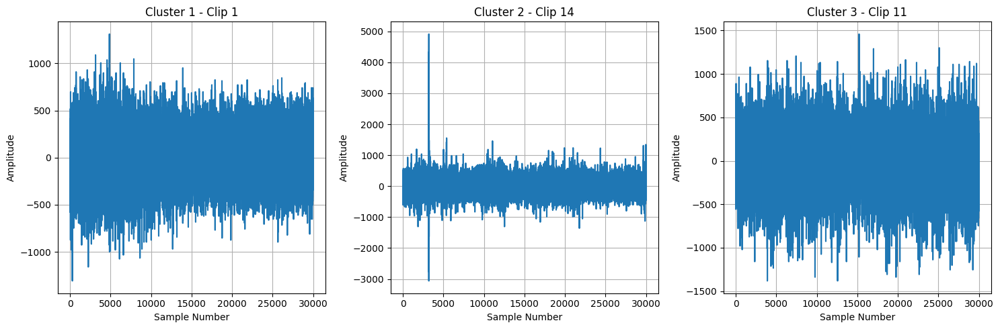

In [ ]:

import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# here the features obtained before(for each clip) are stored as matrix
# Each row represents a clip, and each column represents a feature
features = np.array([
    zcr_mean_list,
    mfcc_mean,
    delmfcc_mean
]).T  # Transpose to get shape (n_samples, n_features)


# Standardize the features
scaler = StandardScaler()
features_standardized = scaler.fit_transform(features)


# Perform Agglomerative Hierarchical Clustering
num_clusters = 3  # Example number of clusters (adjust as needed)
ahc = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
clusters = ahc.fit_predict(features_standardized)


# Create a DataFrame to store features and cluster labels
df_features = pd.DataFrame(features, columns=['ZCR Mean', 'MFCC Mean', 'Delta MFCC Mean'])
df_features['Cluster'] = clusters

# Label clusters manually based on the analysis
cluster_labels = {0: 'Normal Breathing', 1: 'Snoring', 2: 'Uncertain'}

# Add the labels to the DataFrame
df_features['Label'] = df_features['Cluster'].map(cluster_labels)

for cluster_label in range(num_clusters):
    cluster_name = cluster_labels[cluster_label]
    print(f"Cluster {cluster_label + 1}: {cluster_name}")

    # Filter DataFrame for the current cluster
    cluster_clips = df_features[df_features['Cluster'] == cluster_label].index

    # Print list of clip numbers belonging to this cluster
    clip_list = ', '.join([f"Clip {clip_idx + 1}" for clip_idx in cluster_clips])
    print(clip_list)

    print()

# Plotting one clip from each cluster
plt.figure(figsize=(15, 5))

for cluster_label in range(num_clusters):
    # Select one clip from the current cluster
    clip_idx = df_features[df_features['Cluster'] == cluster_label].index[0]

    # the original clips stored in a list named 'clips'
    clip = clips[clip_idx]

    # Create a subplot for each cluster
    plt.subplot(1, num_clusters, cluster_label + 1)

    # Plot the waveform of the selected clip
    plt.plot(np.arange(len(clip)), clip)
    plt.title(f'Cluster {cluster_label + 1} - Clip {clip_idx + 1}')
    plt.xlabel('Sample Number')
    plt.ylabel('Amplitude')
    plt.grid(True)

plt.tight_layout()
plt.show()

Extracting required clips

In [ ]:
import numpy as np

def extract_60s_clips(signal, sr, clip_indices, clip_duration=60):
    clips = []
    samples_per_clip = clip_duration * sr

    for idx in clip_indices:
        start_sample = idx * samples_per_clip
        end_sample = start_sample + samples_per_clip

        # Ensure end_sample does not exceed signal length
        if end_sample > len(signal):
            end_sample = len(signal)
            start_sample = end_sample - samples_per_clip

        clip = signal[start_sample:end_sample]
        clips.append(clip)

    return clips




# just for simplicity and a bit better functionality rewrote a new function for making clips


K-MEANS Clustering Processes


Storing snoring clips

In [ ]:
# Define the cluster mapping
cluster_mapping = {
    0: 'Normal',
    1: 'Snoring'
}

# Find the cluster label for 'Snoring'
snoring_cluster_label = [label for label, name in cluster_mapping.items() if name == 'Snoring'][0]

# Extract indices of snoring clips from features DataFrame
snoring_clips_indices = df_features[df_features['Label'] == 'Snoring'].index


# Assuming 'clips' is a list of all audio clips and you want to extract the snoring clips
snoring_clips =  extract_60s_clips(signal, sr, snoring_clips_indices)




Feature Extraction

In [ ]:
import numpy as np
from scipy.linalg import toeplitz

def hamming_window(length):
    return np.hamming(length)

def lpc(y, order):
    y = np.asarray(y)
    r = np.correlate(y, y, mode='full')
    r = r[len(r)//2:]

    order = min(order, len(r) - 1)
    R_matrix = np.zeros((order, order))

    for i in range(order):
        if i + order <= len(r):
            R_matrix[i, :] = r[i:i+order]
        else:
            R_matrix[i, :len(r)-i] = r[i:]
            break

    lpc_coeffs = np.zeros(order)
    E = r[0]

    for i in range(order):
        k = (r[i+1] - np.dot(lpc_coeffs[:i], r[i:0:-1])) / E
        lpc_coeffs[i] = k
        E *= (1 - k**2)
        for j in range(i):
            lpc_coeffs[j] = lpc_coeffs[j] - k * lpc_coeffs[i-1-j]

    return np.concatenate(([1], -lpc_coeffs))



def extract_formants(lpc_coeffs, sr):
    rts = np.roots(lpc_coeffs)
    rts = [r for r in rts if np.imag(r) >= 0]
    angz = np.arctan2(np.imag(rts), np.real(rts))
    formants = sorted(angz * (sr / (2 * np.pi)))
    return formants

def extract_features(clip, sr):
    frame_length = int(0.02 * sr)  # 20ms
    hop_size = int(0.01 * sr)      # 10ms
    formant_intervals = []
    formant_frequencies = []

    # print(f"Processing clip of length: {len(clip)} samples")

    for i in range(0, len(clip) - frame_length, hop_size):
        frame = clip[i:i + frame_length]
        if len(frame) < frame_length:
            continue

        windowed_frame = frame * hamming_window(len(frame))
        lpc_coeffs = lpc(windowed_frame, 14)
        formants = extract_formants(lpc_coeffs, sr)

        # print(f"Frame {i//hop_size}: LPC Coeffs: {lpc_coeffs}")
        # print(f"Frame {i//hop_size}: Formants: {formants}")

        if len(formants) > 1:
            intervals = np.diff(formants)
            formant_intervals.append(np.std(intervals))
            formant_frequencies.append(np.std(formants))
        else:
          print("No valid formants found in this clip.")

    if formant_intervals and formant_frequencies:
        return np.array([np.mean(formant_intervals), np.mean(formant_frequencies)])
    else:

        return np.array([0, 0])



K-Means Clustering

In [ ]:
from sklearn.cluster import KMeans

def perform_kmeans(features, n_clusters=2):
    kmeans = KMeans(n_clusters=2, n_init=10, random_state=42)
    cluster_labels = kmeans.fit_predict(features)
    return cluster_labels


Marking Clips

In [ ]:
def mark_clips(snoring_clips, sr, threshold_duration=10):
    clip_labels = []
    apneic_clips = []
    normal_clips = []

     # Set initial threshold values
    some_threshold = 0.05  # Example value for formant intervals
    some_other_threshold = 0.05  # Example value for formant frequencies


    for i, clip in enumerate(snoring_clips):
        apneic_segments = 0
        total_segments = len(clip) // (int(0.02 * sr) * 2)  # 50% overlap

        for j in range(0, len(clip) - int(0.02 * sr), int(0.01 * sr)):
            frame = clip[j:j + int(0.02 * sr)]
            windowed_frame = frame * hamming_window(len(frame))
            lpc_coeffs = lpc(windowed_frame, 14)
            formants = extract_formants(lpc_coeffs, sr)

            if len(formants) > 1:
                intervals = np.diff(formants)
                formant_intervals = np.std(intervals)
                formant_frequencies = np.std(formants)

                if formant_intervals > some_threshold or formant_frequencies > some_other_threshold:
                    apneic_segments += 1

        # If the clip has more than `threshold_duration` seconds of apneic segments
        if apneic_segments * 0.01 > threshold_duration:
            clip_labels.append(1)
            apneic_clips.append(f"Clip {i + 1}")
        else:
            clip_labels.append(0)
            normal_clips.append(f"Clip {i + 1}")

    # print("Apneic Snoring:", ", ".join(apneic_clips))
    # print("Normal Snoring:", ", ".join(normal_clips))

    return clip_labels






Calculating Accuracy

In [ ]:
from sklearn.metrics import accuracy_score


def calculate_accuracy(predicted_labels, actual_labels):
    accuracy = accuracy_score(actual_labels, predicted_labels)
    return accuracy




Extracting actual labels from rml file (THIS FUNCTION YOU CAN USE IF YOU DONT HAVE THE ACTUAL LABELS OR ELSE IN THE LAST CODE SEGMENT THERE EXPLICITLY YOU CAN ASSIGN ACTUAL LABELS 1-APNEIC 0-SNORING)


In [ ]:
# from google.colab import files
# uploaded = files.upload()
# rml_file = list(uploaded.keys())[0]

# import xml.etree.ElementTree as ET
# import numpy as np
# from sklearn.preprocessing import StandardScaler

# import numpy as np

# def extract_labels_from_rml(rml_file):
#     labels = []
#     with open(rml_file, 'r') as file:
#         for line in file:
#             parts = line.strip().split(',')
#             if len(parts) == 2:
#                 start_time = float(parts[0])
#                 duration = float(parts[1])
#                 labels.append((start_time, duration))
#     return labels

# def is_clip_apneic(clip_start, clip_end, apneic_segments):

#     for start, duration in apneic_segments:
#         end = start + duration
#         if clip_start < end and clip_end > start:
#             return True
#     return False

# def map_labels_to_clips(snoring_clips, sr, rml_file):

#     apneic_segments = extract_labels_from_rml(rml_file)
#     labels = []

#     for i, clip in enumerate(snoring_clips):
#         start_time = i * 60  # Assuming each clip is 60 seconds long
#         end_time = start_time + 60  # End time is start time + clip duration (60 seconds)
#         if is_clip_apneic(start_time, end_time, apneic_segments):
#             labels.append(1)  # Apneic snoring
#         else:
#             labels.append(0)  # Normal snoring

#     return labels


Saving 00000999-100507.rml to 00000999-100507 (2).rml


Storing the actual labels

In [ ]:


# # rml_file = 'path_to_rml_file.rml'  # Update with your actual RML file path
# labels = extract_labels_from_rml(rml_file)
# actual_labels = map_labels_to_clips(snoring_clips, sr, rml_file)
# print(f"Actual Labels: {', '.join([f'Clip {i+1}: {label}' for i, label in enumerate(actual_labels)])}")

Actual Labels: Clip 1: 0, Clip 2: 0, Clip 3: 0, Clip 4: 0, Clip 5: 0, Clip 6: 0, Clip 7: 0, Clip 8: 0, Clip 9: 0, Clip 10: 0, Clip 11: 0, Clip 12: 0, Clip 13: 0, Clip 14: 0, Clip 15: 0


Performing these operations


In [ ]:

#  Extract features from the clips
features = [extract_features(clip, sr) for clip in snoring_clips]

# Check if features were extracted and if it's a 2D array
if not features or len(features[0]) == 0:
    raise ValueError("No features were extracted or feature extraction failed.")

# Convert features to a 2D array if it's not already
features = np.array(features)
if features.ndim == 1:
    features = features.reshape(-1, 1)

#  Normalize features
scaler = StandardScaler()
features = scaler.fit_transform(features)

#  Perform K-means clustering to classify snoring clips into apneic or normal snoring
cluster_labels = perform_kmeans(features, n_clusters=2)


#  Mark the clips as Apneic (1) or Normal (0) based on the clustering results
clip_labels = mark_clips(snoring_clips, sr)

# padding req to match the length
def pad_list(short_list, target_length, pad_value=0):
    return short_list + [pad_value] * (target_length - len(short_list))


# 4. Initialize the predicted labels with 0s (normal snoring) and 1s (apneic snoring)
actual_labels = [1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0]  # Actual labels


# Initialize the predicted labels list with a size based on the maximum index from snoring_clips_indices
max_index = max(snoring_clips_indices, default=0)
predicted_labels_full = [0] * (max_index + 1)  # Ensure length is sufficient

# If the length of snoring_clips_indices exceeds the length of actual_labels, pad actual_labels
if len(predicted_labels_full) > len(actual_labels):
    actual_labels = pad_list(actual_labels, len(predicted_labels_full))

# Assuming `snoring_clips_indices` contains indices of clips identified as snoring by AHC
# Assign the predicted labels for the snoring clips
for idx, predicted_label in zip(snoring_clips_indices, cluster_labels):
    predicted_labels_full[idx] = predicted_label



# 5. Calculate accuracy
accuracy = calculate_accuracy(predicted_labels_full, actual_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

# 6. Output for visualization
apneic_snoring_clips = [f"Clip {idx + 1}" for idx, label in enumerate(predicted_labels_full) if label == 1]
normal_snoring_clips = [f"Clip {idx + 1}" for idx, label in enumerate(predicted_labels_full) if label == 0]

print(f"Apneic Snoring: {', '.join(apneic_snoring_clips)}")
print(f"Normal Snoring: {', '.join(normal_snoring_clips)}")


Accuracy: 50.00%
Apneic Snoring: Clip 17, Clip 22, Clip 23, Clip 28, Clip 31, Clip 35, Clip 40
Normal Snoring: Clip 1, Clip 2, Clip 3, Clip 4, Clip 5, Clip 6, Clip 7, Clip 8, Clip 9, Clip 10, Clip 11, Clip 12, Clip 13, Clip 14, Clip 15, Clip 16, Clip 18, Clip 19, Clip 20, Clip 21, Clip 24, Clip 25, Clip 26, Clip 27, Clip 29, Clip 30, Clip 32, Clip 33, Clip 34, Clip 36, Clip 37, Clip 38, Clip 39, Clip 41, Clip 42, Clip 43, Clip 44, Clip 45, Clip 46
